# SEABORN
Statistical plotting library  
Built on Matpolotlib


In [171]:
#!pip install seaborn --upgrade

# Import Libraries

In [3]:
import pandas as pd
import numpy as np
import sklearn
import warnings

import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings('ignore')
plt.rcParams["patch.force_edgecolor"] = True
%matplotlib inline

# Read dataset

## Tips

In [3]:
tips = sns.load_dataset('tips')
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


## Movie Rating Analytics

In [65]:
movies = pd.read_csv('dados/Movie-Ratings.csv')

### Numbers of rows and cols 

In [67]:
print('nrows = ',movies.shape[0],'\nncols = ',movies.shape[1])

nrows =  559 
ncols =  6


### View first few rows

In [68]:
movies.head()

,Film,Genre,Rotten Tomatoes Ratings %,Audience Ratings %,Budget (million $),Year of release
0,(500) Days of Summer,Comedy,87,81,8,2009
1,"10,000 B.C.",Adventure,9,44,105,2008
2,12 Rounds,Action,30,52,20,2009
3,127 Hours,Adventure,93,84,18,2010
4,17 Again,Comedy,55,70,20,2009


In [69]:
movies.columns

Index(['Film', 'Genre', 'Rotten Tomatoes Ratings %', 'Audience Ratings %',
       'Budget (million $)', 'Year of release'],
      dtype='object')

### Change column names

In [70]:
movies.columns = ['Film','Genre','CriticRating', 'AudienceRating', 'BudgetMillions', 'Year']
movies.head()

,Film,Genre,CriticRating,AudienceRating,BudgetMillions,Year
0,(500) Days of Summer,Comedy,87,81,8,2009
1,"10,000 B.C.",Adventure,9,44,105,2008
2,12 Rounds,Action,30,52,20,2009
3,127 Hours,Adventure,93,84,18,2010
4,17 Again,Comedy,55,70,20,2009


### Identify variable types

In [71]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 559 entries, 0 to 558
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Film            559 non-null    object
 1   Genre           559 non-null    object
 2   CriticRating    559 non-null    int64 
 3   AudienceRating  559 non-null    int64 
 4   BudgetMillions  559 non-null    int64 
 5   Year            559 non-null    int64 
dtypes: int64(4), object(2)
memory usage: 26.3+ KB


Film and Genre are recognized as objects and the remaning columns are being treated as integers.

### Get stats on numeric variables

In [72]:
movies.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
CriticRating,559.0,47.309481,26.413091,0.0,25.0,46.0,70.0,97.0
AudienceRating,559.0,58.744186,16.826887,0.0,47.0,58.0,72.0,96.0
BudgetMillions,559.0,50.236136,48.731817,0.0,20.0,35.0,65.0,300.0
Year,559.0,2009.152057,1.362632,2007.0,2008.0,2009.0,2010.0,2011.0


Look at the means from the chart above, it makes sense to treat Critic Rating, Audience Rating, and Budget as integers but not the year. Year is meant to be a categorical variable.

Also, Film and Genre are being recognized as just objects. Need to specify they are categorical variables also.  

### Convert to categorical variables

In [73]:
movies['Film'] = movies['Film'].astype('category') # movies.Films = movies.Film.astype('category')
movies['Genre'] = movies['Genre'].astype('category') # movies.Genre = movies.Genre.astype('category')
movies['Year'] = movies['Year'].astype('category') # movies.Year = movies.Year.astype('category')

In [18]:
# Could also do a for loop for multiple columns
# for col in ['Film', 'Genre', 'Year']:
   # movies[col] = movies[col].astype('category')

### Confirm column types were changed

In [74]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 559 entries, 0 to 558
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   Film            559 non-null    category
 1   Genre           559 non-null    category
 2   CriticRating    559 non-null    int64   
 3   AudienceRating  559 non-null    int64   
 4   BudgetMillions  559 non-null    int64   
 5   Year            559 non-null    category
dtypes: category(3), int64(3)
memory usage: 40.3 KB


### View unique values in a category

In [75]:
movies.Year.unique()

[2009, 2008, 2010, 2007, 2011]
Categories (5, int64): [2009, 2008, 2010, 2007, 2011]

### View unique categories

In [21]:
movies.Genre.cat.categories

Index(['Action', 'Adventure', 'Comedy', 'Drama', 'Horror', 'Romance',
       'Thriller'],
      dtype='object')

### Describle Data

In [262]:
movies.describe()

,CriticRating,AudienceRating,BudgetMillions
count,559.000000,559.000000,559.000000
mean,47.309481,58.744186,50.236136
std,26.413091,16.826887,48.731817
min,0.000000,0.000000,0.000000
25%,25.000000,47.000000,20.000000
50%,46.000000,58.000000,35.000000
75%,70.000000,72.000000,65.000000
max,97.000000,96.000000,300.000000


In [263]:
movies.head()

,Film,Genre,CriticRating,AudienceRating,BudgetMillions,Year
0,(500) Days of Summer,Comedy,87,81,8,2009
1,"10,000 B.C.",Adventure,9,44,105,2008
2,12 Rounds,Action,30,52,20,2009
3,127 Hours,Adventure,93,84,18,2010
4,17 Again,Comedy,55,70,20,2009


# Histogram

## Histogram Basic Plot

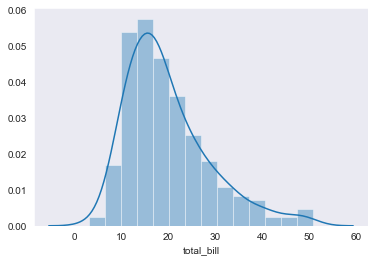

In [59]:
sns.distplot(tips['total_bill'],kde = True);

## Frequency Distribution  

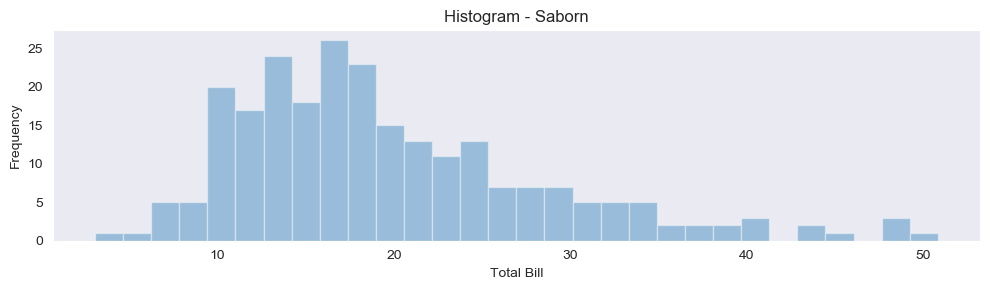

In [60]:
fig , ax = plt.subplots(nrows = 1, ncols = 1, figsize = (10,3), dpi = 100)

sns.distplot(tips['total_bill'],
             kde = False, 
             bins = 30) # removes kernal density estimation 

ax.set_title('Histogram - Saborn')
ax.set_xlabel('Total Bill')
ax.set_ylabel('Frequency')

fig.tight_layout()

## Set Color

To remove the kde layer and just have the histogram use:

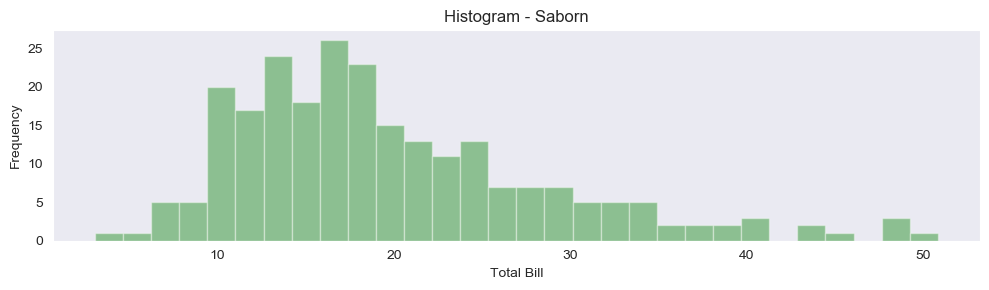

In [61]:
fig , ax = plt.subplots(nrows = 1, ncols = 1, figsize = (10,3), dpi = 100)

sns.distplot(tips['total_bill'],
             kde = False, 
             bins = 30, 
             color = 'green'); # removes kernal density estimation 

ax.set_title('Histogram - Saborn')
ax.set_xlabel('Total Bill')
ax.set_ylabel('Frequency')

fig.tight_layout()

---
## Histograms
Flexibly plot a **univariate** distribution of observations

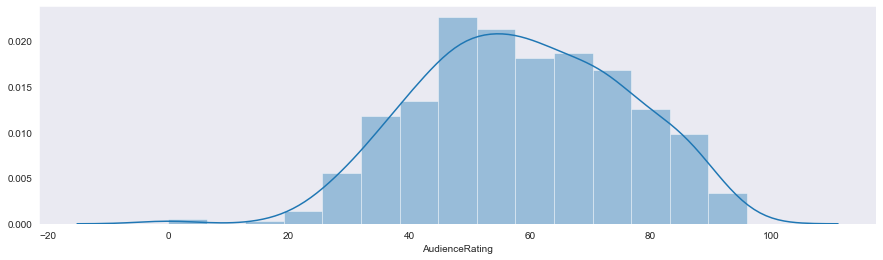

In [62]:
plt.figure(figsize = (15,4))
# Audience rating histogram using seaborn
ml = sns.distplot(movies.AudienceRating, bins = 15)   # sns.distplot(movies['AudienceRating'])

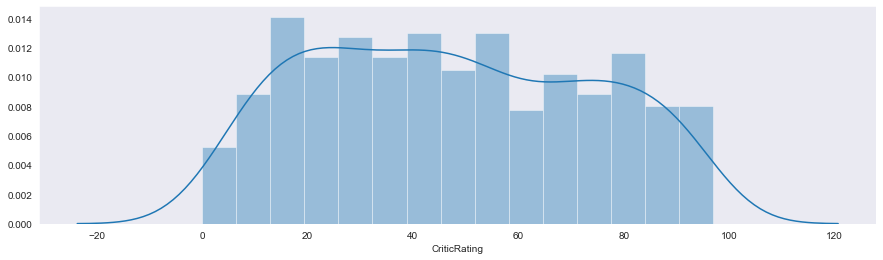

In [63]:
plt.figure(figsize = (15,4))
# Critic rating histogram using seaborn
m2 =sns.distplot(movies.CriticRating, bins =15)

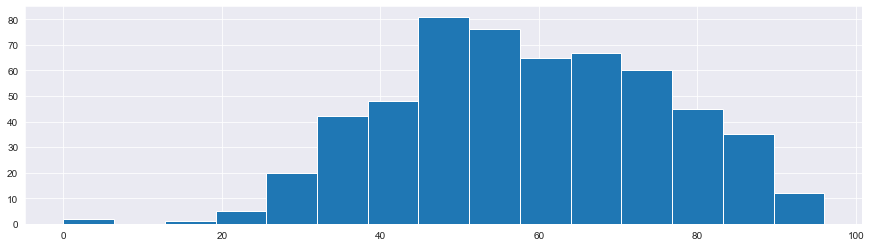

In [29]:
plt.figure(figsize = (15,4))
# Audience rating historgram using pyplot
sns.set_style('darkgrid') 
nl = plt.hist(movies.AudienceRating, bins = 15)

Audience rating appears normally distributed with the middle being somewhere around 50 or 60 percent range and drops off.

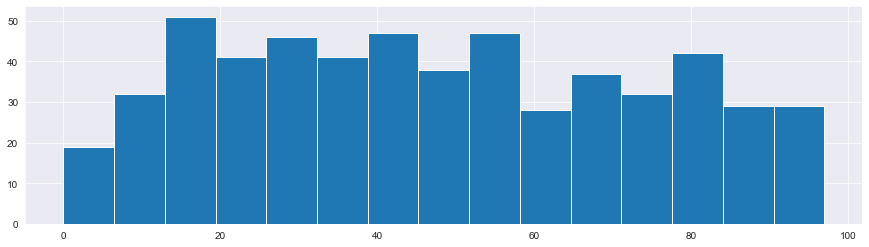

In [30]:
plt.figure(figsize = (15,4))
# Critic rating histogram using pyplot
nl= plt.hist(movies.CriticRating, bins = 15)

Critic ratings are more uniformly distributed

## Stacked Histograms

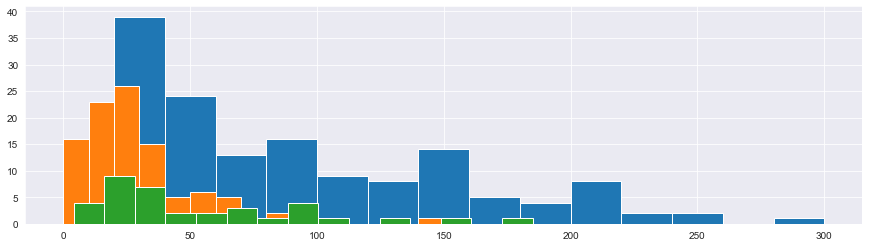

In [32]:
# Histogram with multiple genres
plt.figure(figsize = (15,4))
plt.hist(movies[movies.Genre=='Action'].BudgetMillions, bins = 15)# Create filter then apply to dataframe with brackets and grab BudgetMillions column
plt.hist(movies[movies.Genre =='Drama'].BudgetMillions, bins = 15)
plt.hist(movies[movies.Genre =='Thriller'].BudgetMillions, bins = 15)
plt.show() # hides the additional information without having to assign plot to a variable

For histogram to be stacked, need to pass each genre into the plt.hist function as a list.

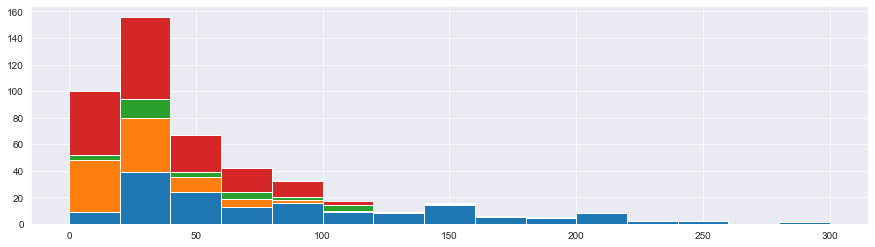

In [34]:
plt.figure(figsize = (15,4))
# Stacked histogram
plt.hist([movies[movies.Genre=='Action'].BudgetMillions,# notice beginning bracket
          movies[movies.Genre =='Drama'].BudgetMillions,
          movies[movies.Genre =='Thriller'].BudgetMillions,
          movies[movies.Genre =='Comedy'].BudgetMillions], # notice closing bracket
          bins = 15, stacked = True) 
plt.show()

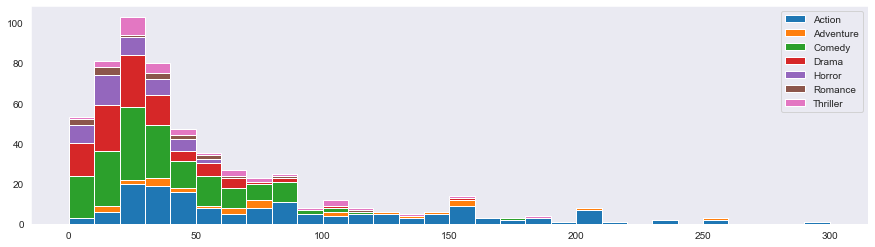

In [77]:
plt.figure(figsize = (15,4))
# Stacked histogram using for loop
list1 = list()  # or list1= []
mylabels = list()
for gen in movies.Genre.cat.categories: # variable that will iterate over list of genres
    list1.append(movies[movies.Genre==gen].BudgetMillions)
    mylabels.append(gen)
    
h = plt.hist(list1, bins = 30, stacked = True, rwidth = 1, label = mylabels)
plt.legend()
plt.show()

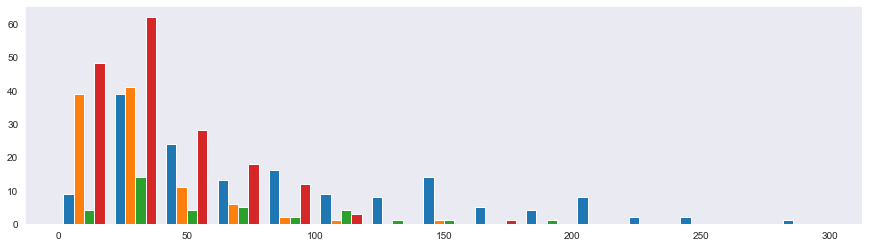

In [76]:
plt.figure(figsize = (15,4))
plt.hist([movies[movies.Genre=='Action'].BudgetMillions,# notice beginning bracket
          movies[movies.Genre =='Drama'].BudgetMillions,
          movies[movies.Genre =='Thriller'].BudgetMillions,
          movies[movies.Genre =='Comedy'].BudgetMillions], # notice closing bracket
          bins = 15, stacked = False) 
plt.show()

## Finishing Touches

findfont: Font family ['Console'] not found. Falling back to DejaVu Sans.


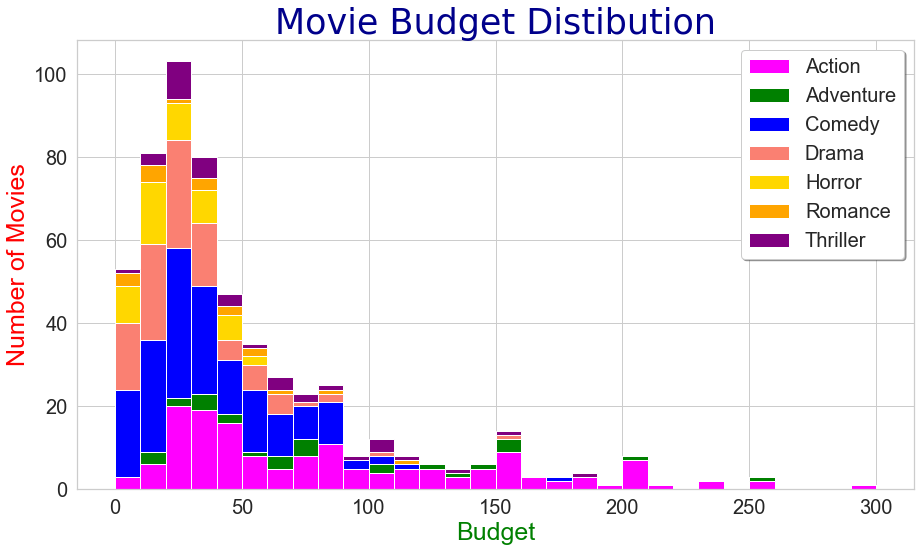

In [112]:
# Stacked histogram with thematic edits
list1 = list()  # or list1= []
mylabels = list()
for gen in movies.Genre.cat.categories: # variable that will iterate over list of genres
    list1.append(movies[movies.Genre==gen].BudgetMillions)
    mylabels.append(gen)

# Create histogram    
sns.set_style('whitegrid')
fig, ax = plt.subplots()
fig.set_size_inches(15,8.27) # width x height size of A4 paper 11.7 x 8.27
h = plt.hist(list1, bins = 30, stacked = True, rwidth = 1, label = mylabels, \
             color = ['Fuchsia','Green','Blue','Salmon','Gold','Orange','Purple']) # see color options below
# Add title
plt.title('Movie Budget Distibution', fontsize = 35,\
          color = 'DarkBlue', fontname = 'Console')

# Add axis labels
plt.ylabel('Number of Movies', fontsize = 25, color = 'Red')
plt.xlabel('Budget', fontsize = 25, color = 'Green')

# Format tick marks
plt.yticks(fontsize = 20)
plt.xticks(fontsize = 20)

# Format legend
plt.legend(frameon = True, fancybox = True, shadow = True,\
           framealpha = 1, prop = {'size':20})
plt.show()

# Jointplot

jointplot() allows you to basically match up two distplots for bivariate data. With your choice of what **kind** parameter to compare with: 
* “scatter” 
* “reg” 
* “resid” 
* “kde” 
* “hex”

## scatter

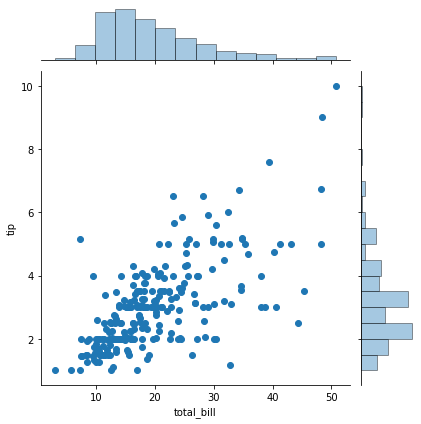

In [8]:
sns.jointplot(x='total_bill',
              y='tip',
              data=tips,kind='scatter');

## Hex

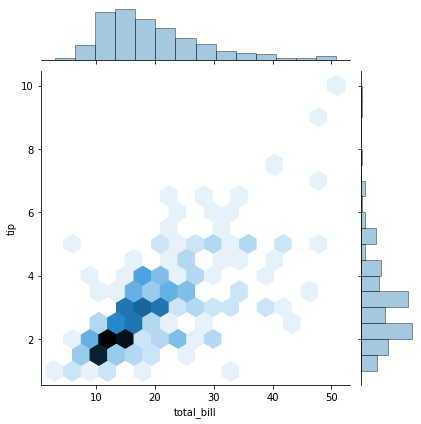

In [9]:
sns.jointplot(x='total_bill',y='tip',data=tips,kind='hex');

## Regression

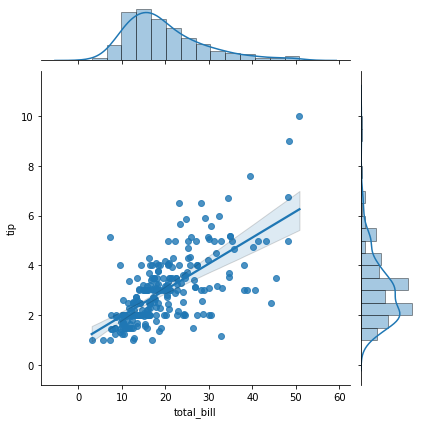

In [10]:
sns.jointplot(data=tips,x='total_bill',y='tip',kind='reg');

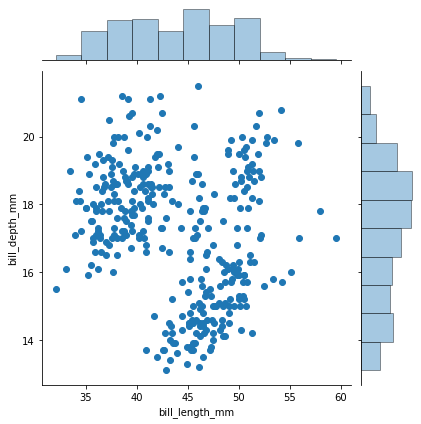

In [5]:
penguins = sns.load_dataset("penguins")
sns.jointplot(data=penguins, x="bill_length_mm", y="bill_depth_mm");

In [6]:
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,FEMALE
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,MALE
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,FEMALE


# Scatter Plot 

In [8]:
tips = sns.load_dataset("tips")
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


Passing long-form data and assigning x and y will draw a scatter plot between two variables:

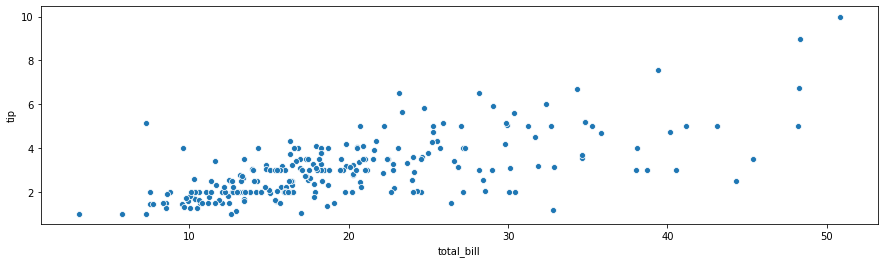

In [9]:
plt.figure(figsize = (15,4))
sns.scatterplot(data=tips, x="total_bill", y="tip");

## Set hue 

will map its levels to the color of the points:

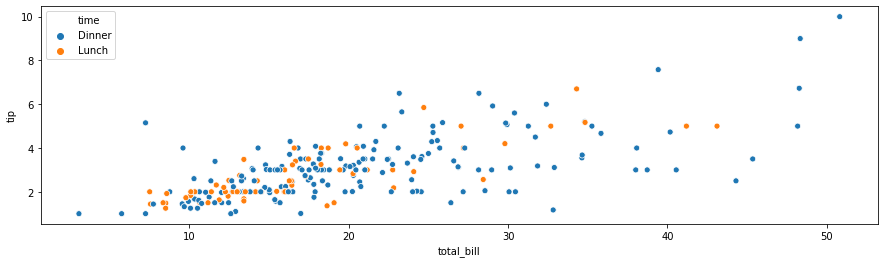

In [13]:
plt.figure(figsize = (15,4))
sns.scatterplot(data=tips, x="total_bill", y="tip", hue="time");

## Set hue and style - Same Variable

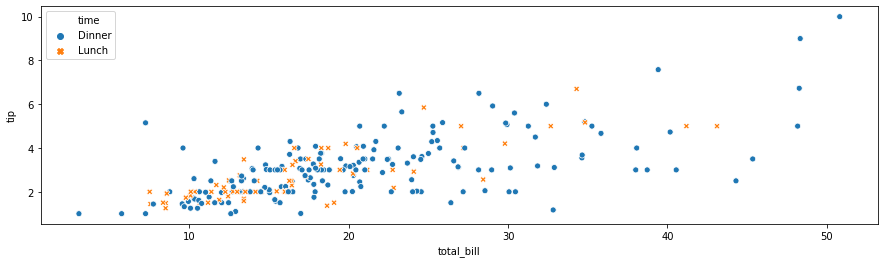

In [14]:
plt.figure(figsize = (15,4))
sns.scatterplot(data=tips, x="total_bill", y="tip", hue="time", style="time");

## Set hue and style - Different Variables

Assigning hue and style to different variables will vary colors and markers independently:

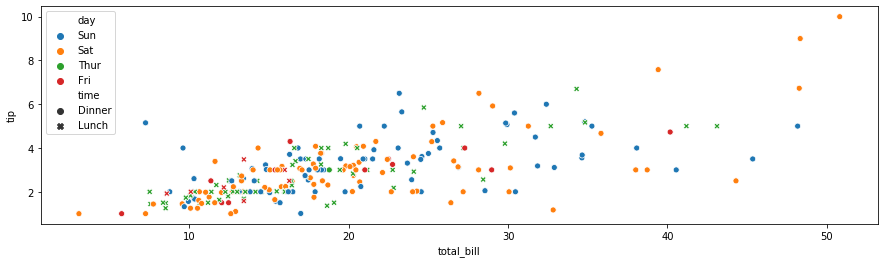

In [15]:
plt.figure(figsize = (15,4))
sns.scatterplot(data=tips, x="total_bill", y="tip", hue="day", style="time");

## Numerical Vars

If the variable assigned to hue is numeric, the semantic mapping will be quantitative and use a different default palette:

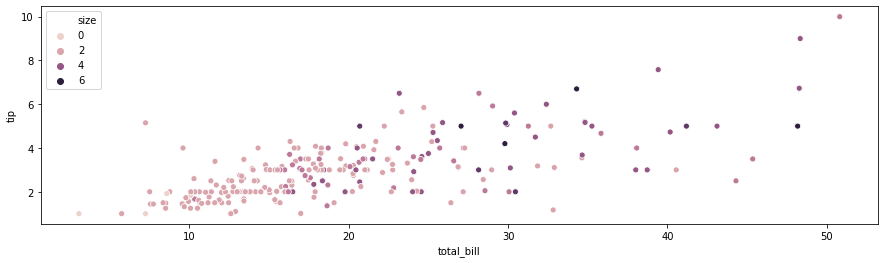

In [16]:
plt.figure(figsize = (15,4))
sns.scatterplot(data=tips, x="total_bill", y="tip", hue="size");

## Categorical Variable  

Pass the name of a categorical palette or explicit colors (as a Python list of dictionary) to force categorical mapping of the hue variable:

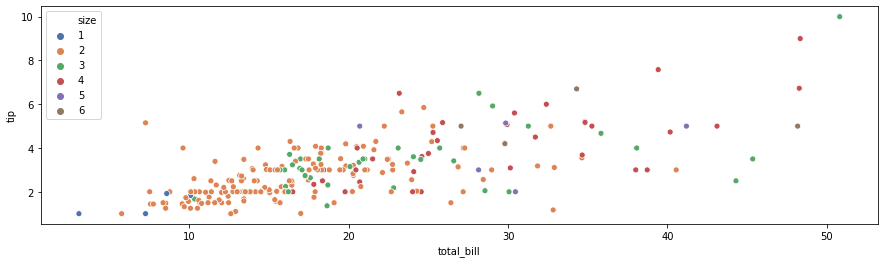

In [17]:
plt.figure(figsize = (15,4))
sns.scatterplot(data=tips, x="total_bill", y="tip", hue="size", palette="deep")

## Large number of unique numeric values

If there are a large number of unique numeric values, the legend will show a representative, evenly-spaced set:

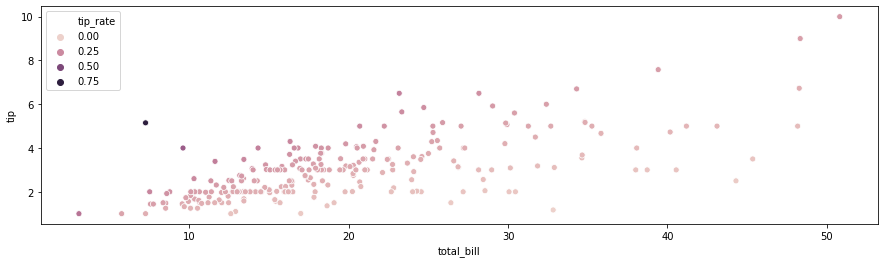

In [18]:
plt.figure(figsize = (15,4))
tip_rate = tips.eval("tip / total_bill").rename("tip_rate")
sns.scatterplot(data=tips, x="total_bill", y="tip", hue=tip_rate);

## Size Values to Variable 

A numeric variable can also be assigned to size to apply a semantic mapping to the areas of the points:

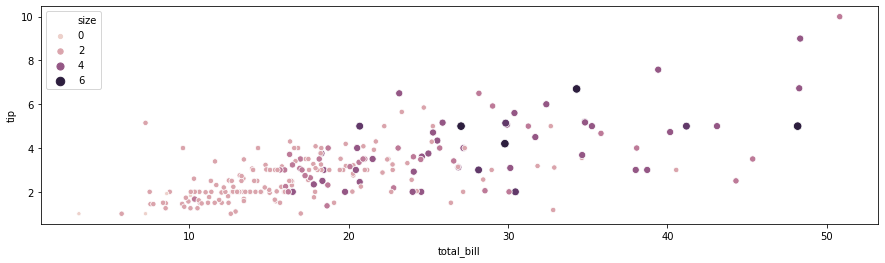

In [19]:
plt.figure(figsize = (15,4))
sns.scatterplot(data=tips, x="total_bill", y="tip", hue="size", size="size");

Control the range of marker areas with sizes, and set lengend="full" to force every unique value to appear in the legend:

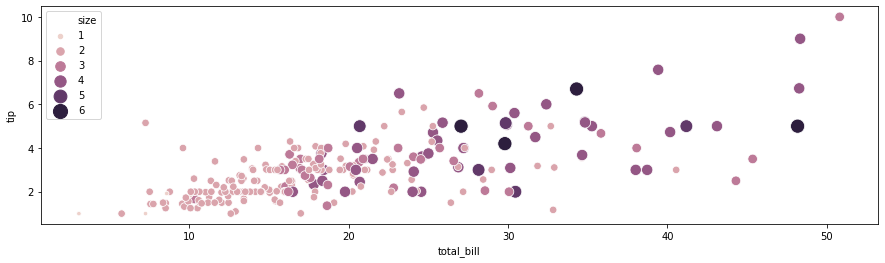

In [20]:
plt.figure(figsize = (15,4))
sns.scatterplot(data=tips, 
                x="total_bill", 
                y="tip", 
                hue="size", 
                size="size",
                sizes=(20, 200), 
                legend="full");

## Normalize values

Pass a tuple of values or a matplotlib.colors.Normalize object to hue_norm to control the quantitative hue mapping:

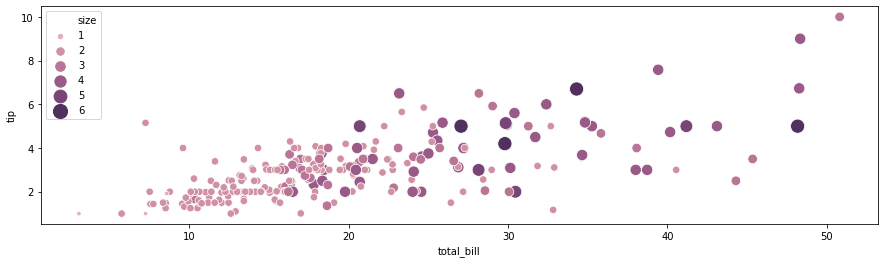

In [21]:
plt.figure(figsize = (15,4))
sns.scatterplot(data = tips, 
                x = "total_bill", 
                y = "tip", 
                hue ="size", 
                size="size",
                sizes=(20, 200), 
                hue_norm=(0, 7), 
                legend="full");

## Control the Specific Markers

Control the specific markers used to map the style variable by passing a Python list or dictionary of marker codes:

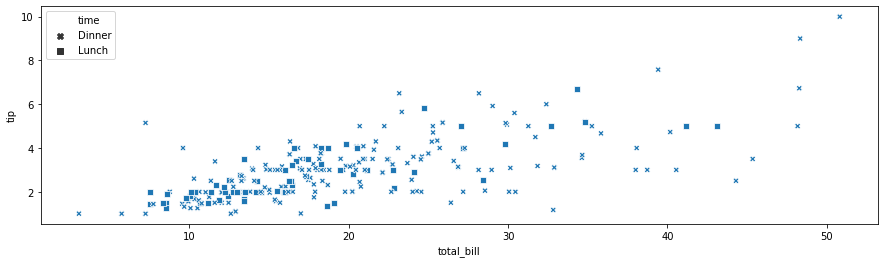

In [23]:
plt.figure(figsize = (15,4))
markers = {"Lunch": "s", "Dinner": "X"}
sns.scatterplot(data=tips, x="total_bill", y="tip", style="time", markers=markers);

Additional keyword arguments are passed to matplotlib.axes.Axes.scatter(), allowing you to directly set the attributes of the plot that are not semantically mapped:

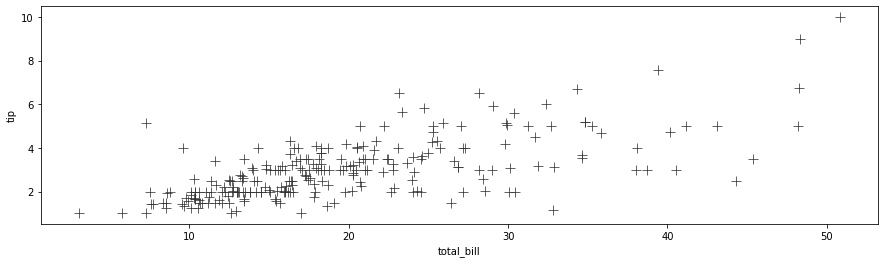

In [24]:
plt.figure(figsize = (15,4))
sns.scatterplot(data=tips, x="total_bill", y="tip", s=100, color=".2", marker="+");

The previous examples used a long-form dataset. When working with wide-form data, each column will be plotted against its index using both hue and style mapping:

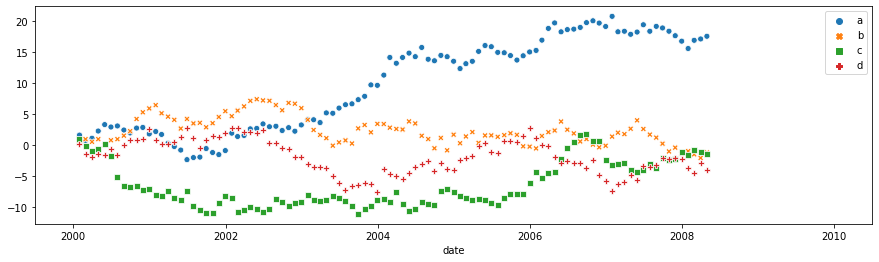

In [25]:
index = pd.date_range("1 1 2000", periods=100, freq="m", name="date")
data = np.random.randn(100, 4).cumsum(axis=0)
wide_df = pd.DataFrame(data, index, ["a", "b", "c", "d"])

plt.figure(figsize = (15,4))
sns.scatterplot(data=wide_df);

## relplot()

Use relplot() to combine scatterplot() and FacetGrid. This allows grouping within additional categorical variables, and plotting them across multiple subplots.

Using relplot() is safer than using FacetGrid directly, as it ensures synchronization of the semantic mappings across facets.

<Figure size 1080x288 with 0 Axes>

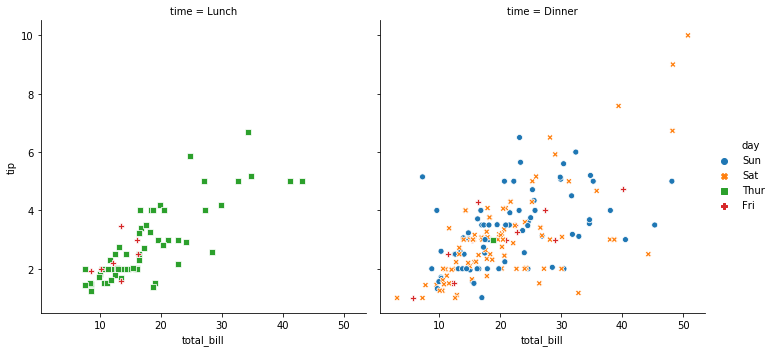

In [26]:
plt.figure(figsize = (15,4))
sns.relplot(data=tips, 
            x="total_bill", 
            y="tip",
            col="time", 
            hue="day", 
            style="day",
            kind="scatter");

# kdeplot

kdeplots are [Kernel Density Estimation plots](http://en.wikipedia.org/wiki/Kernel_density_estimation#Practical_estimation_of_the_bandwidth). These KDE plots replace every single observation with a Gaussian (Normal) distribution centered around that value. For example:

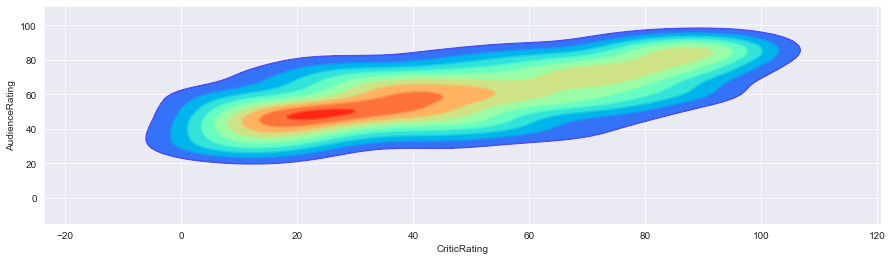

In [53]:
plt.figure(figsize = (15,4))
k1 = sns.kdeplot(movies.CriticRating, movies.AudienceRating, \
                 shade = True, shade_lowest = False, cmap = 'rainbow' )

# Tip: for smoother edges run this line first then re-reun k1
k1b = sns.kdeplot(movies.CriticRating, movies.AudienceRating,\
                  cmap = 'rainbow')

KDE plots shows us where the most density is in the data much better than the scatter plot above.

## Working with Subplots

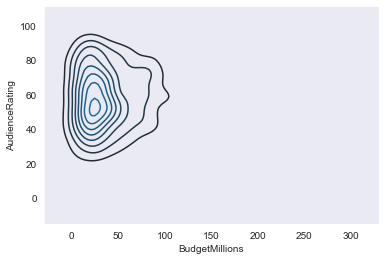

In [54]:
sns.set_style('dark')
k1 = sns.kdeplot(movies.BudgetMillions,movies.AudienceRating)

Audience ratings are concentrated around 50% and follows a uniform distribution.

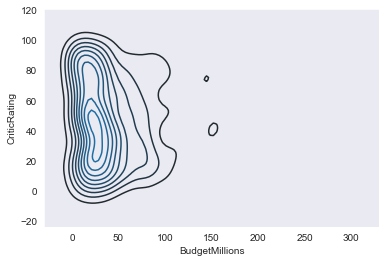

In [55]:
k1 = sns.kdeplot(movies.BudgetMillions, movies.CriticRating)

Shows us Critic Ratings are most concentrated around the 20 and 40 percent mark and then they stretch out. The plot also suggests more of a uniform distribution.

Creating a subplot would allow for better comparison of the two graphs.

[(-20, 160)]

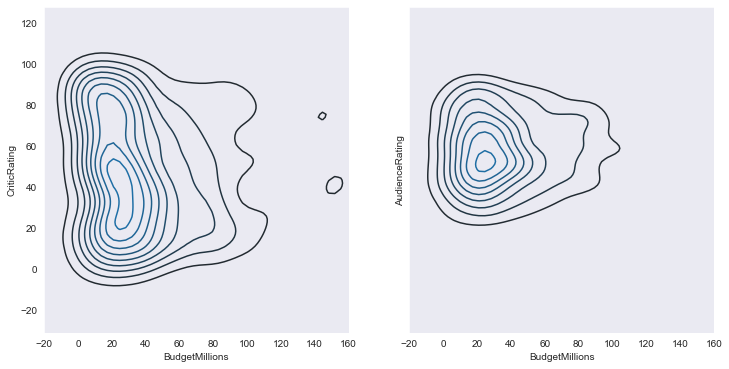

In [80]:
# Creating subplot
f, axes = plt.subplots(1,2, figsize = (12,6),sharex=True,sharey= True) # creates subplot of 1 row and 2 columns
k1 = sns.kdeplot(movies.BudgetMillions, movies.CriticRating, ax = axes[0])
k2 = sns.kdeplot(movies.BudgetMillions, movies.AudienceRating, ax = axes[1])
k1.set(xlim = (-20, 160)) 

By plotting them side by side, we can visualize how Audience ratings are much more compact than Critic ratings which are spread out.

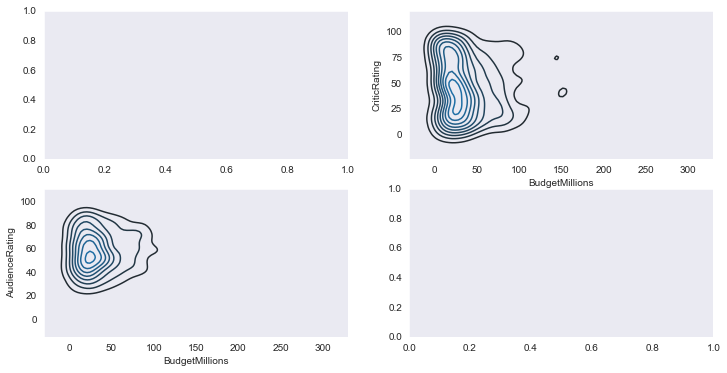

In [81]:
# Creating two dimensional set of subplots
f, axes = plt.subplots(2,2, figsize = (12,6))
k1 = sns.kdeplot(movies.BudgetMillions, movies.CriticRating, ax = axes[0,1])
k2 = sns.kdeplot(movies.BudgetMillions, movies.AudienceRating, ax = axes[1,0])

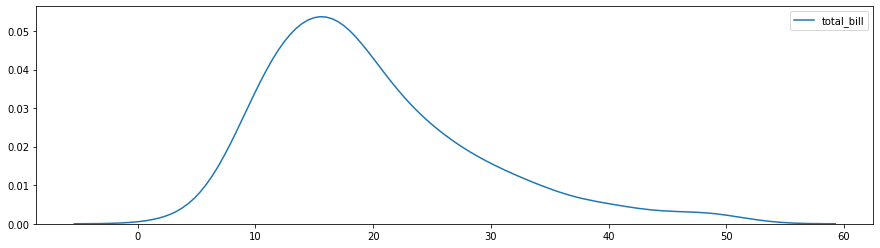

In [27]:
plt.figure(figsize = (15,4))
sns.kdeplot(tips['total_bill']);

(0, 1)

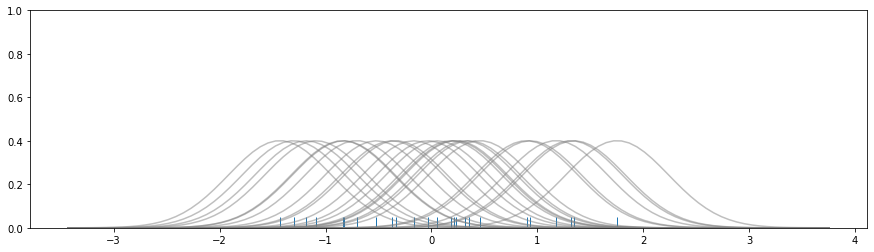

In [28]:
# Don't worry about understanding this code!
# It's just for the diagram below
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

plt.figure(figsize = (15,4))

#Create dataset
dataset = np.random.randn(25)

# Create another rugplot
sns.rugplot(dataset);

# Set up the x-axis for the plot
x_min = dataset.min() - 2
x_max = dataset.max() + 2

# 100 equally spaced points from x_min to x_max
x_axis = np.linspace(x_min,x_max,100)

# Set up the bandwidth, for info on this:
url = 'http://en.wikipedia.org/wiki/Kernel_density_estimation#Practical_estimation_of_the_bandwidth'

bandwidth = ((4*dataset.std()**5)/(3*len(dataset)))**.2


# Create an empty kernel list
kernel_list = []

# Plot each basis function
for data_point in dataset:
    
    # Create a kernel for each point and append to list
    kernel = stats.norm(data_point,bandwidth).pdf(x_axis)
    kernel_list.append(kernel)
    
    #Scale for plotting
    kernel = kernel / kernel.max()
    kernel = kernel * .4
    plt.plot(x_axis,kernel,color = 'grey',alpha=0.5)

plt.ylim(0,1)

# Rugplot

rugplots are actually a very simple concept, they just draw a dash mark for every point on a univariate distribution. They are the building block of a KDE plot:

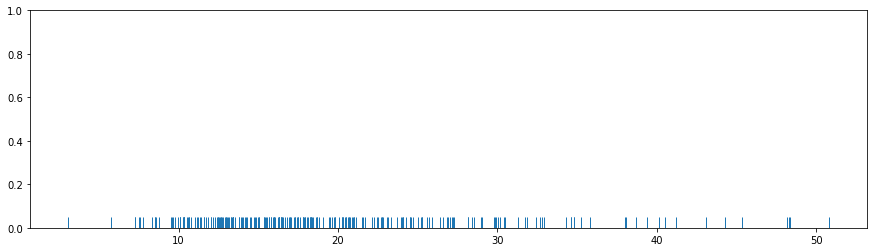

In [29]:
plt.figure(figsize = (15,4))
sns.rugplot(tips['total_bill']);

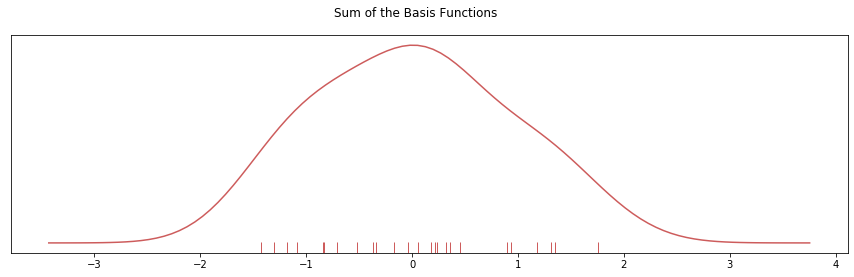

In [30]:
# To get the kde plot we can sum these basis functions.
plt.figure(figsize = (15,4))

# Plot the sum of the basis function
sum_of_kde = np.sum(kernel_list,axis=0)

# Plot figure
fig = plt.plot(x_axis,sum_of_kde,color='indianred')

# Add the initial rugplot
sns.rugplot(dataset,c = 'indianred')

# Get rid of y-tick marks
plt.yticks([])

# Set title
plt.suptitle("Sum of the Basis Functions");

So with our tips dataset:

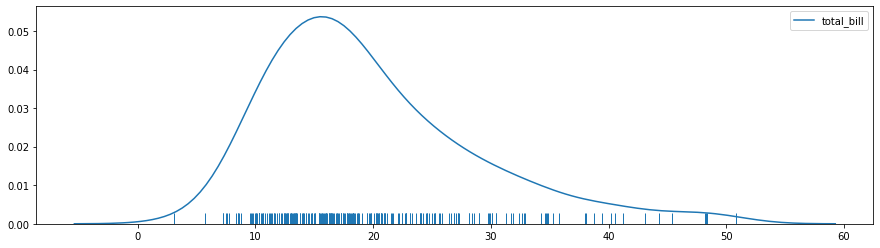

In [31]:
plt.figure(figsize = (15,4))
sns.kdeplot(tips['total_bill'])
sns.rugplot(tips['total_bill']);

In [ ]:
plt.figure(figsize = (15,4))
sns.kdeplot(tips['tip'])
sns.rugplot(tips['tip']);

# Categorical Plots

## Bar plot

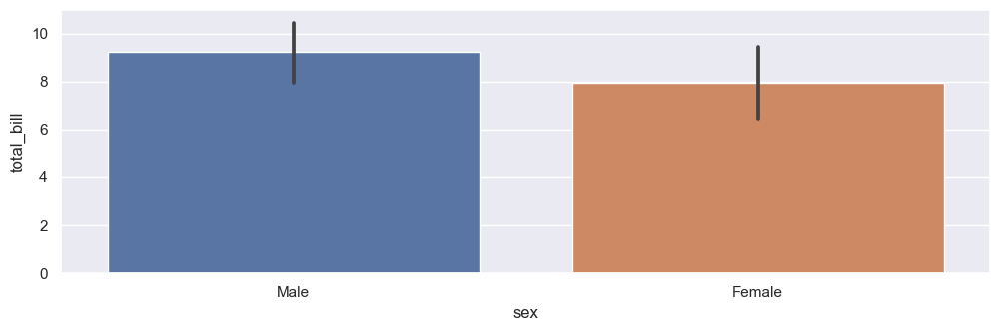

In [97]:
sns.set()
plt.figure(figsize=(12, 3.5), dpi=100)
sns.barplot(x ='sex' ,y = 'total_bill',data = tips, estimator = np.std) #default is mean

## Count plot

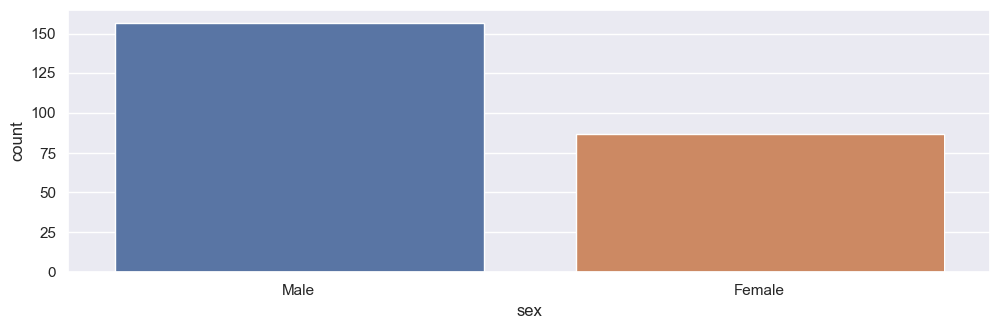

In [99]:
plt.figure(figsize=(12, 3.5), dpi=100)
sns.countplot(x= 'sex', data = tips); # same as bar plot except y axis already chosen

## Styles

You can set particular styles:

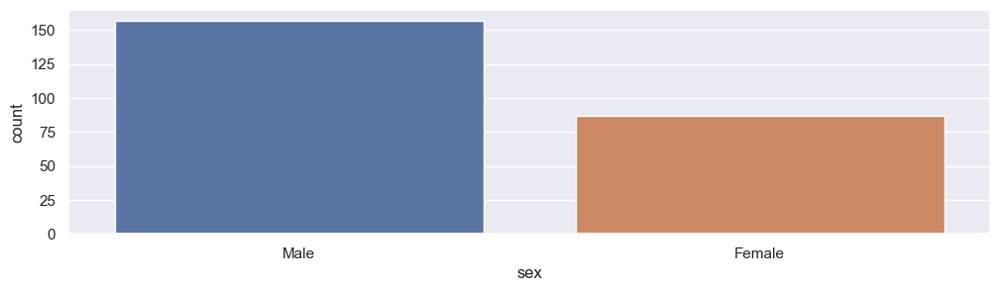

In [100]:
plt.figure(figsize=(12, 3.0), dpi=100)
sns.countplot(x='sex',data=tips);

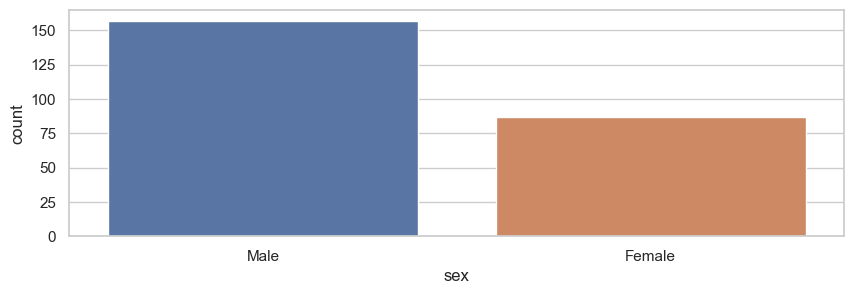

In [101]:
sns.set_style('whitegrid')
plt.figure(figsize=(10, 3), dpi=100)
sns.countplot(x='sex',data=tips);

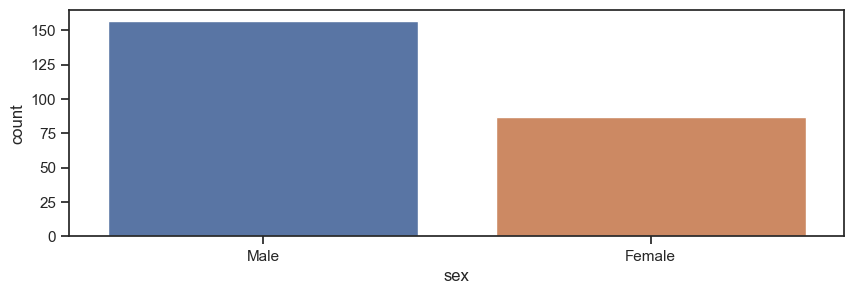

In [102]:
sns.set_style('ticks')
plt.figure(figsize=(10, 3), dpi=100)
sns.countplot(x='sex',data=tips,palette='deep');

## Spine Removal

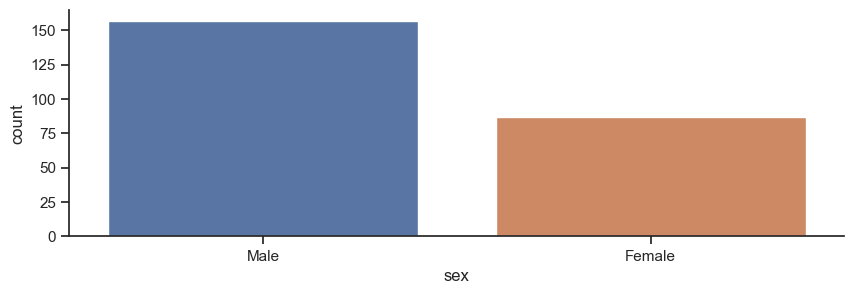

In [103]:
plt.figure(figsize=(10, 3), dpi=100)
sns.countplot(x='sex',data=tips)
sns.despine();

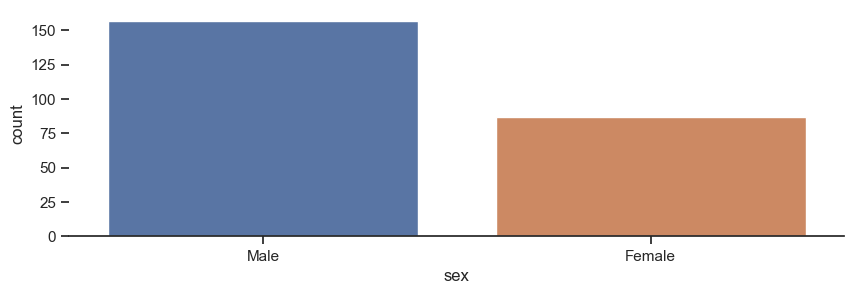

In [104]:
plt.figure(figsize=(10, 3), dpi=100)
sns.countplot(x='sex',data=tips)
sns.despine(left=True);

## Movie comparison revisited
In this activity, we will use a bar plot to compare movie scores. You are given five movies with scores from Rotten Tomatoes. The Tomatometer is the percentage of approved Tomatometer critics who have given a positive review for the movie. The Audience Score is the percentage of users who have given a score of 3.5 or higher out of 5. Compare these two scores among the five movies.

In [38]:
mydata = pd.read_csv("dados/movie_scores.csv")

In [39]:
mydata

,Unnamed: 0,MovieTitle,Tomatometer,AudienceScore
0,0,The Shape of Water,91,73
1,1,Black Panther,97,79
2,2,Dunkirk,92,81
3,3,The Martian,91,91
4,4,The Hobbit: An Unexpected Journey,64,83


In [40]:
movie_scores = pd.melt(mydata, id_vars = ['MovieTitle'], 
                            value_vars = ['Tomatometer', 'AudienceScore'], 
                              var_name = 'Type', 
                            value_name ='Score')

In [41]:
movie_scores

,MovieTitle,Type,Score
0,The Shape of Water,Tomatometer,91
1,Black Panther,Tomatometer,97
2,Dunkirk,Tomatometer,92
3,The Martian,Tomatometer,91
4,The Hobbit: An Unexpected Journey,Tomatometer,64
5,The Shape of Water,AudienceScore,73
6,Black Panther,AudienceScore,79
7,Dunkirk,AudienceScore,81
8,The Martian,AudienceScore,91
9,The Hobbit: An Unexpected Journey,AudienceScore,83


Use Seaborn to create a visually-appealing bar plot comparing the two scores for all five movies.

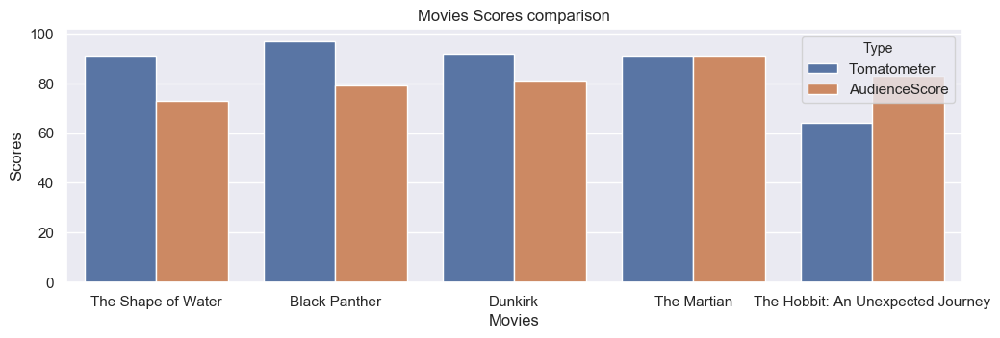

In [45]:
sns.set()
plt.figure(figsize=(12, 3.5), dpi=100)
# Create bar plot
ax = sns.barplot("MovieTitle", "Score", hue="Type", data=movie_scores)
plt.xticks(rotation=0)
# Add title
plt.title("Movies Scores comparison")
plt.xlabel("Movies")
plt.ylabel("Scores")
# Show plot
plt.show()

## Top 30 YouTube Channels
In this activity FacetGrid is used to show the number of subscribers and the number of views for the top 30 YouTube channels.

In [46]:
mydata = pd.read_csv("dados/youtube.csv")

In [47]:
mydata.head()

,channels,subs,views
0,PewDiePie,83.1,20329
1,T-Series,82.9,61057
2,5-Minute Crafts,48.0,12061
3,Canal KondZilla,46.1,22878
4,Justin Bieber,43.1,601


In [48]:
data = pd.melt(mydata, id_vars = ['channels'], 
                       value_vars = ['subs', 'views'], 
                         var_name = 'Type', 
                       value_name ='Subscribers in millions')

In [49]:
data.head()

,channels,Type,Subscribers in millions
0,PewDiePie,subs,83.1
1,T-Series,subs,82.9
2,5-Minute Crafts,subs,48.0
3,Canal KondZilla,subs,46.1
4,Justin Bieber,subs,43.1


Visualize the given data using a FacetGrid with two columns. The first column should show the number of subscribers for each YouTube channel, whereas the second column should show the number of views.

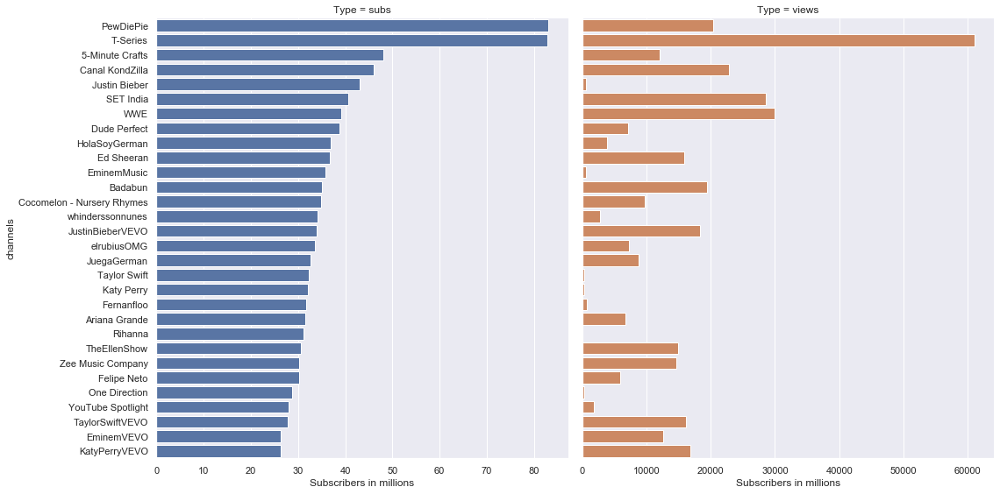

In [50]:
sns.set()
g = sns.FacetGrid(data, col='Type', hue='Type', sharex=False, height=8)
g.map(sns.barplot, 'Subscribers in millions', 'channels')
plt.show()

## Boxplot 

### Simple Boxplot 

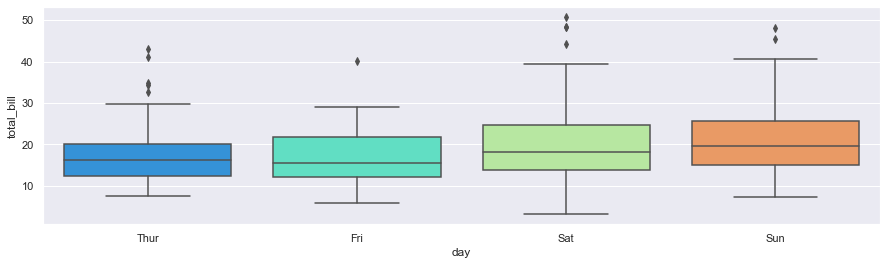

In [52]:
plt.figure(figsize = (15,4))
sns.boxplot(x="day", y="total_bill", data=tips,palette='rainbow');

### With legend into

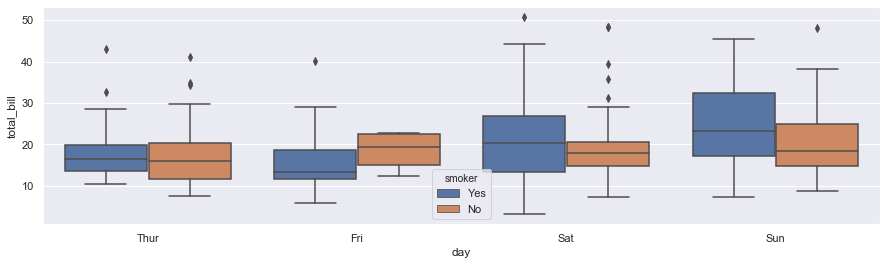

In [51]:
plt.figure(figsize = (15,4))
sns.boxplot(x = 'day', y = 'total_bill', data = tips, hue = 'smoker'); # x is categorical, y is numerical

### With plot horizontal (orient='h')

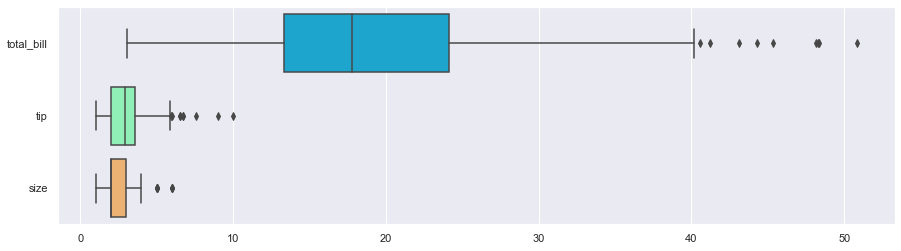

In [53]:
plt.figure(figsize = (15,4))
sns.boxplot(data=tips,palette='rainbow',orient='h');

### With legend outside 

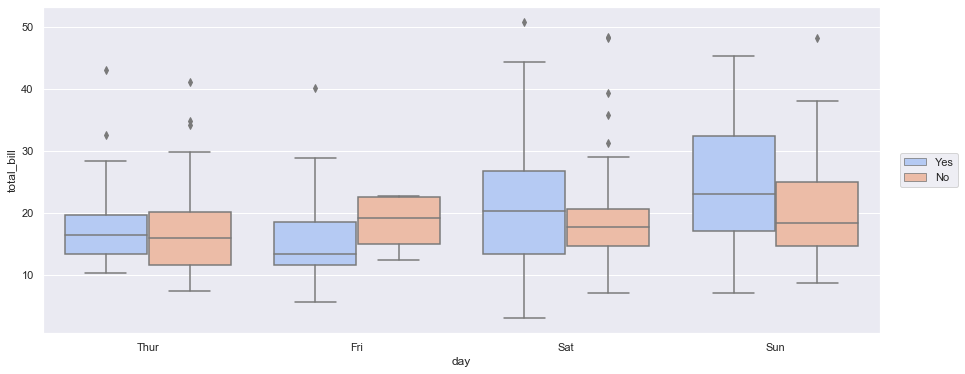

In [87]:
plt.figure(figsize = (15,6))
g = sns.boxplot(x = "day", 
                y = "total_bill", 
                hue = "smoker",
                data = tips, 
                palette = "coolwarm").legend(loc=5, bbox_to_anchor=(1.10, 0.5), ncol=1);

### Rating Movies by Genre

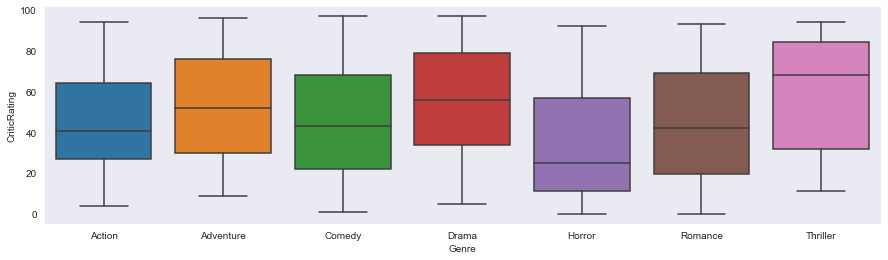

In [90]:
plt.figure(figsize = (15,4))
w = sns.boxplot(data = movies, x = 'Genre', y = 'CriticRating') # x-axis is categorical for box plots

### Intelligence Quotient
In this activity, we will compare IQ scores among different test groups using Seaborn.

In [88]:
mydata = pd.read_csv("dados/scores.csv")

In [89]:
mydata.columns = ['Group A', 'Group B', 'Group C', 'Group D']

In [90]:
data = pd.melt(mydata) 

In [91]:
data.head()

,variable,value
0,Group A,118
1,Group A,103
2,Group A,125
3,Group A,107
4,Group A,111


In [92]:
data = data.rename(columns = {'variable':'Groups','value':'IQ score'})

In [93]:
data.head()

,Groups,IQ score
0,Group A,118
1,Group A,103
2,Group A,125
3,Group A,107
4,Group A,111


Create a box plot for each of the IQ scores of different test groups using Seaborn's boxplot function. Use the whitegrid style, set the context to talk, and remove all axes splines, except the one on the bottom. Add a title.

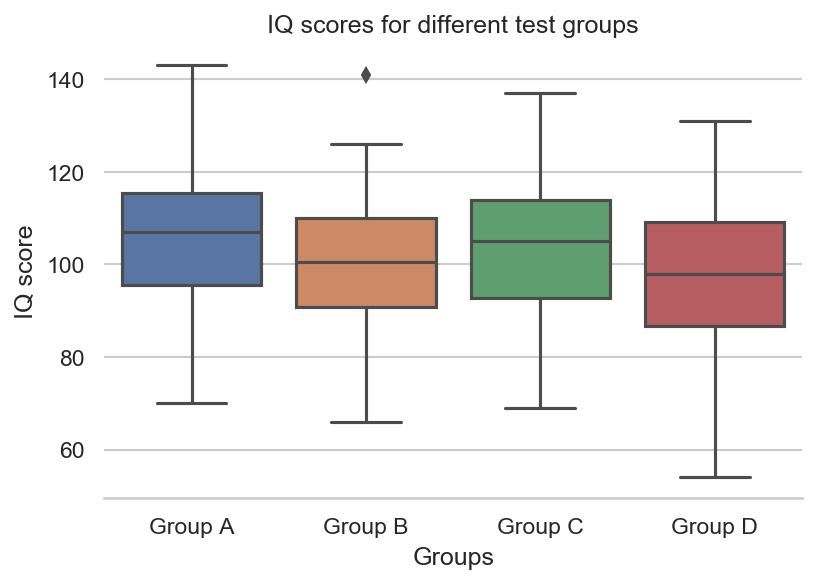

In [94]:
plt.figure(dpi=150)
# Set style
sns.set_style('whitegrid')
# Create boxplot
sns.boxplot(x = 'Groups',y = 'IQ score', data=data)
# Despine
sns.despine(left=True, right=True, top=True)

# Add title
plt.title('IQ scores for different test groups')
# Show plot
plt.show()

## Violin Plot
A violin plot plays a similar role as a box and whisker plot. It shows the distribution of quantitative data across several levels of one (or more) categorical variables such that those distributions can be compared. Unlike a box plot, in which all of the plot components correspond to actual datapoints, the violin plot features a kernel density estimation of the underlying distribution.

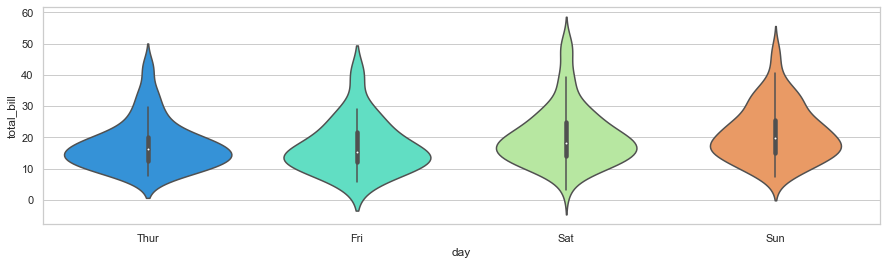

In [96]:
plt.figure(figsize = (15,4))
sns.violinplot(x="day", y="total_bill", data=tips,palette='rainbow');

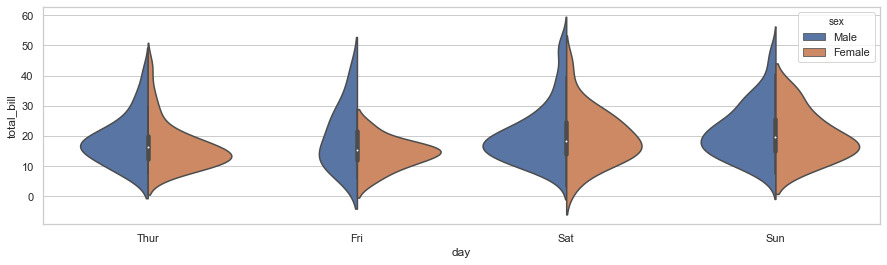

In [95]:
plt.figure(figsize = (15,4))
sns.violinplot(x = 'day', y = 'total_bill', data = tips, hue = 'sex', split = True);

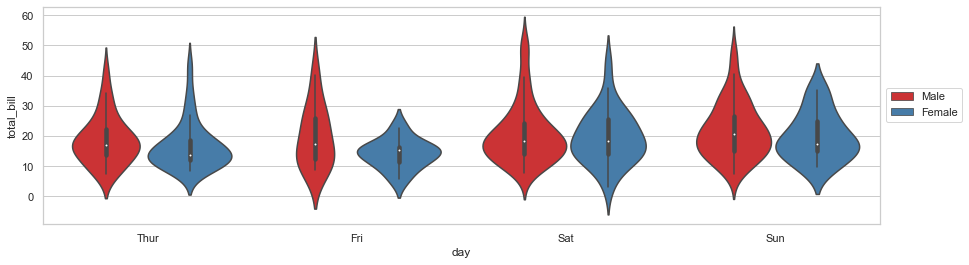

In [112]:
plt.figure(figsize = (15,4))
g = sns.violinplot(x="day", y="total_bill", data=tips,hue='sex',palette='Set1')
g.legend(loc='center right', bbox_to_anchor=(1.105, 0.55), ncol=1);

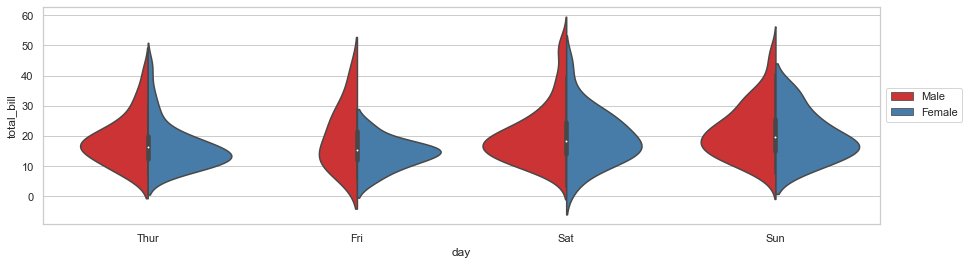

In [113]:
plt.figure(figsize = (15,4))
g = sns.violinplot(x="day", y="total_bill", data=tips,hue='sex',split=True,palette='Set1')
g.legend(loc='center right', bbox_to_anchor=(1.105, 0.55), ncol=1);

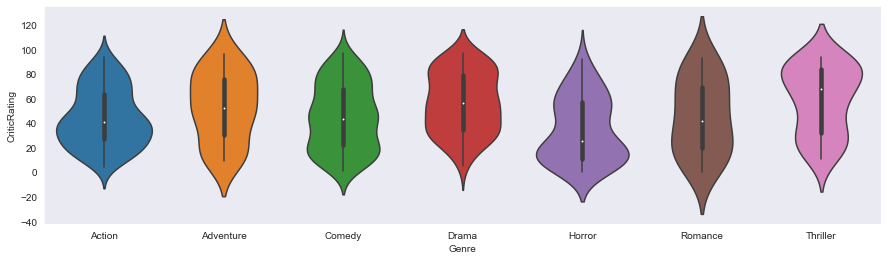

In [94]:
plt.figure(figsize = (15,4))
z = sns.violinplot(data = movies, x = 'Genre', y = 'CriticRating');

### Violin Plots vs Box Plots

A box plot (or box-and-whisker plot) shows the distribution of quantitative data in a way that facilitates comparisons between variables or across levels of a categorical variable. 

The box shows the quartiles of the dataset while the whiskers extend to show the rest of the distribution, except for points that are determined to be "outliers" using a method that is a function of the inter-quartile range.

The median critic rating is the lowest for Horror movies and the highest median critic rating is for thrillers.  
For each boxplot, the smaller piece means more dots fall in that area.  


### Violin Plots
A violin plot plays a similar role as a box and whisker plot. It shows the distribution of quantitative data across several levels of one (or more) **categorical variables** such that those distributions can be compared. 

Two columns are required to create a Violin plot: one categorical, one numeric.

Unlike a box plot, in which all of the plot components correspond to actual datapoints, the violin plot features a kernel density estimation of the underlying distribution.

### Creating two dimensional set of subplots

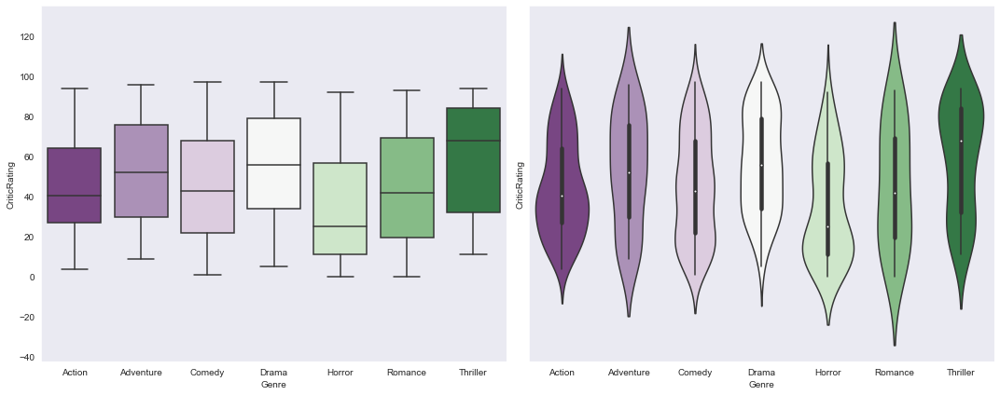

In [93]:
f, axes = plt.subplots(1,2, figsize = (15,6), sharex=True, sharey = True)
w = sns.boxplot(data = movies, x ='Genre', y = 'CriticRating', ax = axes[0], palette='PRGn' )
z = sns.violinplot(data= movies, x = 'Genre', y = 'CriticRating',ax = axes[1],palette='PRGn' )
f.tight_layout()

### Boxplot for Drama genre

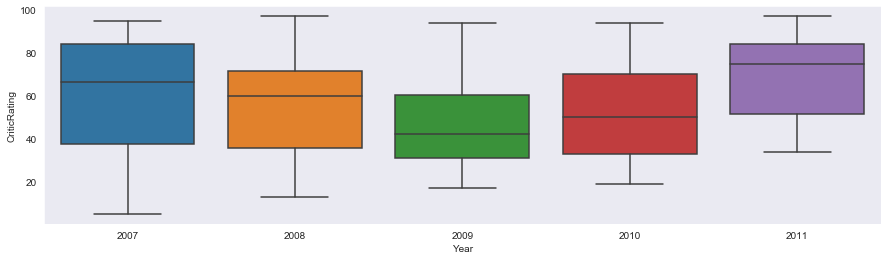

In [95]:
plt.figure(figsize = (15,4))
w = sns.boxplot(data= movies[movies['Genre']=='Drama'], x = 'Year', y  = 'CriticRating')

### Violin plot for Drama genre

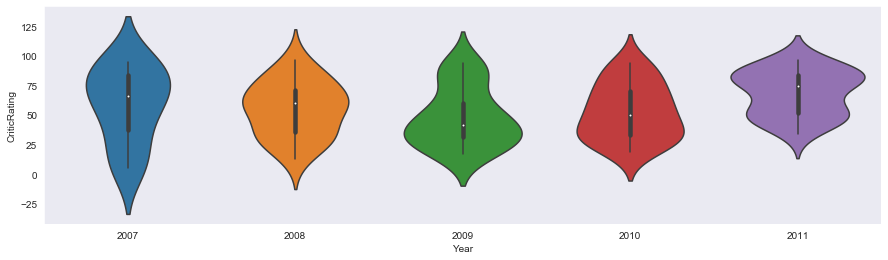

In [96]:
plt.figure(figsize = (15,4))
z = sns.violinplot(data = movies[movies['Genre']=='Drama'], x = 'Year', y = 'CriticRating')

### Drama box plot vs Drama violin plot

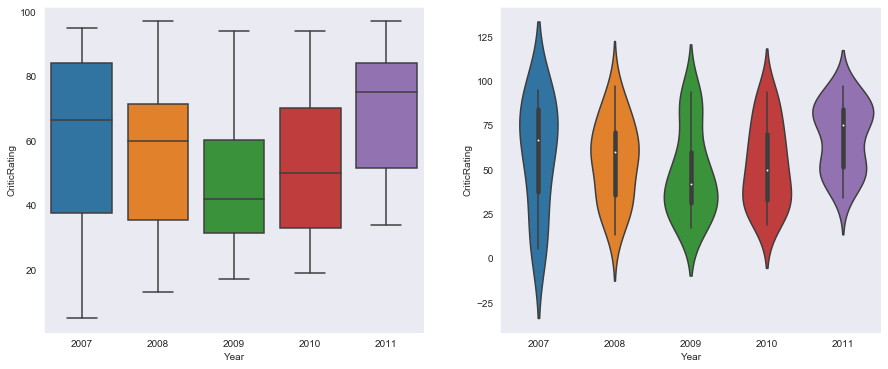

In [87]:
f, axes = plt.subplots(1,2, figsize = (15,6))
w = sns.boxplot(data = movies[movies['Genre']=='Drama'], x = 'Year', y = 'CriticRating', ax = axes[0])
z = sns.violinplot(data= movies[movies['Genre']=='Drama'], x = 'Year', y = 'CriticRating', ax = axes[1])

## Stripplot and Swarmplot
The stripplot will draw a scatterplot where one variable is categorical. A strip plot can be drawn on its own, but it is also a good complement to a box or violin plot in cases where you want to show all observations along with some representation of the underlying distribution.

The swarmplot is similar to stripplot(), but the points are adjusted (only along the categorical axis) so that they don’t overlap. This gives a better representation of the distribution of values, although it does not scale as well to large numbers of observations (both in terms of the ability to show all the points and in terms of the computation needed to arrange them).

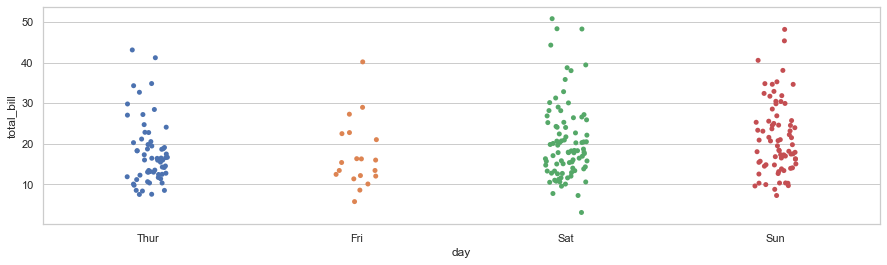

In [99]:
plt.figure(figsize = (15,4))
sns.stripplot(x="day", y="total_bill", data=tips);

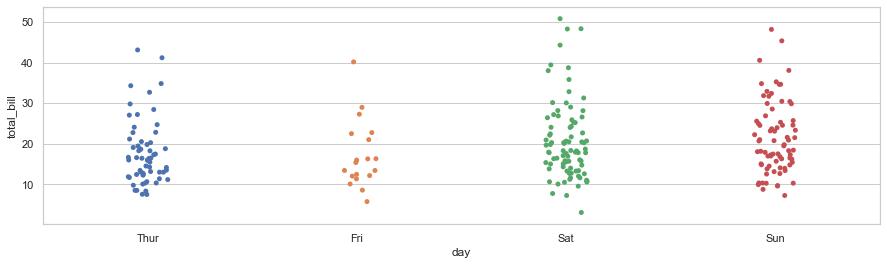

In [102]:
plt.figure(figsize = (15,4))
sns.stripplot(x="day", y="total_bill", data=tips,jitter=True);

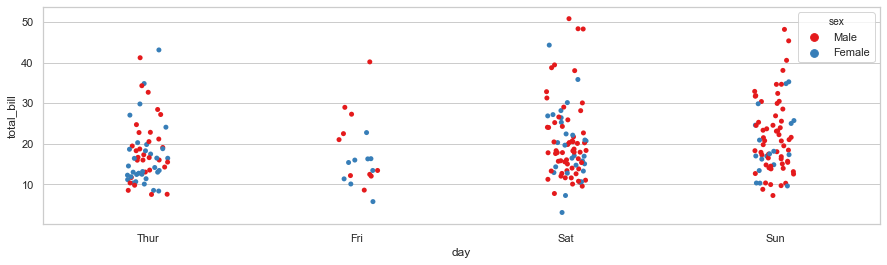

In [101]:
plt.figure(figsize = (15,4))
sns.stripplot(x="day", y="total_bill", data=tips,jitter=True,hue='sex',palette='Set1');

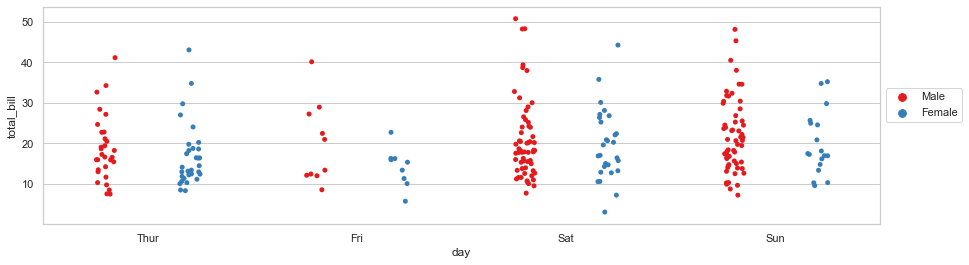

In [114]:
plt.figure(figsize = (15,4))
g = sns.stripplot(x="day", y="total_bill", data=tips,jitter=True,hue='sex',palette='Set1',split=True)
g.legend(loc='center right', bbox_to_anchor=(1.105, 0.55), ncol=1);

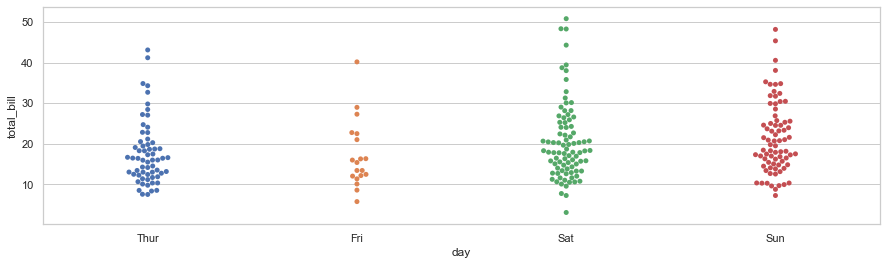

In [115]:
plt.figure(figsize = (15,4))
sns.swarmplot(x="day", y="total_bill", data=tips);

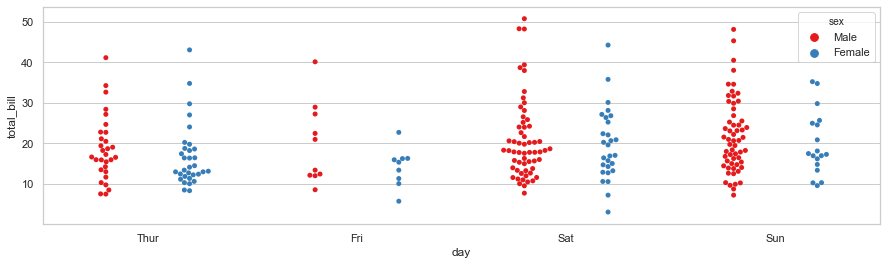

In [116]:
plt.figure(figsize = (15,4))
sns.swarmplot(x="day", y="total_bill",hue='sex',data=tips, palette="Set1", split=True);

## Combining Categorical Plots

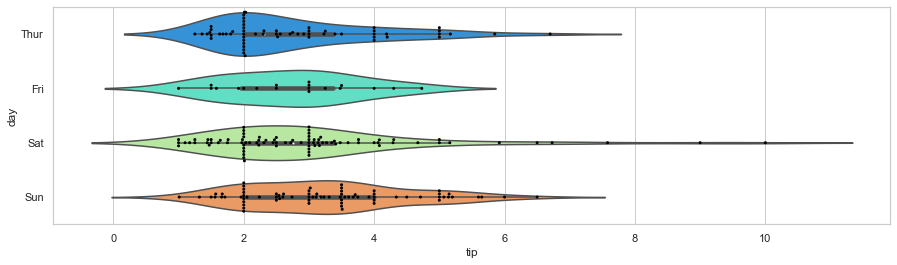

In [117]:
plt.figure(figsize = (15,4))
sns.violinplot(x="tip", y="day", data=tips,palette='rainbow')
sns.swarmplot(x="tip", y="day", data=tips,color='black',size=3);

## factorplot

factorplot is the most general form of a categorical plot. It can take in a **kind** parameter to adjust the plot type:

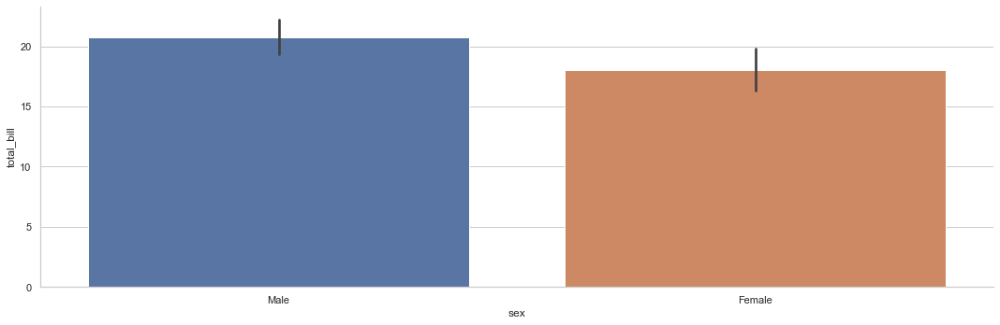

In [119]:
sns.factorplot(x='sex',y='total_bill',data=tips,kind='bar', height = 5, aspect = 3);

## Use more general catplot method to create a plot

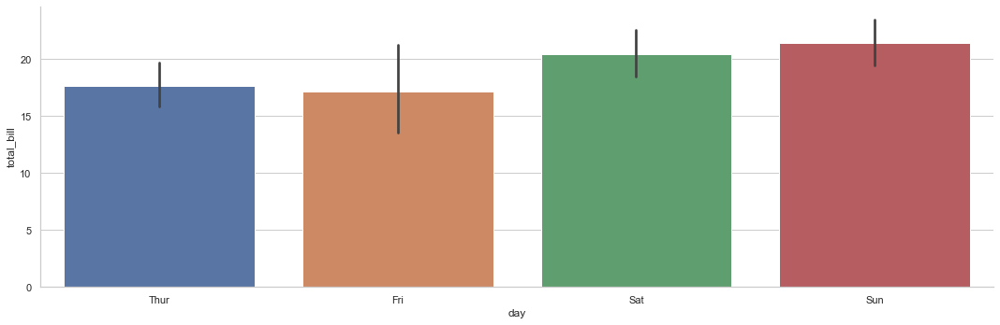

In [120]:
sns.catplot(x = 'day', y = 'total_bill', data = tips, kind = 'bar', height = 5, aspect = 3);

## Size and Aspect

You can use matplotlib's **plt.figure(figsize=(width,height) ** to change the size of most seaborn plots.

You can control the size and aspect ratio of most seaborn grid plots by passing in parameters: size, and aspect. For example:

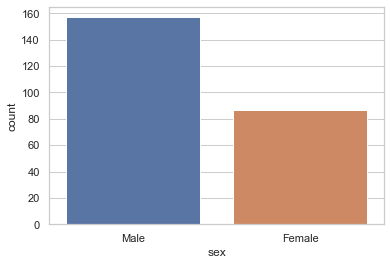

In [122]:
# Non Grid Plot
sns.countplot(x='sex',data=tips);

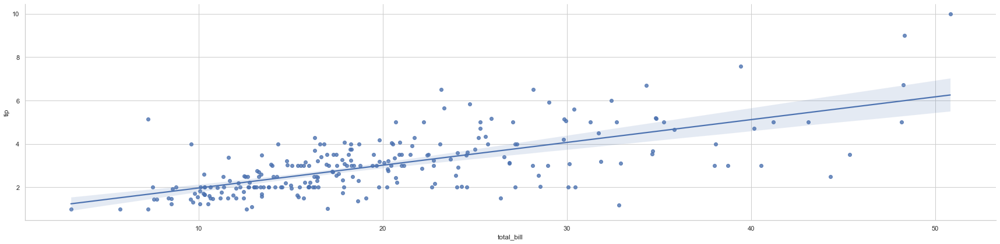

In [124]:
# Grid Type Plot
sns.lmplot(x='total_bill',y='tip',height=6,aspect=4,data=tips);

## Scale and Context

The set_context() allows you to override default parameters:

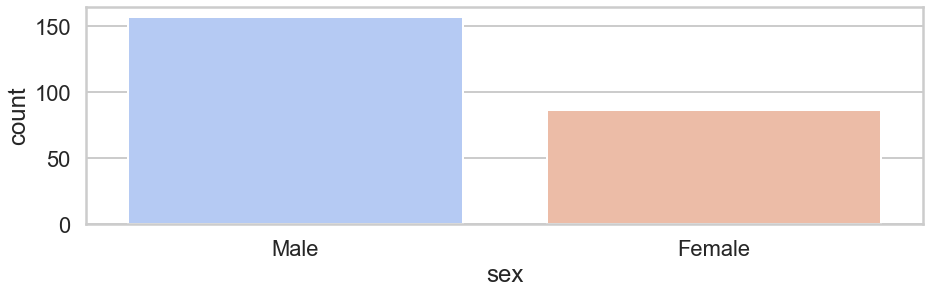

In [127]:
plt.figure(figsize = (15,4))
sns.countplot(x='sex',data=tips,palette='coolwarm');

Check out the documentation page for more info on these topics:
https://stanford.edu/~mwaskom/software/seaborn/tutorial/aesthetics.html

# Heat Maps

## Load data sets

In [129]:
tips = sns.load_dataset('tips')
flights = sns.load_dataset('flights');

In [130]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


## Correlation Matrix

In [131]:
tc = tips.corr() 
tc

,total_bill,tip,size
total_bill,1.000000,0.675734,0.598315
tip,0.675734,1.000000,0.489299
size,0.598315,0.489299,1.000000


## Plot Matrix Correlation

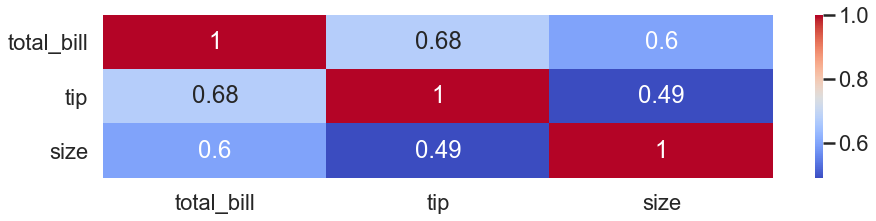

In [135]:
fig, ax = plt.subplots(figsize = (15,3))
sns.heatmap(tc, annot = True, cmap = 'coolwarm');

## View flights data

In [129]:
flights.head()

,year,month,passengers
0,1949,January,112
1,1949,February,118
2,1949,March,132
3,1949,April,129
4,1949,May,121


## Transform data to matrix form by converting a variable column into the index

In [130]:
fp = flights.pivot_table(index = 'month', columns = 'year', values = 'passengers')
fp

year,1949,1950,1951,1952,1953,1954,1955,1956,1957,1958,1959,1960
month,,,,,,,,,,,,
January,112,115,145,171,196,204,242,284,315,340,360,417
February,118,126,150,180,196,188,233,277,301,318,342,391
March,132,141,178,193,236,235,267,317,356,362,406,419
April,129,135,163,181,235,227,269,313,348,348,396,461
May,121,125,172,183,229,234,270,318,355,363,420,472
June,135,149,178,218,243,264,315,374,422,435,472,535
July,148,170,199,230,264,302,364,413,465,491,548,622
August,148,170,199,242,272,293,347,405,467,505,559,606
September,136,158,184,209,237,259,312,355,404,404,463,508


## Another Matrix Heat Map

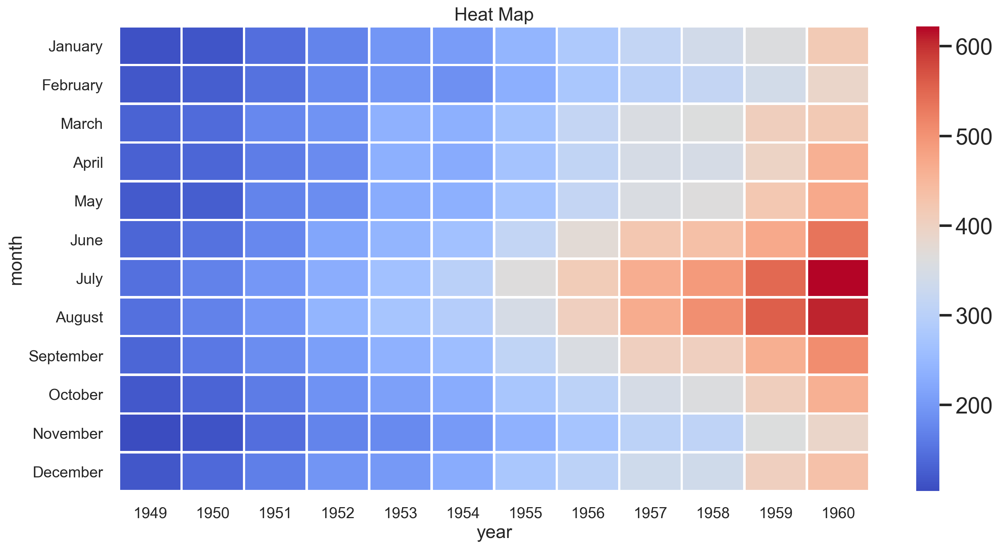

In [131]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (15,8), dpi = 200)

sns.heatmap(fp, cmap = 'coolwarm', linecolor = 'white',linewidths = 2)
ax.set_title('Heat Map',fontsize = 18)
ax.set_xlabel('year',fontsize = 18)
ax.set_ylabel('month',fontsize = 18)
ax.set_xticklabels(ax.get_xticklabels(),fontsize = 15)
ax.set_yticklabels(ax.get_yticklabels(),fontsize = 15);

fig.tight_layout()

## Cluster Maps

In [132]:
import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

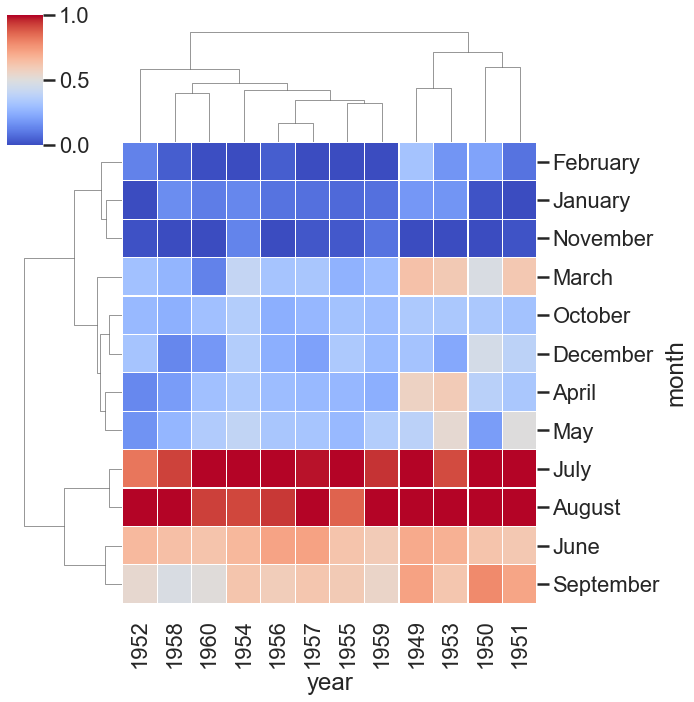

In [133]:
sns.clustermap(fp, 
               cmap = 'coolwarm',
               linecolor = 'white', 
               linewidth = .2, 
               standard_scale = 1);

## Matrix Plots

Matrix plots allow you to plot data as color-encoded matrices and can also be used to indicate clusters within the data (later in the machine learning section we will learn how to formally cluster data).

Let's begin by exploring seaborn's heatmap and clutermap:

In [136]:
flights = sns.load_dataset('flights')

In [137]:
tips = sns.load_dataset('tips')

In [136]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [137]:
flights.head()

,year,month,passengers
0,1949,January,112
1,1949,February,118
2,1949,March,132
3,1949,April,129
4,1949,May,121


## Heatmap

In order for a heatmap to work properly, your data should already be in a matrix form, the sns.heatmap function basically just colors it in for you. For example:

In [138]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [139]:
# Matrix form for correlation data
tips.corr()

,total_bill,tip,size
total_bill,1.000000,0.675734,0.598315
tip,0.675734,1.000000,0.489299
size,0.598315,0.489299,1.000000


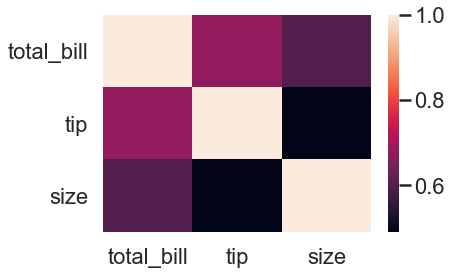

In [140]:
sns.heatmap(tips.corr())

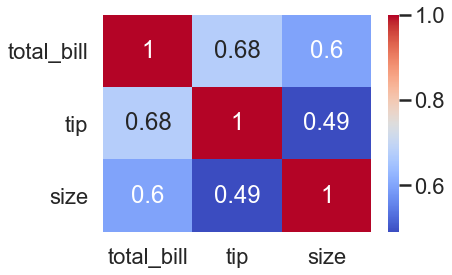

In [141]:
sns.heatmap(tips.corr(),cmap='coolwarm',annot=True)

Or for the flights data:

In [142]:
flights.pivot_table(values='passengers',index='month',columns='year')

year,1949,1950,1951,1952,1953,1954,1955,1956,1957,1958,1959,1960
month,,,,,,,,,,,,
January,112,115,145,171,196,204,242,284,315,340,360,417
February,118,126,150,180,196,188,233,277,301,318,342,391
March,132,141,178,193,236,235,267,317,356,362,406,419
April,129,135,163,181,235,227,269,313,348,348,396,461
May,121,125,172,183,229,234,270,318,355,363,420,472
June,135,149,178,218,243,264,315,374,422,435,472,535
July,148,170,199,230,264,302,364,413,465,491,548,622
August,148,170,199,242,272,293,347,405,467,505,559,606
September,136,158,184,209,237,259,312,355,404,404,463,508


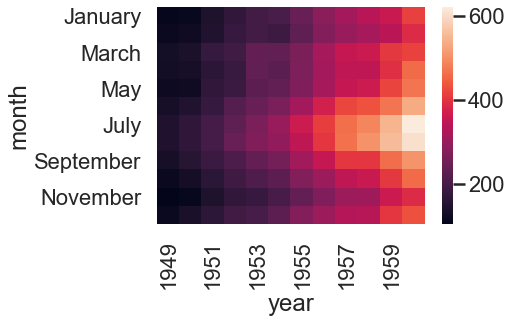

In [143]:
pvflights = flights.pivot_table(values='passengers',index='month',columns='year')
sns.heatmap(pvflights)

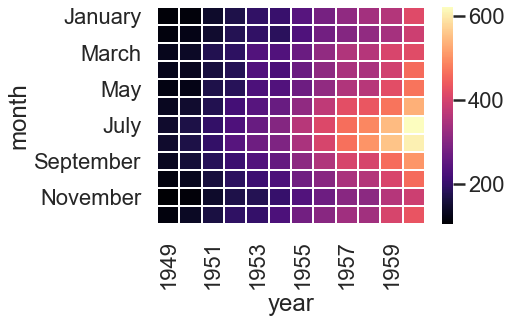

In [144]:
sns.heatmap(pvflights,cmap='magma',linecolor='white',linewidths=1)

## clustermap

The clustermap uses hierarchal clustering to produce a clustered version of the heatmap. For example:

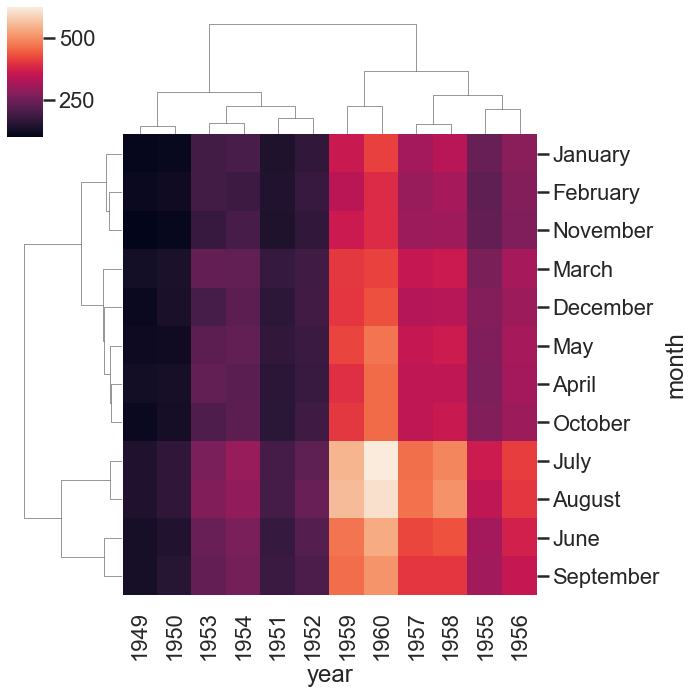

In [145]:
sns.clustermap(pvflights)

Notice now how the years and months are no longer in order, instead they are grouped by similarity in value (passenger count). That means we can begin to infer things from this plot, such as August and July being similar (makes sense, since they are both summer travel months)

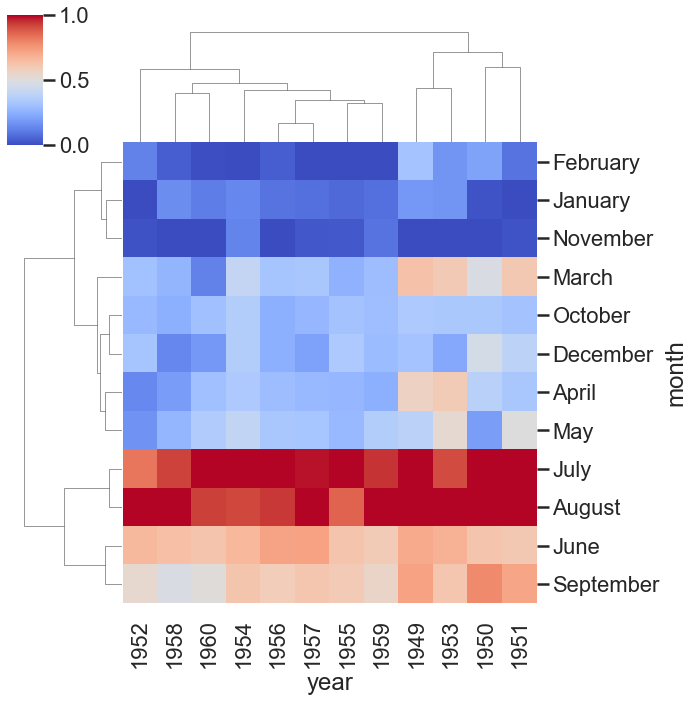

In [146]:
# More options to get the information a little clearer like normalization
sns.clustermap(pvflights,cmap='coolwarm',standard_scale=1)

# Seaborn Grids

Grids are general types of plots that allow you to map plot types to rows and columns of a grid, this helps you create similar plots separated by features.

In [147]:
iris = sns.load_dataset('iris')

In [148]:
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


# Pairplots

## Sns.PairGrid

pairplot will plot pairwise relationships across an entire dataframe (for the numerical columns) and supports a color hue argument (for categorical columns). 

In [149]:
penguins = sns.load_dataset("penguins")

### Canvas Empyts

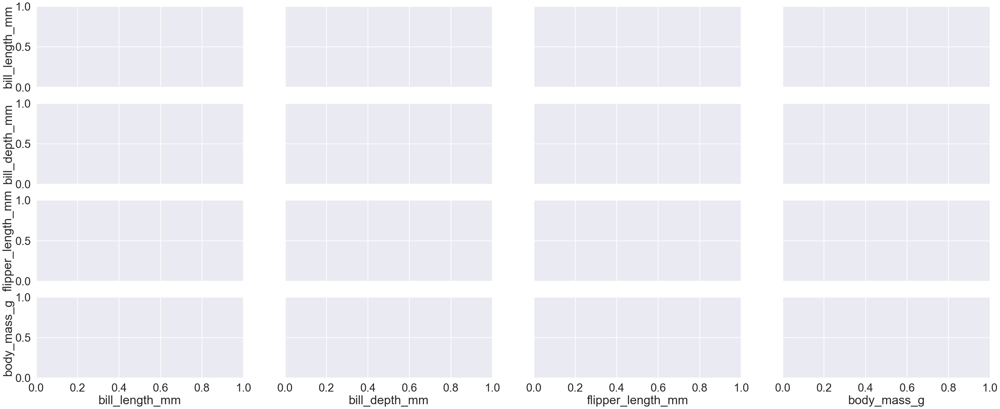

In [150]:
sns.set_style('darkgrid')
sns.set_context('poster',font_scale=1.5)
g = sns.PairGrid(penguins, height = 5 , aspect = 2.5,layout_pad = 10)

### With Data 

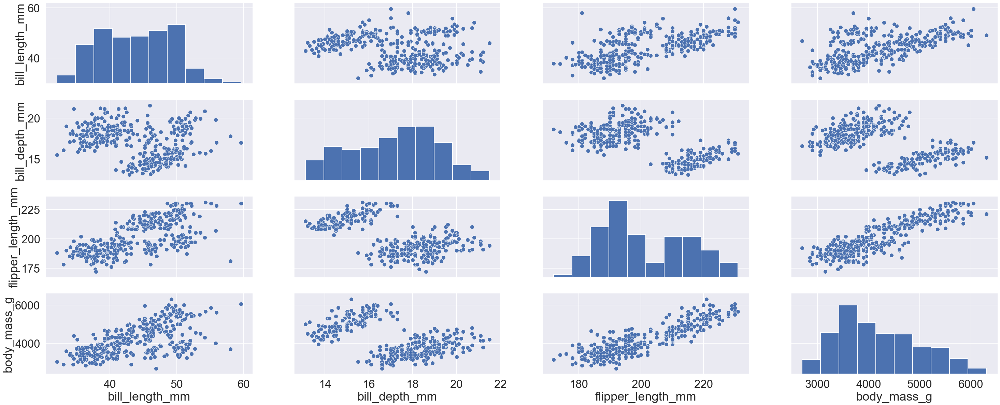

In [151]:
sns.set_context('poster',font_scale=1.5)
g = sns.PairGrid(penguins, height = 5 , aspect = 2.5,layout_pad = 10)
g.map_diag(plt.hist)
g.map_offdiag(sns.scatterplot);

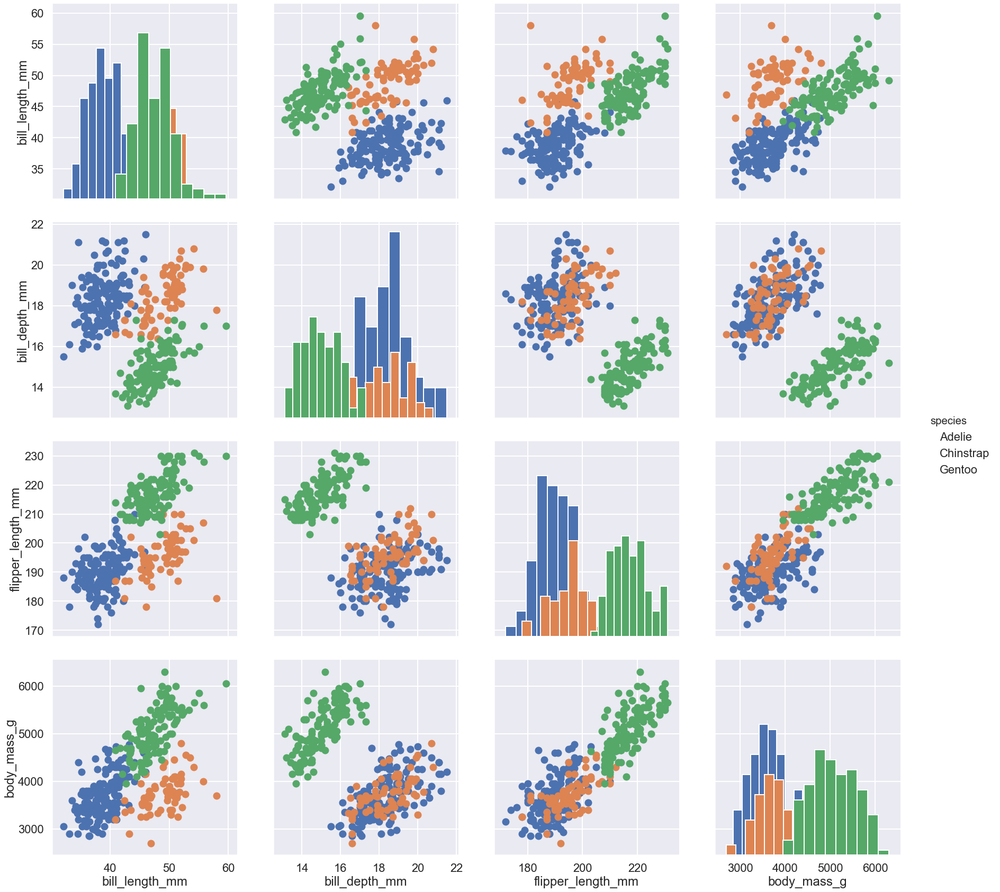

In [152]:
sns.set_context('poster',font_scale=1)
g = sns.PairGrid(penguins,hue = "species", height = 6 , aspect = 1,layout_pad = 1)
g.add_legend()
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter);

### Set Hue, Height, Aspect and Layout_pad  

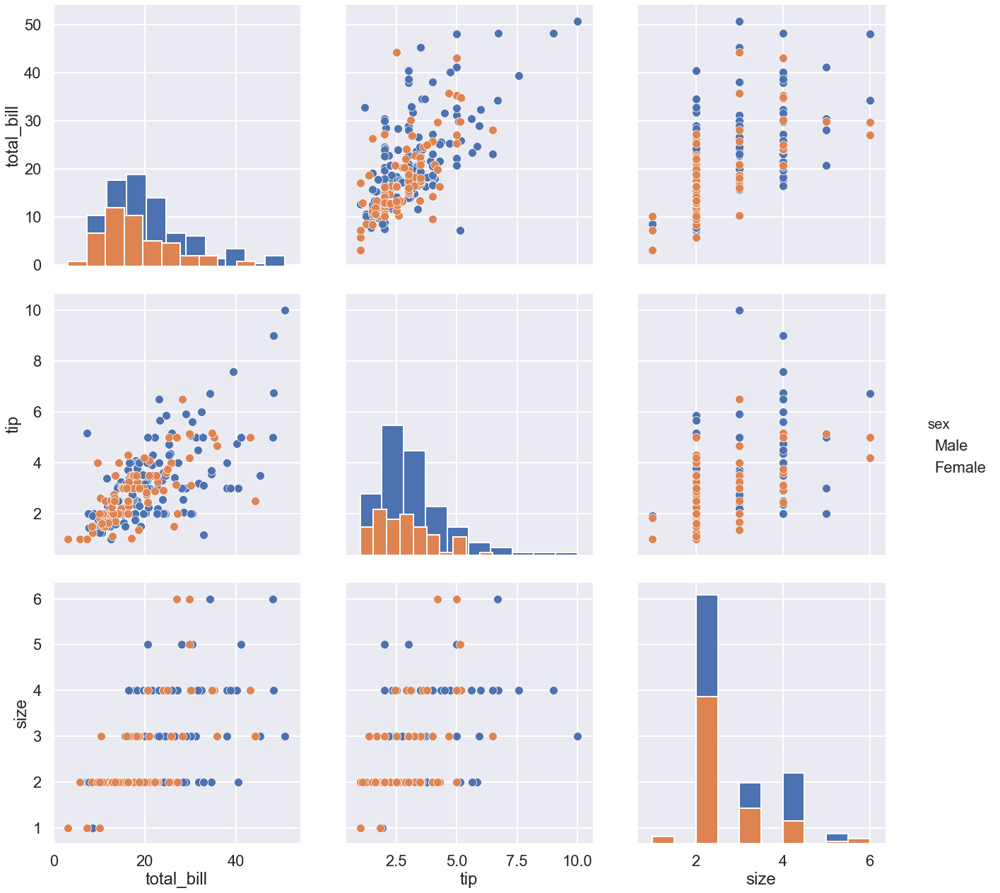

In [153]:
# Then you map to the grid
g = sns.PairGrid(tips,hue = 'sex', height = 6 , aspect = 1,layout_pad = .8)
g.add_legend()
g.map_diag(plt.hist)
g.map_offdiag(sns.scatterplot);

### With Iris dataset 

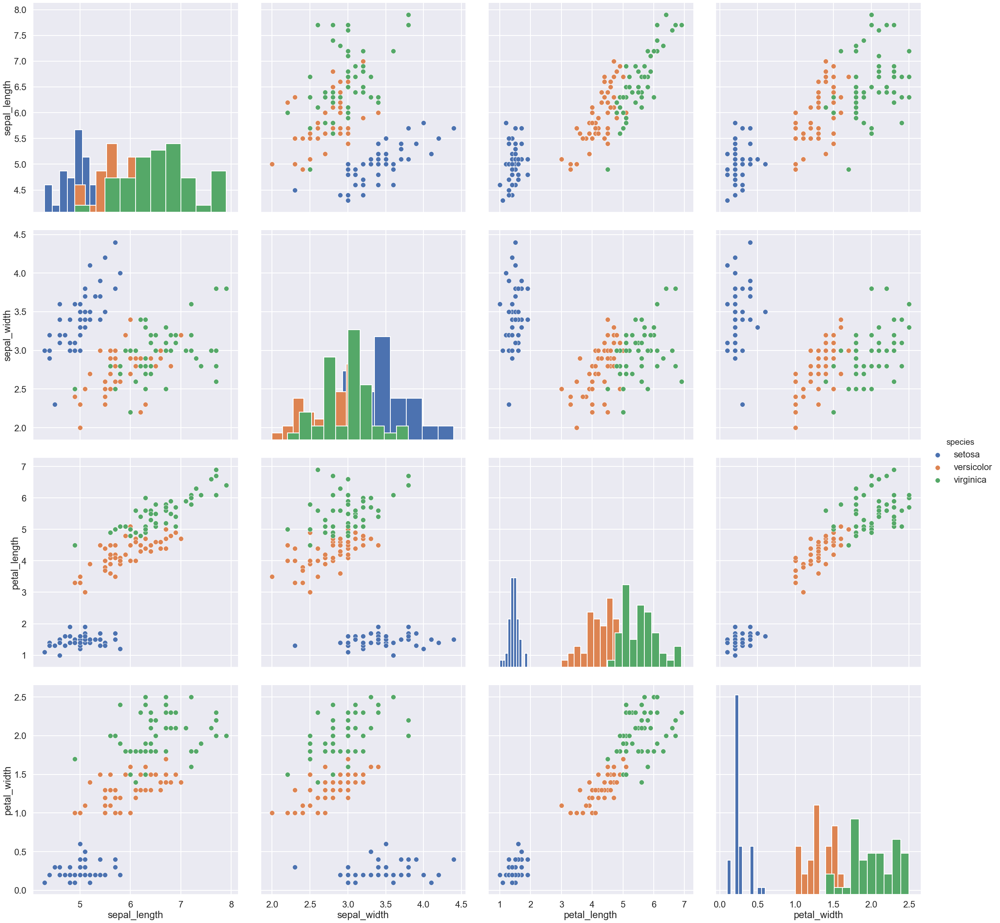

In [154]:
# Then you map to the grid
sns.set_context('poster',font_scale=1.0)
g = sns.PairGrid(iris,hue = 'species', height = 8, aspect = 1,layout_pad = 1)
g.map_diag(plt.hist)
g.map_offdiag(sns.scatterplot)
g.add_legend();

### Scatter, hist and KDE plot 

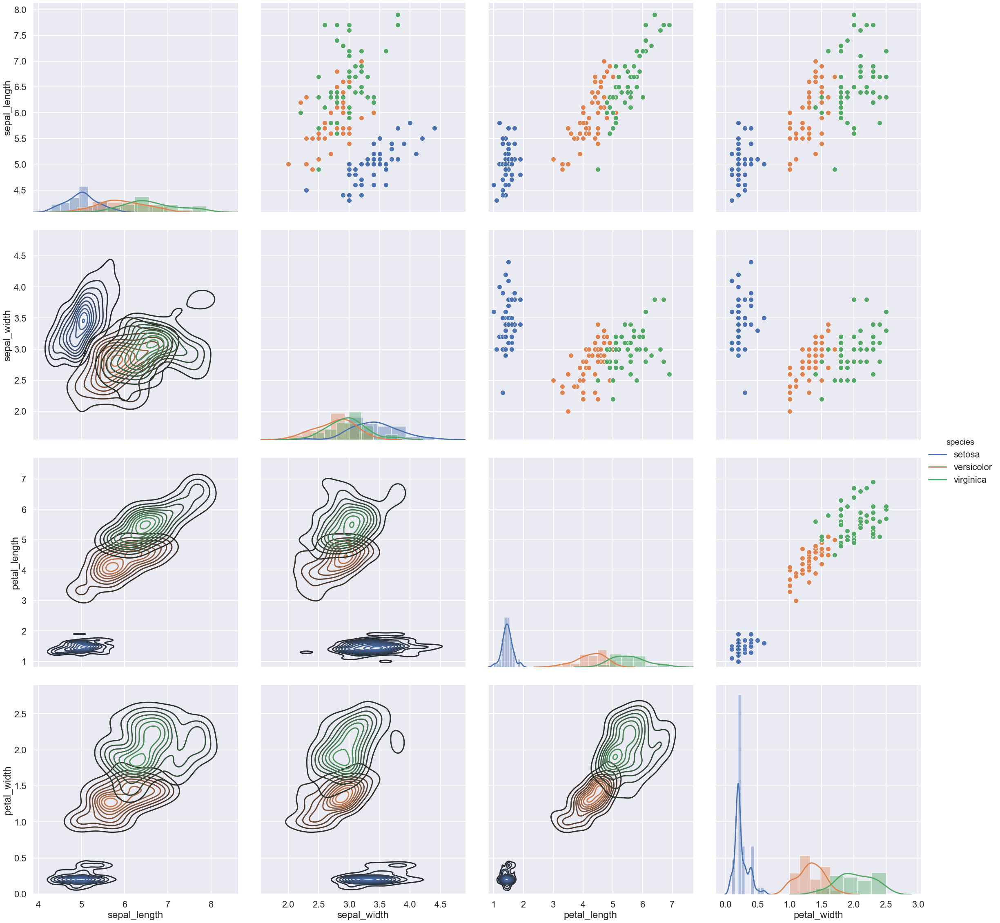

In [155]:
sns.set_style('darkgrid')
g = sns.PairGrid(iris,hue = 'species', height = 8 , aspect = 1,layout_pad = 1)
g.map_diag(sns.distplot)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.add_legend();

### With two legends

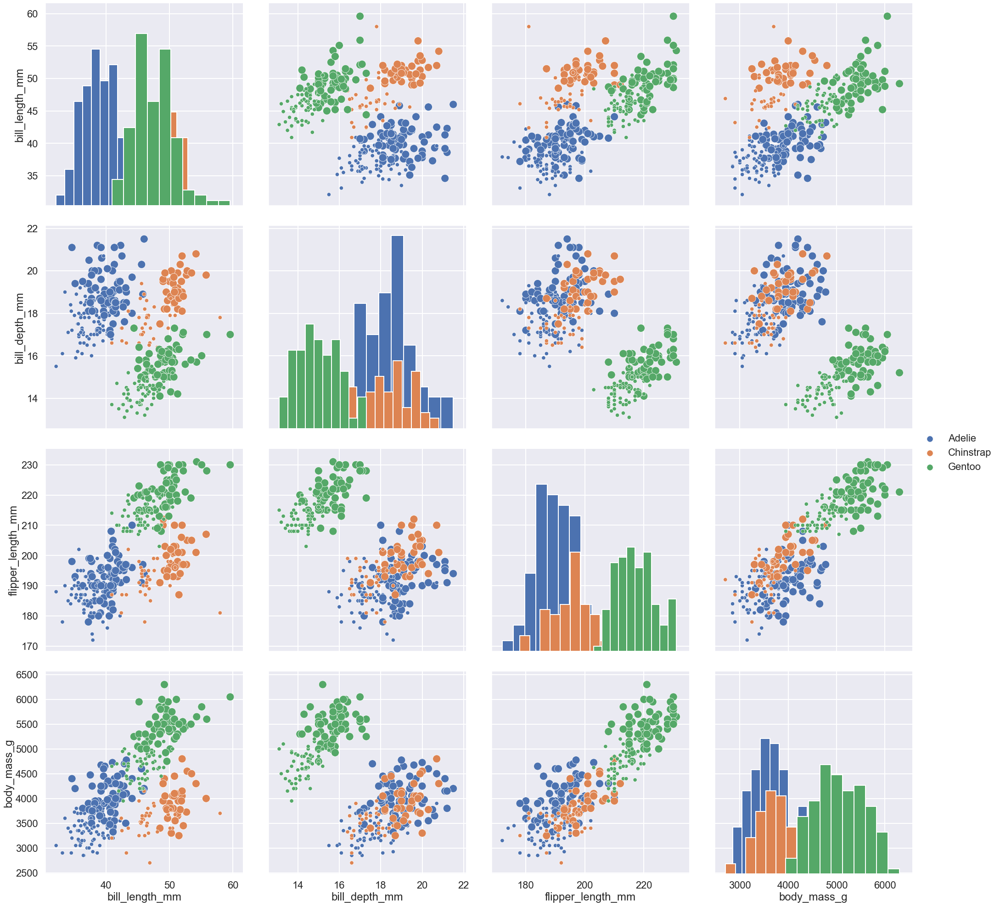

In [156]:
g = sns.PairGrid(penguins, hue="species", height = 7 , aspect = 1,layout_pad = 1)
g.map_diag(plt.hist)
g.map_offdiag(sns.scatterplot, size=penguins["sex"])
g.add_legend(title="");

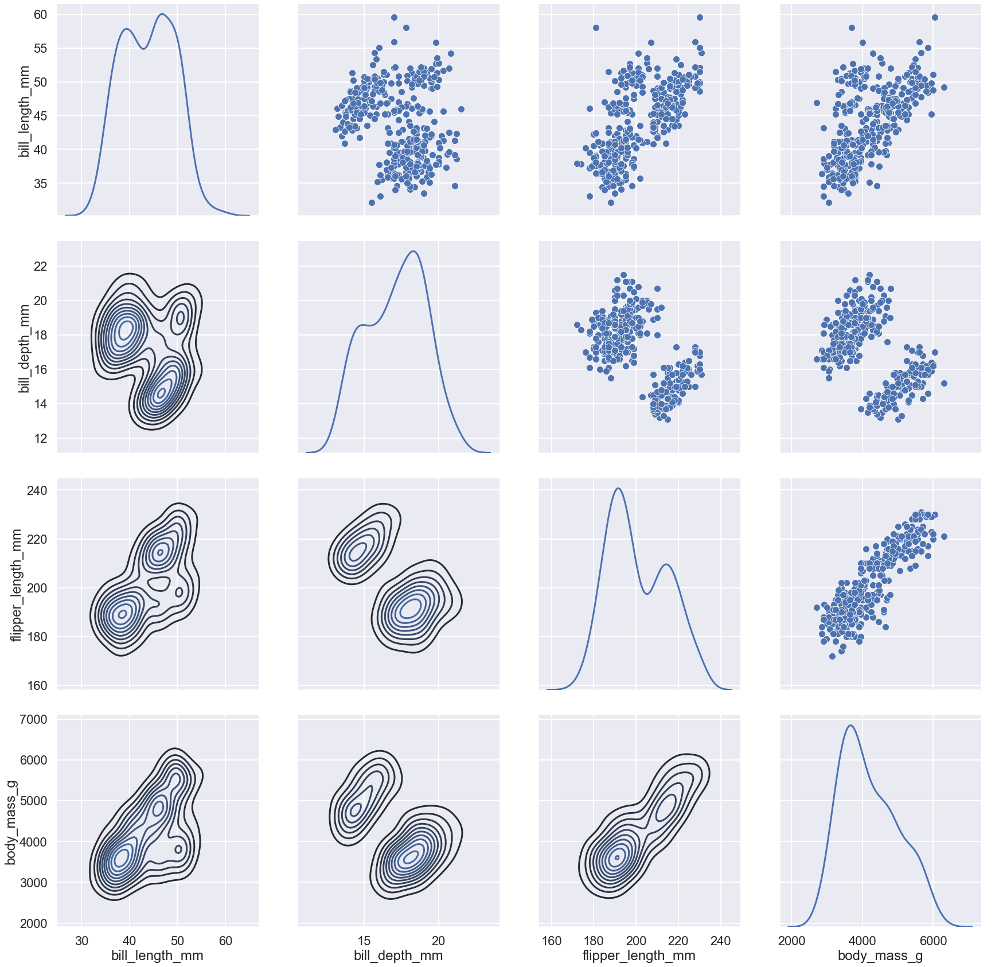

In [157]:
g = sns.PairGrid(penguins, diag_sharey=False, height = 6 , aspect = 1,layout_pad = 1)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot)
g.add_legend();

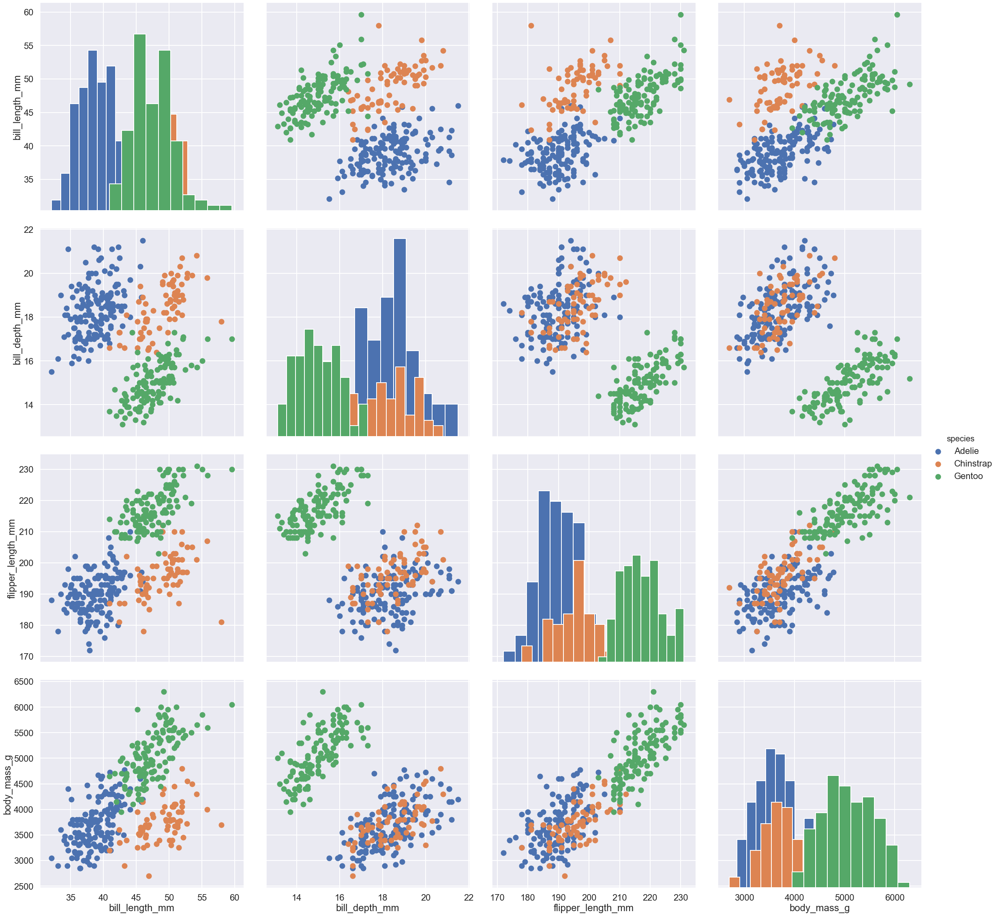

In [158]:
g = sns.PairGrid(penguins, hue="species", height = 8, aspect = 1,layout_pad = 1)
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter)
g.add_legend();

### Setting PairGrid

Pairgrid is a subplot grid for plotting pairwise relationships in a dataset.

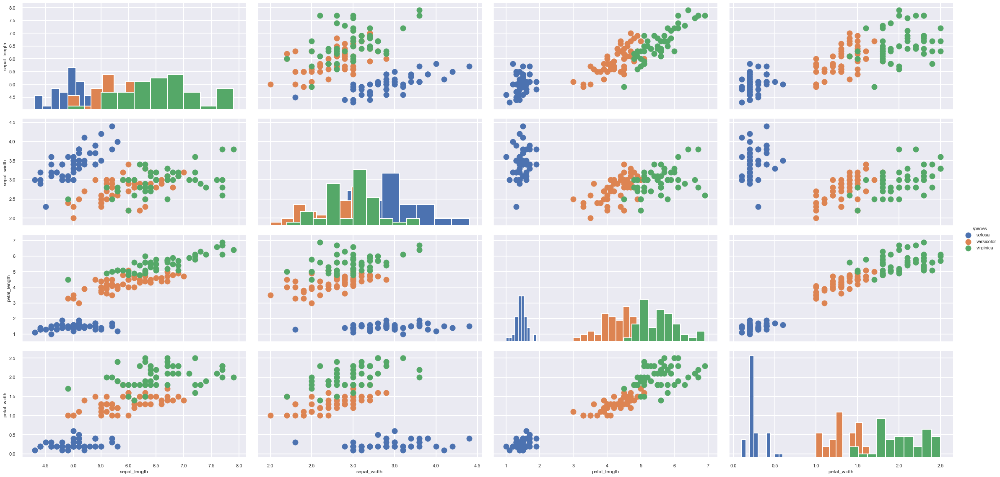

In [159]:
# Just the Grid
sns.set_style('darkgrid')
sns.set_context('poster',font_scale=0.5)
g = sns.PairGrid(iris,hue = 'species',height = 4, aspect = 2,layout_pad = 1)
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter)
g.add_legend();

## Sns.pairplot

### Hue 

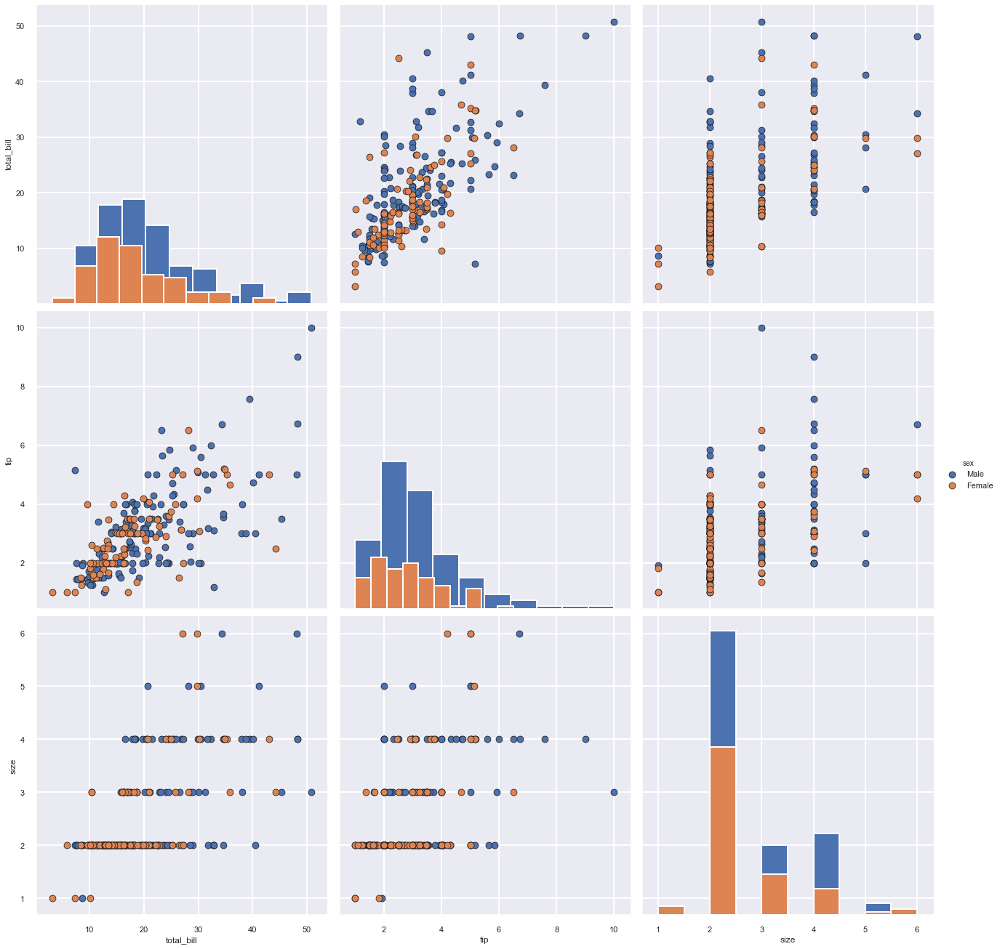

In [160]:
sns.pairplot(tips, 
             hue = 'sex',
             kind = 'scatter',
             diag_kind = 'hist',
             plot_kws = {'alpha': 1, 's': 80, 'edgecolor': 'k'},
             height = 6, 
             aspect = 1);

### With Color by Variable Categorical

Create pairplot to cresate joint plot for every combo of numerical columns in the dataframe

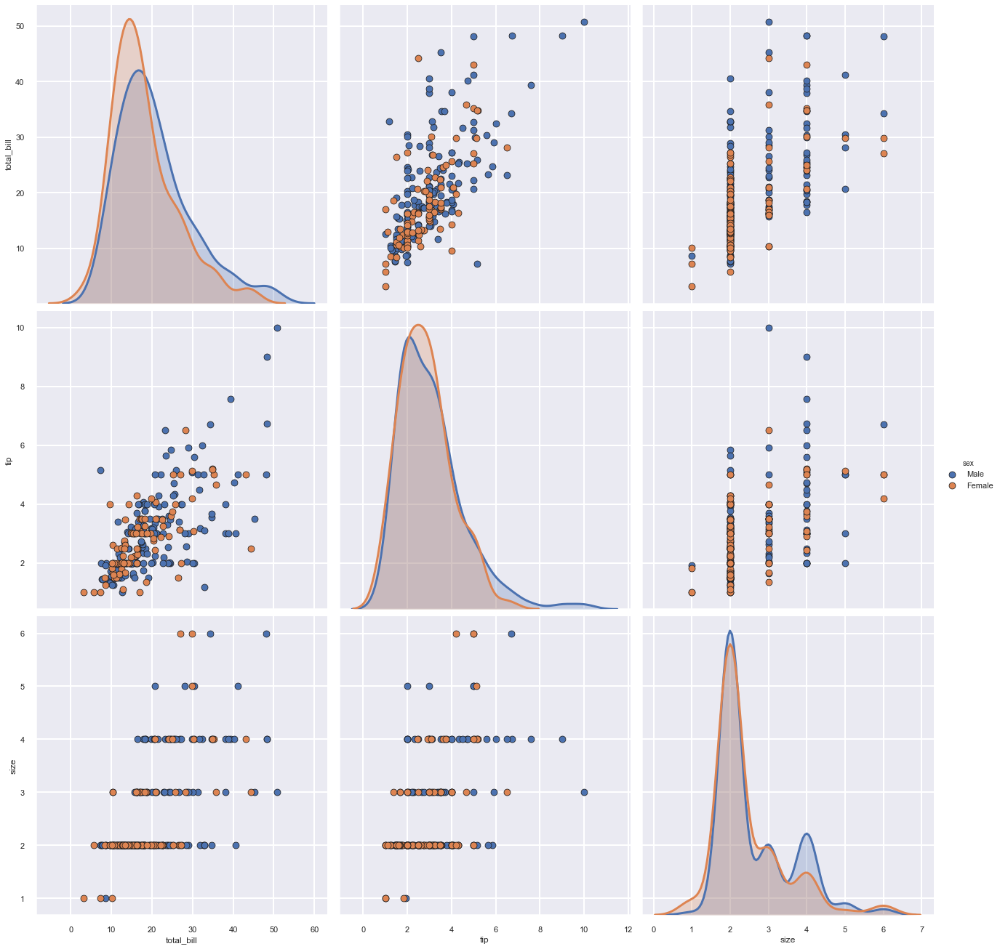

In [161]:
sns.pairplot(tips, 
             hue = 'sex',
             kind = 'scatter',
             diag_kind = 'kde',
             plot_kws = {'alpha': 1, 's': 80, 'edgecolor': 'k'},
             height = 6, 
             aspect = 1);  # pass a categorical column to hue

### Exemplo 4

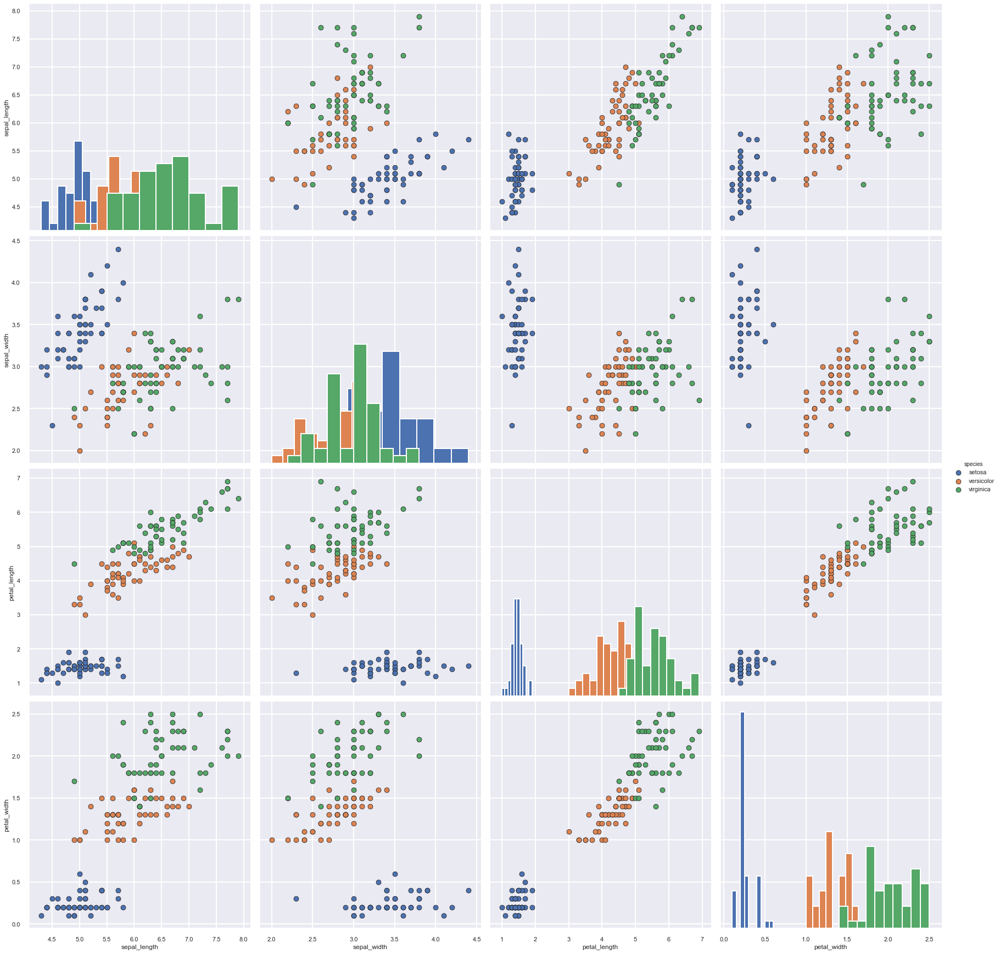

In [162]:
sns.pairplot(iris, 
             hue = 'species',
             kind = 'scatter',
             diag_kind = 'hist',
             plot_kws = {'alpha': 1, 's': 80, 'edgecolor': 'k'},
             height = 6, 
             aspect = 1);

### Exemplo 7
pairplot is a simpler version of PairGrid (you'll use quite often)

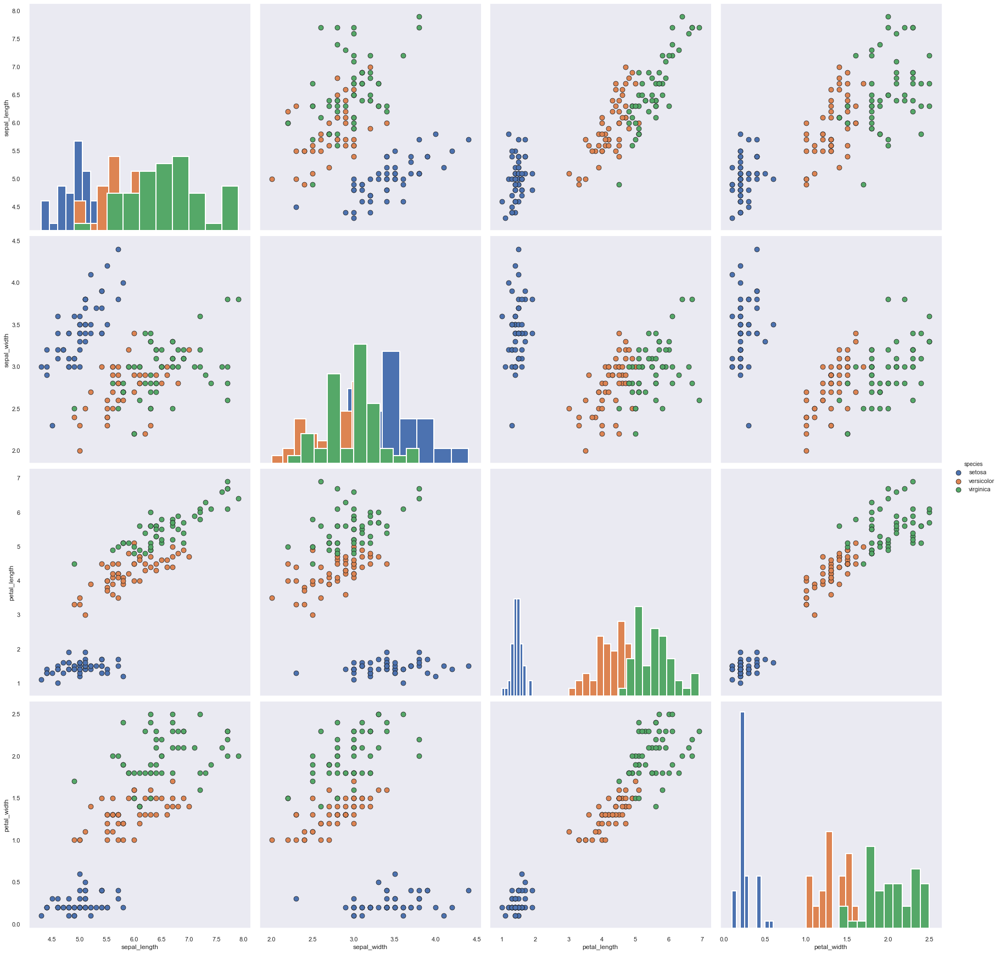

In [163]:
sns.set_style('dark')
sns.pairplot(iris, 
             hue = 'species',
             kind = 'scatter',
             diag_kind = 'hist',
             plot_kws = {'alpha': 1, 's': 80, 'edgecolor': 'k'},
             height = 6, 
             aspect = 1);

### Exemplo 8

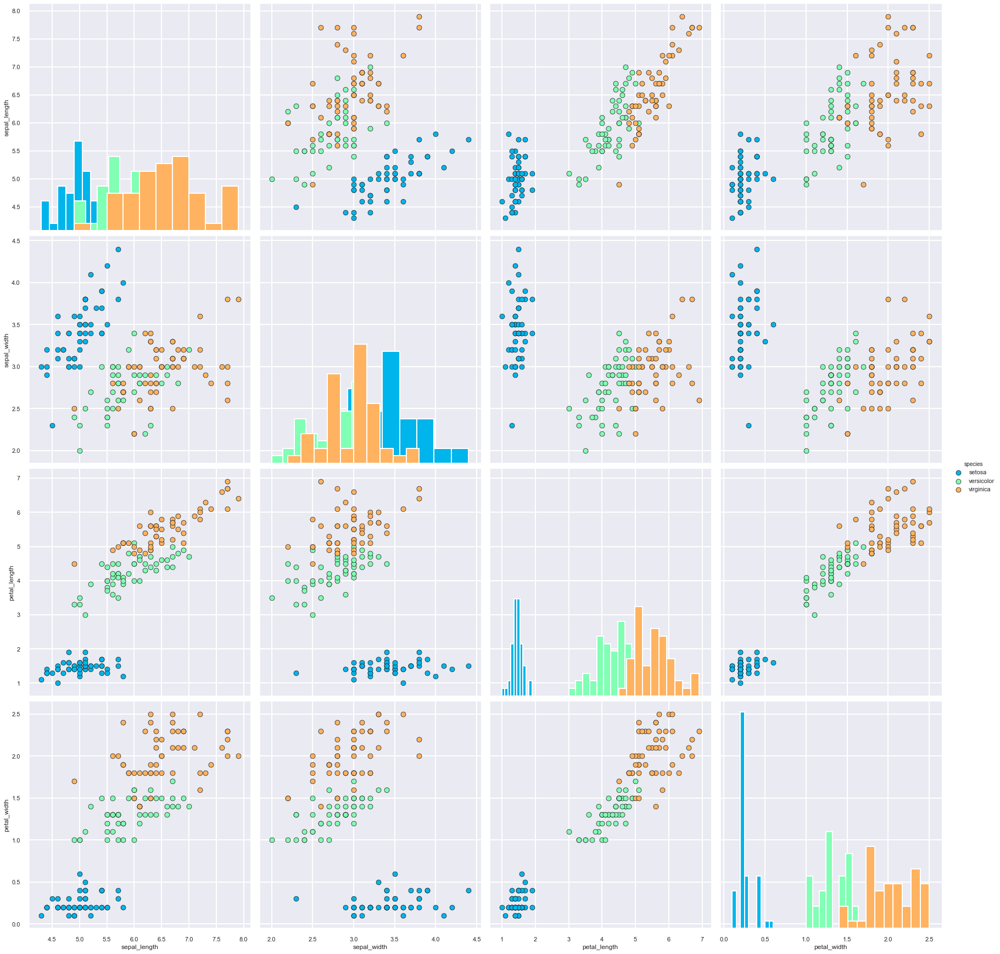

In [164]:
sns.set_style('darkgrid')
sns.pairplot(iris,
             hue = 'species',
             kind = 'scatter',
             diag_kind = 'hist',
             plot_kws = {'alpha': 1, 's': 80, 'edgecolor': 'k'},
             height = 6, 
             aspect = 1,
             palette='rainbow');

# Facet Grid

FacetGrid is the general way to create grids of plots based off of a feature:

In [168]:
tips = sns.load_dataset('tips')

In [169]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


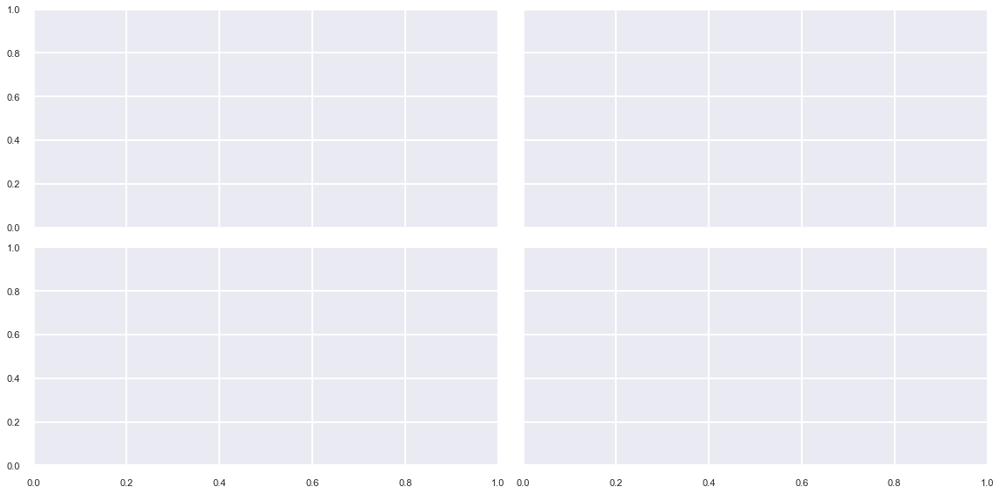

In [170]:
# Just the Grid
sns.set_style('darkgrid')
sns.set_context('poster',font_scale=0.5)
g = sns.FacetGrid(tips, col="time", row="smoker",height = 4, aspect = 2);

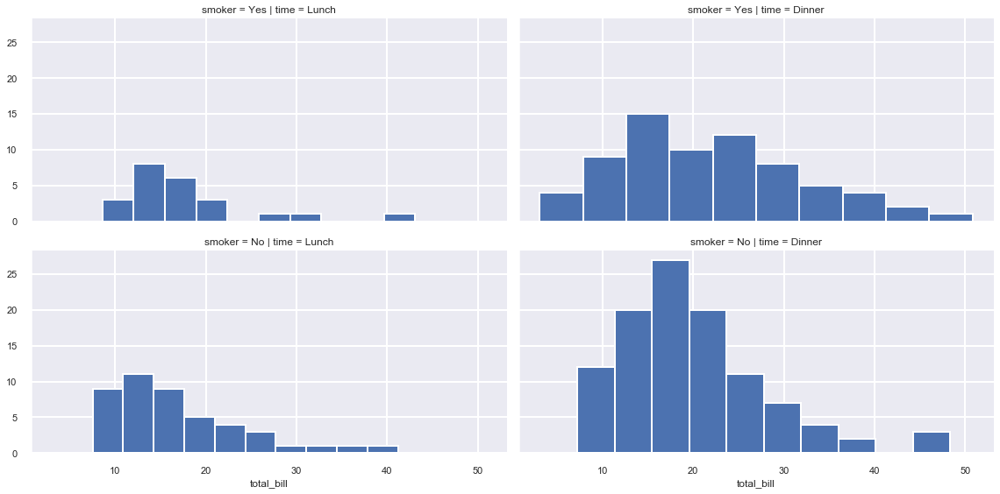

In [171]:
g = sns.FacetGrid(tips, col="time", row="smoker",height = 4, aspect = 2)
g = g.map(plt.hist, "total_bill")

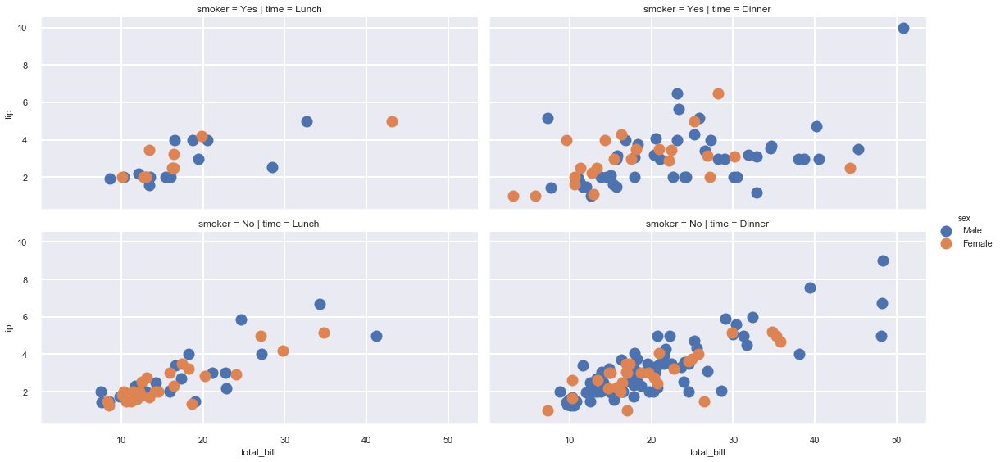

In [172]:
g = sns.FacetGrid(tips, col="time",  row="smoker",hue='sex',height = 4, aspect = 2)
# Notice hwo the arguments come after plt.scatter call
g = g.map(plt.scatter, "total_bill", "tip").add_legend()

## JointGrid

JointGrid is the general version for jointplot() type grids, for a quick example:

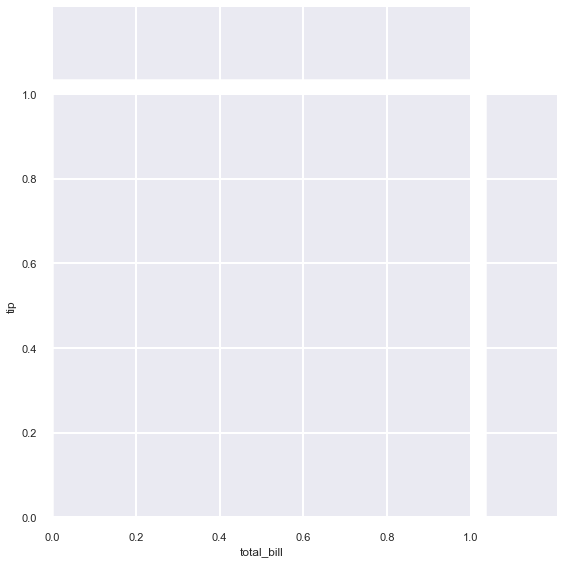

In [173]:
g = sns.JointGrid(x="total_bill", y="tip", data=tips,height = 8)

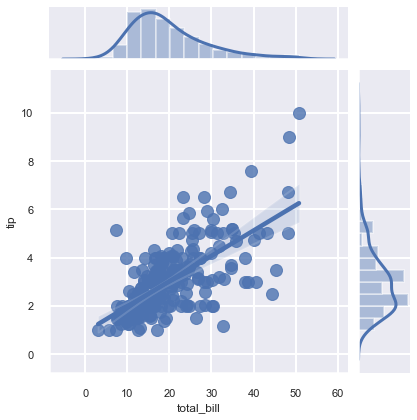

In [174]:
g = sns.JointGrid(x="total_bill", y="tip", data=tips)
g = g.plot(sns.regplot, sns.distplot)

In [175]:
# Identify unique values Species column
iris['species'].unique()

array(['setosa', 'versicolor', 'virginica'], dtype=object)

## Load dataset

In [176]:
tips = sns.load_dataset('tips')
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


## Facet Grid

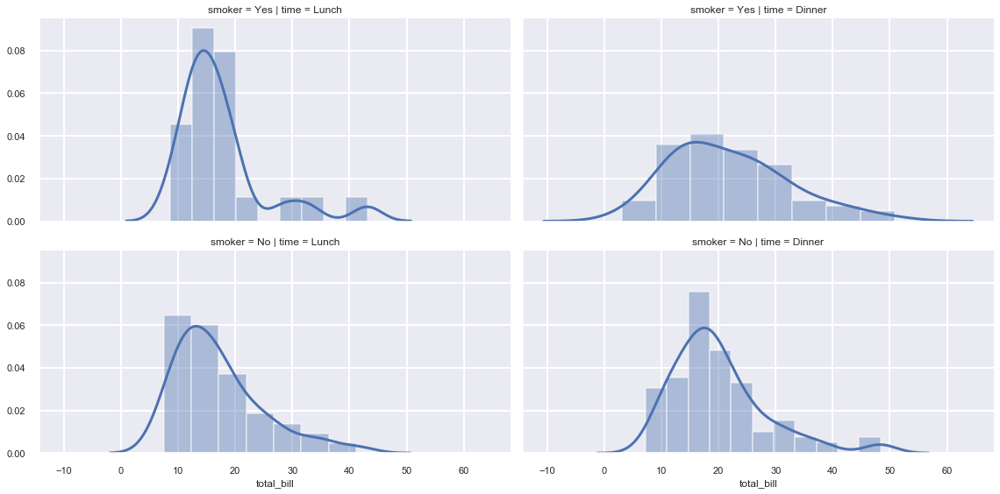

In [177]:
# Create facet grid
g = sns.FacetGrid(data = tips, col = 'time', row = 'smoker',height = 4, aspect = 2)
g.map(sns.distplot,'total_bill');

## Facet grid with plot require more than one variable

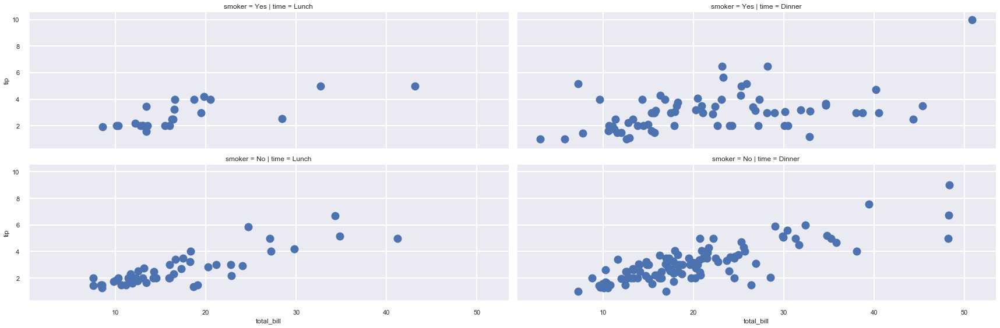

In [178]:
g = sns.FacetGrid(data = tips, col = 'time', row = 'smoker',height = 4, aspect = 3)
g.map(plt.scatter,'total_bill','tip');

## Facet Grid with Scatterplot

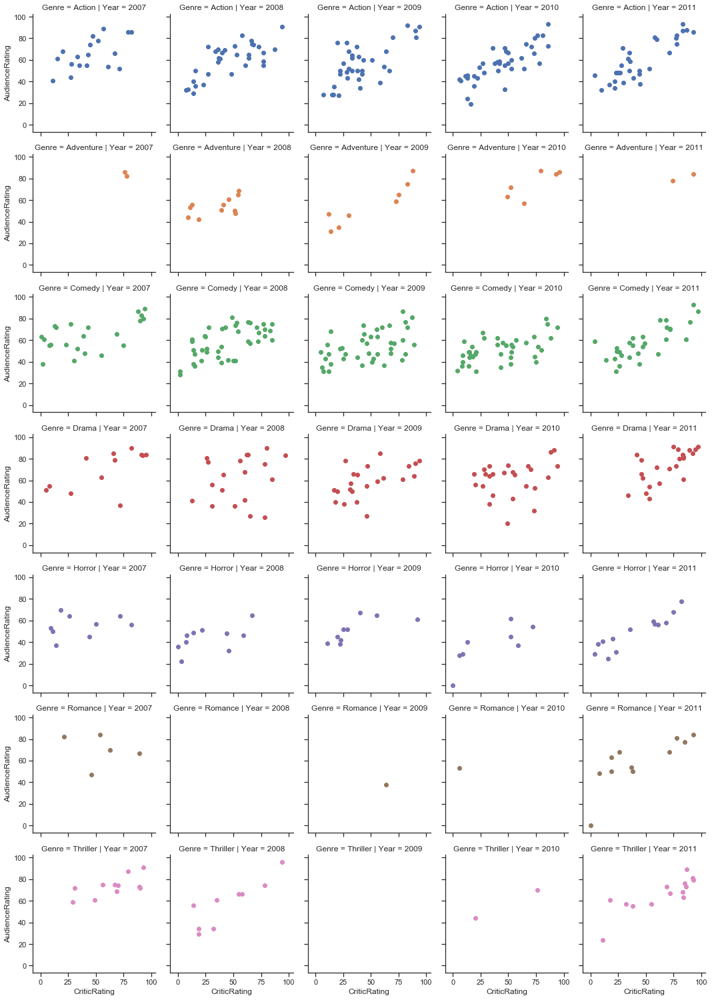

In [105]:
# Construct facit grid
g = sns.FacetGrid(movies, row = 'Genre', col = 'Year', hue = 'Genre')

# Create scatter plot to split across the construct created 
g = g.map(plt.scatter, 'CriticRating', 'AudienceRating') # movies already specified above, can remove movies. prefix

Built scatterplots above, but FacetGrid can be populated with any types of chart.

## Example 2: Histograms

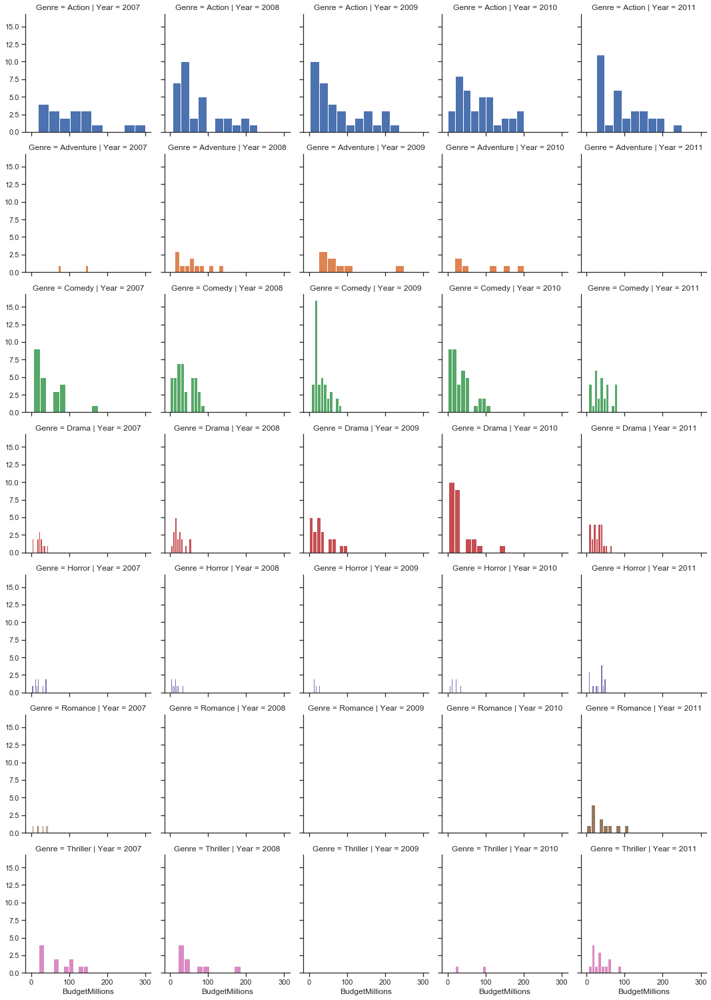

In [106]:
# Construct facet grid
g = sns.FacetGrid(movies, row = 'Genre', col = 'Year', hue = 'Genre')

# Create scatter plot to split across the construct created 
g = g.map(plt.hist, 'BudgetMillions') # only need one variable for histograms!

## Example 3: Scatterplot with Keyword Arguments
Studying how the relationship between Audience Rating and Critic Rating evolved throughout the years

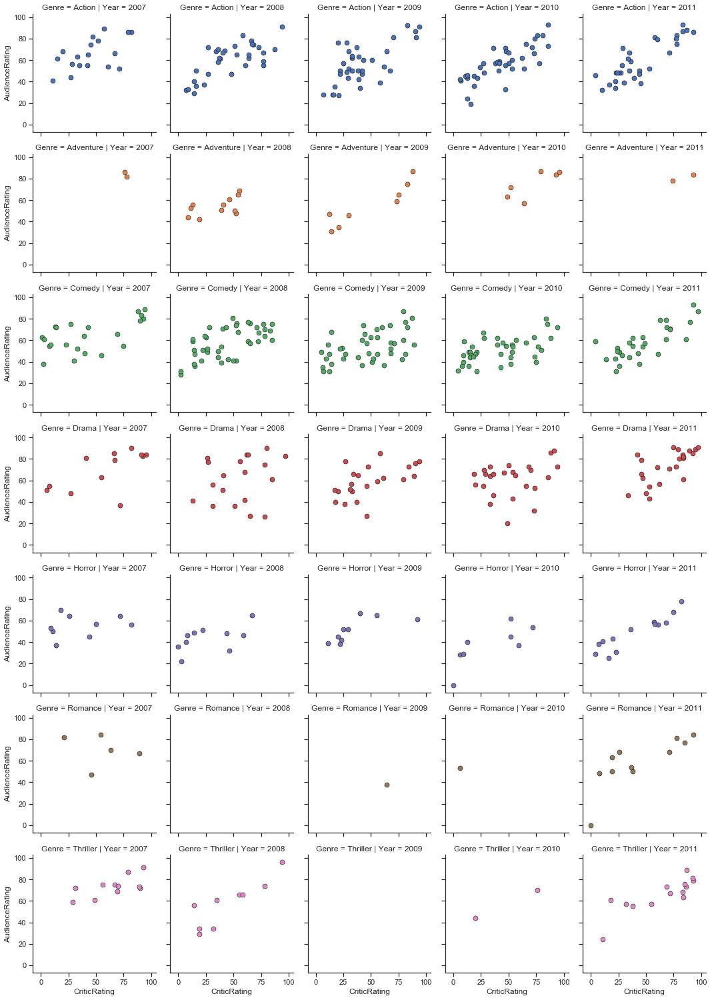

In [107]:
# Construct facit grid
g = sns.FacetGrid(movies, row = 'Genre', col = 'Year', hue = 'Genre')

# Create scatter plot to split across the construct created 
kws = dict(s = 50, linewidth = 0.5, edgecolor = 'black') 
g = g.map(plt.scatter, 'CriticRating', 'AudienceRating', **kws) # pass keywords dictionary to make points bigger

In [108]:
# Check newly created dictionary
kws

{'s': 50, 'linewidth': 0.5, 'edgecolor': 'black'}

Remember: in a dictionary, elements are not stored in a particular order because the keys are what matters.

## Coordinates and Diagonals
Controlling Axes and Adding Diagonals

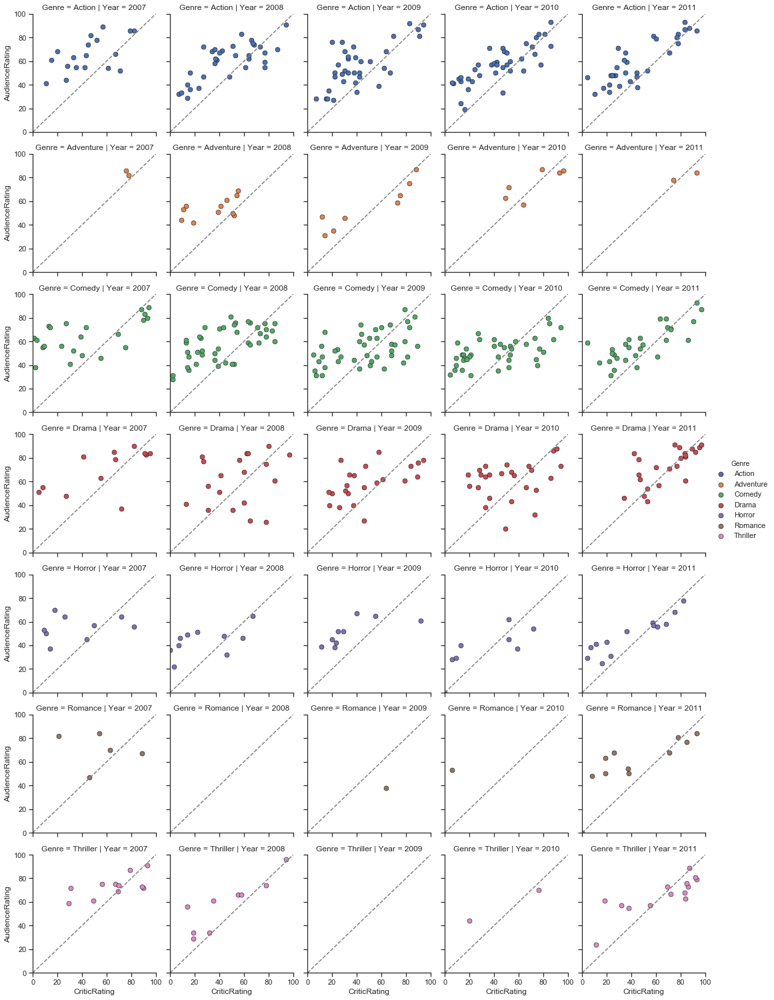

In [109]:
# Construct facit grid
g = sns.FacetGrid(movies, row = 'Genre', col = 'Year', hue = 'Genre')

# Create scatter plot to split across the construct created 
kws = dict(s = 50, linewidth = 0.5, edgecolor = 'black') 
g = g.map(plt.scatter, 'CriticRating', 'AudienceRating', **kws) # pass keywords dictionary to make points bigger
g.set(xlim =(0,100), ylim = (0,100))
for ax in g.axes.flat: # We're taking g, using .axes to access all these elements (plots) of the facet grid and using flat to flatten out this area so can iterate over it
    ax.plot((0,100),(0,100), c = 'gray',ls = '--') # x and y axis
g.add_legend()

# Style and Color

In [179]:
tips = sns.load_dataset('tips')
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


## Set Style 

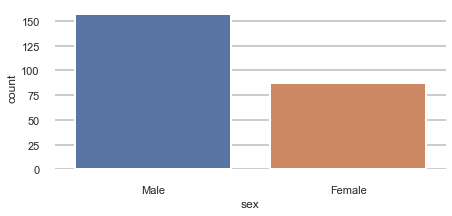

In [180]:
sns.set_style('whitegrid') # will remain until you change it
plt.figure(figsize = (7,3))
sns.countplot(x = 'sex', data = tips)

# Remove spines
sns.despine(left = True, bottom = True)

## Set context

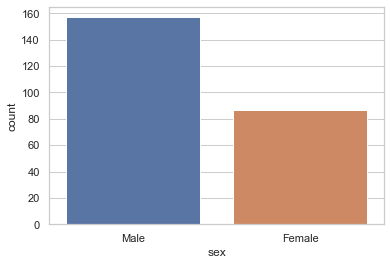

In [181]:
sns.set_context('notebook',font_scale = 1) # default is notebook

# Plot
sns.countplot(x = 'sex', data = tips)

# Regression Plots

Seaborn has many built-in capabilities for regression plots, however we won't really discuss regression until the machine learning section of the course, so we will only cover the **lmplot()** function for now.

**lmplot** allows you to display linear models, but it also conveniently allows you to split up those plots based off of features, as well as coloring the hue based off of features.

Let's explore how this works:

## Using dataset movies

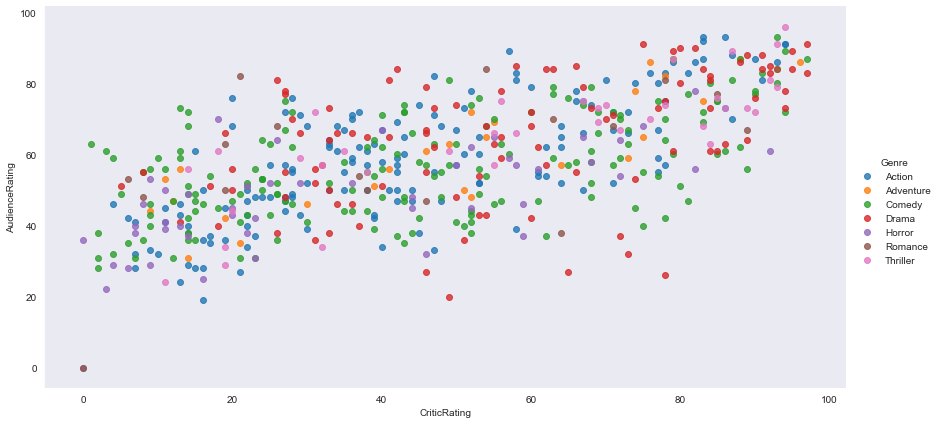

In [79]:
vis1= sns.lmplot(data = movies, 
                    x = 'CriticRating', 
                    y = 'AudienceRating', 
              fit_reg = False, 
                  hue = 'Genre',
               height = 4, 
               aspect = 2,
                 size = 6)

In [183]:
tips = sns.load_dataset('tips')

In [184]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


## lmplot()

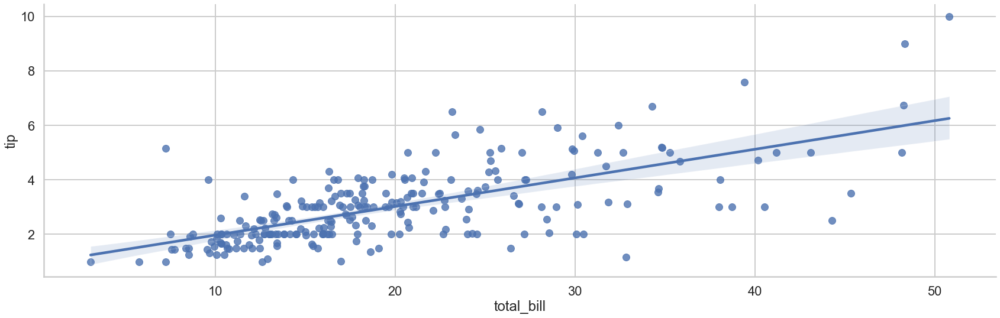

In [141]:
sns.lmplot(x='total_bill',y='tip',data=tips,height = 5,aspect = 3,size = 8)

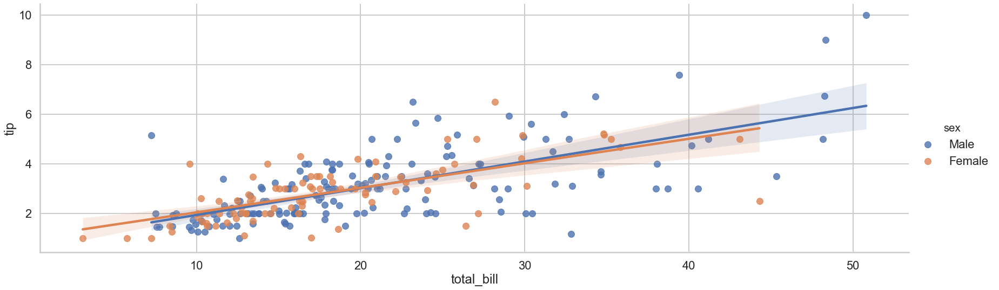

In [142]:
sns.lmplot(x='total_bill',y='tip',data=tips,hue='sex',height = 5,aspect = 3,size = 8)

## Color

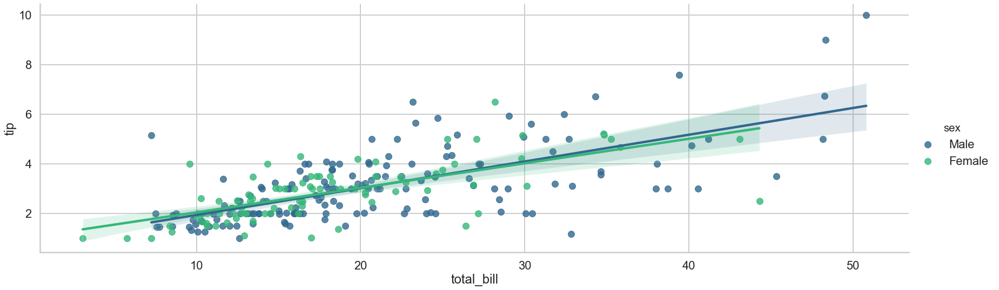

In [169]:
sns.set_style('whitegrid')
sns.lmplot(x = 'total_bill', y = 'tip', data = tips, hue = 'sex', palette = 'viridis', height = 5, aspect = 3, size = 8);

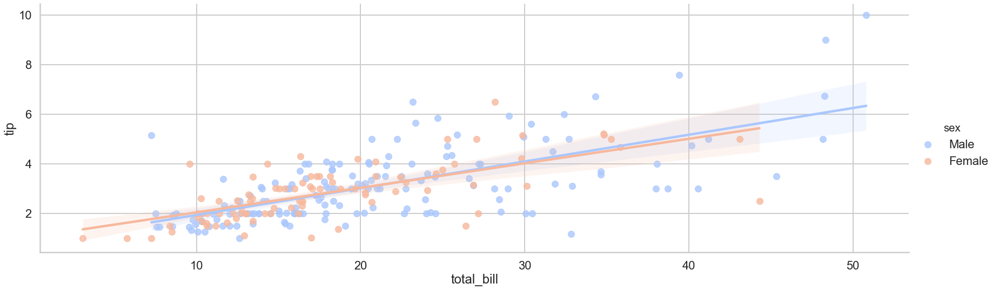

In [170]:
sns.lmplot(x='total_bill', y = 'tip',  data=tips, hue='sex', palette='coolwarm', height = 5, aspect = 3, size = 8);

## Working with Markers

lmplot kwargs get passed through to **regplot** which is a more general form of lmplot(). regplot has a scatter_kws parameter that gets passed to plt.scatter. So you want to set the s parameter in that dictionary, which corresponds (a bit confusingly) to the squared markersize. In other words you end up passing a dictionary with the base matplotlib arguments, in this case, s for size of a scatter plot. In general, you probably won't remember this off the top of your head, but instead reference the documentation.

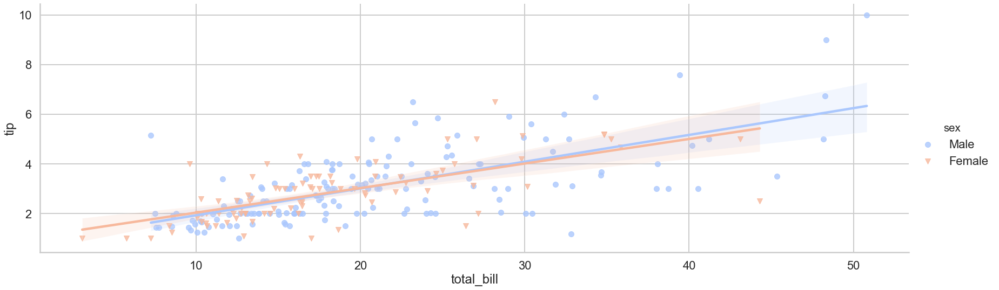

In [144]:
# http://matplotlib.org/api/markers_api.html
sns.lmplot(x='total_bill',y='tip',data=tips,hue='sex',palette='coolwarm',
           markers=['o','v'],scatter_kws={'s':100},height = 5,aspect = 3,size = 8)

## Using a Grid

We can add more variable separation through columns and rows with the use of a grid. Just indicate this with the col or row arguments:

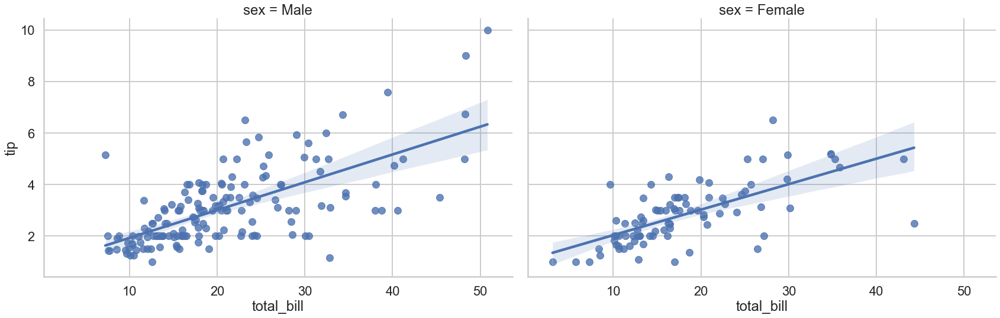

In [150]:
sns.lmplot(x='total_bill',y='tip',data=tips,col='sex',height = 8,aspect = 1.5,size = 8);

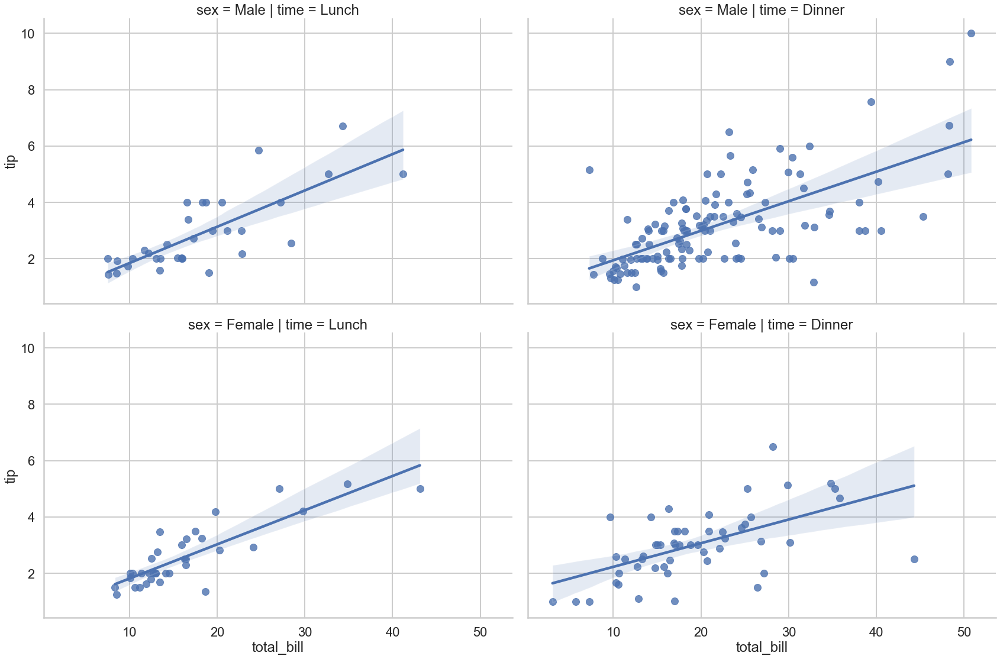

In [151]:
sns.lmplot(x="total_bill", y="tip", row="sex", col="time",data=tips,height = 8,aspect = 1.5,size = 8);

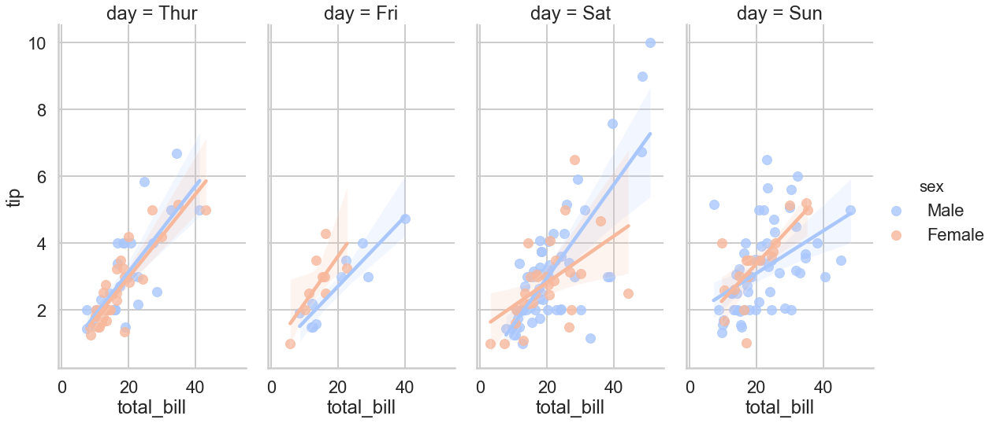

In [156]:
sns.lmplot(x='total_bill',y='tip',data=tips,col='day',hue='sex',palette='coolwarm',height = 10,aspect = .5,size = 8);

## Aspect and Size

Seaborn figures can have their size and aspect ratio adjusted with the **size** and **aspect** parameters:

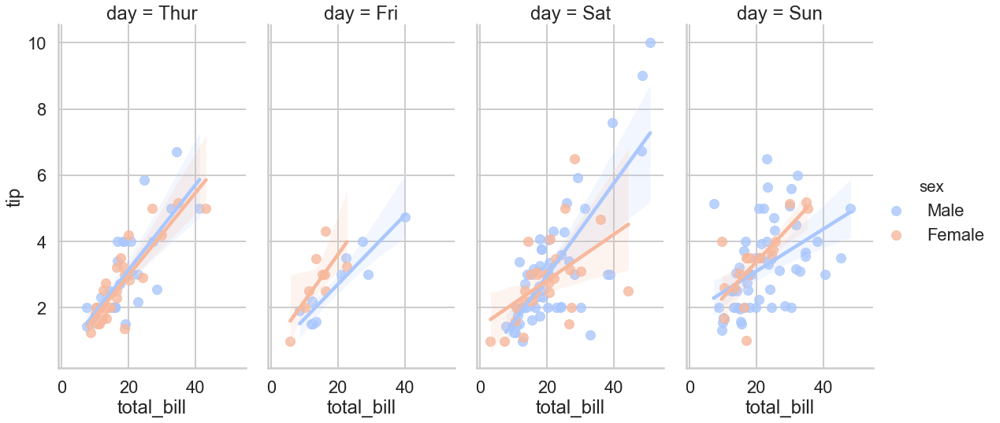

In [157]:
sns.lmplot(x='total_bill',
           y='tip',
           data=tips,
           col='day',
           hue='sex',
           palette='coolwarm',
           height = 10,aspect = .5,size = 8);

## Create linear model plot

<Figure size 1080x288 with 0 Axes>

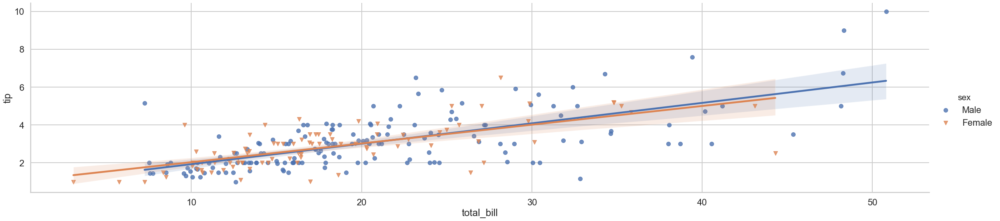

In [159]:
plt.figure(figsize = (15,4))
sns.lmplot(x = 'total_bill', 
           y = 'tip', 
           data = tips, 
           hue = 'sex', 
           markers = ['o','v'],
           scatter_kws = {'s':100},height = 10,aspect = 4,size = 8);

## Create faceted plot

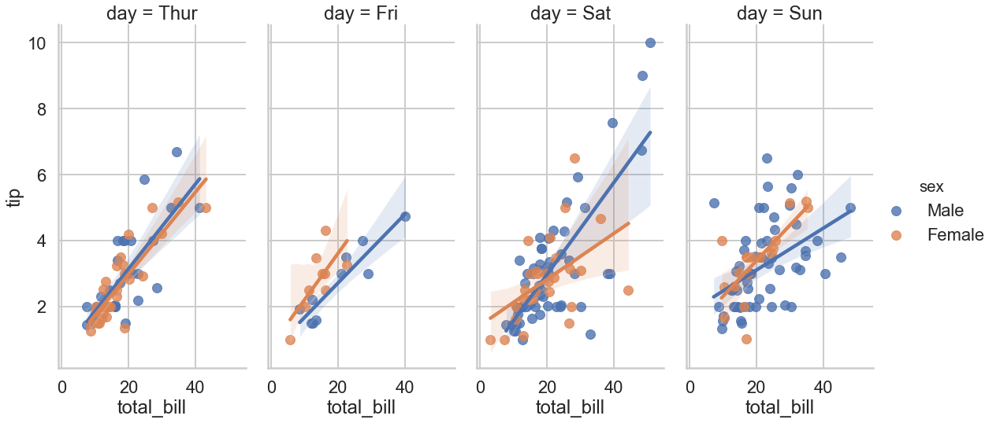

In [160]:
sns.lmplot(x = 'total_bill', 
           y = 'tip', 
           data = tips, 
           col = 'day', 
           hue = 'sex',
           height = 10,aspect = .5,size = 8);

# Case 1 - Country Birth Rate Exploratory Analysis

## Imports  

In [195]:
data = pd.read_csv('dados/DemographicData.csv')

## View Dataset

In [196]:
data.head()

,Country Name,Country Code,Birth rate,Internet users,Income Group
0,Aruba,ABW,10.244,78.9,High income
1,Afghanistan,AFG,35.253,5.9,Low income
2,Angola,AGO,45.985,19.1,Upper middle income
3,Albania,ALB,12.877,57.2,Upper middle income
4,United Arab Emirates,ARE,11.044,88.0,High income


## Rename columns

In [197]:
data.columns = ['CountryName', 'CountryCode', 'BirthRate', 'InternetUsers','IncomeGroup']

In [198]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CountryName    195 non-null    object 
 1   CountryCode    195 non-null    object 
 2   BirthRate      195 non-null    float64
 3   InternetUsers  195 non-null    float64
 4   IncomeGroup    195 non-null    object 
dtypes: float64(2), object(3)
memory usage: 7.7+ KB


## Statistical Summary

In [199]:
data.describe()

,BirthRate,InternetUsers
count,195.000000,195.000000
mean,21.469928,42.076471
std,10.605467,29.030788
min,7.900000,0.900000
25%,12.120500,14.520000
50%,19.680000,41.000000
75%,29.759500,66.225000
max,49.661000,96.546800


## Visualization 1

In [200]:
data.IncomeGroup

0              High income
1               Low income
2      Upper middle income
3      Upper middle income
4              High income
              ...         
190    Lower middle income
191    Upper middle income
192             Low income
193    Lower middle income
194             Low income
Name: IncomeGroup, Length: 195, dtype: object

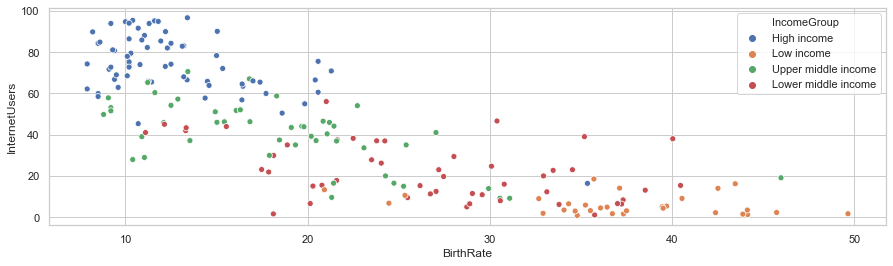

In [201]:
plt.figure(figsize = (15,4))
vis1 = sns.scatterplot(data = data, 
                          x = 'BirthRate', 
                          y = 'InternetUsers', 
                          hue = 'IncomeGroup');

## Create lists of country codes

Create lists of country codes, life expectancy in 1960, and life expectancy in 2013

In [202]:
Country_Code = list (["ABW","AFG","AGO","ALB","ARE","ARG","ARM","ATG","AUS","AUT","AZE","BDI","BEL","BEN","BFA","BGD","BGR","BHR","BHS","BIH","BLR","BLZ","BOL","BRA","BRB","BRN","BTN","BWA","CAF","CAN","CHE","CHL","CHN","CIV","CMR","COG","COL","COM","CPV","CRI","CUB","CYP","CZE","DEU","DJI","DNK","DOM","DZA","ECU","EGY","ERI","ESP","EST","ETH","FIN","FJI","FRA","FSM","GAB","GBR","GEO","GHA","GIN","GMB","GNB","GNQ","GRC","GRD","GTM","GUM","GUY","HKG","HND","HRV","HTI","HUN","IDN","IND","IRL","IRN","IRQ","ISL","ITA","JAM","JOR","JPN","KAZ","KEN","KGZ","KHM","KIR","KOR","KWT","LAO","LBN","LBR","LBY","LCA","LKA","LSO","LTU","LUX","LVA","MAC","MAR","MDA","MDG","MDV","MEX","MKD","MLI","MLT","MMR","MNE","MNG","MOZ","MRT","MUS","MWI","MYS","NAM","NCL","NER","NGA","NIC","NLD","NOR","NPL","NZL","OMN","PAK","PAN","PER","PHL","PNG","POL","PRI","PRT","PRY","PYF","QAT","ROU","RUS","RWA","SAU","SDN","SEN","SGP","SLB","SLE","SLV","SOM","SSD","STP","SUR","SVK","SVN","SWE","SWZ","SYR","TCD","TGO","THA","TJK","TKM","TLS","TON","TTO","TUN","TUR","TZA","UGA","UKR","URY","USA","UZB","VCT","VEN","VIR","VNM","VUT","WSM","YEM","ZAF","COD","ZMB","ZWE"])
Life_Expectancy_At_Birth_1960 = list ([65.5693658536586,32.328512195122,32.9848292682927,62.2543658536585,52.2432195121951,65.2155365853659,65.8634634146342,61.7827317073171,70.8170731707317,68.5856097560976,60.836243902439,41.2360487804878,69.7019512195122,37.2782682926829,34.4779024390244,45.8293170731707,69.2475609756098,52.0893658536585,62.7290487804878,60.2762195121951,67.7080975609756,59.9613658536585,42.1183170731707,54.2054634146342,60.7380487804878,62.5003658536585,32.3593658536585,50.5477317073171,36.4826341463415,71.1331707317073,71.3134146341463,57.4582926829268,43.4658048780488,36.8724146341463,41.523756097561,48.5816341463415,56.716756097561,41.4424390243903,48.8564146341463,60.5761951219512,63.9046585365854,69.5939268292683,70.3487804878049,69.3129512195122,44.0212682926829,72.1765853658537,51.8452682926829,46.1351219512195,53.215,48.0137073170732,37.3629024390244,69.1092682926829,67.9059756097561,38.4057073170732,68.819756097561,55.9584878048781,69.8682926829268,57.5865853658537,39.5701219512195,71.1268292682927,63.4318536585366,45.8314634146342,34.8863902439024,32.0422195121951,37.8404390243902,36.7330487804878,68.1639024390244,59.8159268292683,45.5316341463415,61.2263414634146,60.2787317073171,66.9997073170732,46.2883170731707,64.6086585365854,42.1000975609756,68.0031707317073,48.6403170731707,41.1719512195122,69.691756097561,44.945512195122,48.0306829268293,73.4286585365854,69.1239024390244,64.1918292682927,52.6852682926829,67.6660975609756,58.3675853658537,46.3624146341463,56.1280731707317,41.2320243902439,49.2159756097561,53.0013170731707,60.3479512195122,43.2044634146342,63.2801219512195,34.7831707317073,42.6411951219512,57.303756097561,59.7471463414634,46.5107073170732,69.8473170731707,68.4463902439024,69.7868292682927,64.6609268292683,48.4466341463415,61.8127804878049,39.9746829268293,37.2686341463415,57.0656341463415,60.6228048780488,28.2116097560976,67.6017804878049,42.7363902439024,63.7056097560976,48.3688048780488,35.0037073170732,43.4830975609756,58.7452195121951,37.7736341463415,59.4753414634146,46.8803902439024,58.6390243902439,35.5150487804878,37.1829512195122,46.9988292682927,73.3926829268293,73.549756097561,35.1708292682927,71.2365853658537,42.6670731707317,45.2904634146342,60.8817073170732,47.6915853658537,57.8119268292683,38.462243902439,67.6804878048781,68.7196097560976,62.8089268292683,63.7937073170732,56.3570487804878,61.2060731707317,65.6424390243903,66.0552926829268,42.2492926829268,45.6662682926829,48.1876341463415,38.206,65.6598292682927,49.3817073170732,30.3315365853659,49.9479268292683,36.9658780487805,31.6767073170732,50.4513658536585,59.6801219512195,69.9759268292683,68.9780487804878,73.0056097560976,44.2337804878049,52.768243902439,38.0161219512195,40.2728292682927,54.6993170731707,56.1535365853659,54.4586829268293,33.7271219512195,61.3645365853659,62.6575853658537,42.009756097561,45.3844146341463,43.6538780487805,43.9835609756098,68.2995365853659,67.8963902439025,69.7707317073171,58.8855365853659,57.7238780487805,59.2851219512195,63.7302195121951,59.0670243902439,46.4874878048781,49.969512195122,34.3638048780488,49.0362926829268,41.0180487804878,45.1098048780488,51.5424634146342])
Life_Expectancy_At_Birth_2013 = list ([75.3286585365854,60.0282682926829,51.8661707317073,77.537243902439,77.1956341463415,75.9860975609756,74.5613658536585,75.7786585365854,82.1975609756098,80.890243902439,70.6931463414634,56.2516097560976,80.3853658536585,59.3120243902439,58.2406341463415,71.245243902439,74.4658536585366,76.5459512195122,75.0735365853659,76.2769268292683,72.4707317073171,69.9820487804878,67.9134390243903,74.1224390243903,75.3339512195122,78.5466585365854,69.1029268292683,64.3608048780488,49.8798780487805,81.4011219512195,82.7487804878049,81.1979268292683,75.3530243902439,51.2084634146342,55.0418048780488,61.6663902439024,73.8097317073171,62.9321707317073,72.9723658536585,79.2252195121951,79.2563902439025,79.9497804878049,78.2780487804878,81.0439024390244,61.6864634146342,80.3024390243903,73.3199024390244,74.5689512195122,75.648512195122,70.9257804878049,63.1778780487805,82.4268292682927,76.4243902439025,63.4421951219512,80.8317073170732,69.9179268292683,81.9682926829268,68.9733902439024,63.8435853658537,80.9560975609756,74.079512195122,61.1420731707317,58.216487804878,59.9992682926829,54.8384146341464,57.2908292682927,80.6341463414634,73.1935609756098,71.4863902439024,78.872512195122,66.3100243902439,83.8317073170732,72.9428536585366,77.1268292682927,62.4011463414634,75.2682926829268,68.7046097560976,67.6604146341463,81.0439024390244,75.1259756097561,69.4716829268293,83.1170731707317,82.290243902439,73.4689268292683,73.9014146341463,83.3319512195122,70.45,60.9537804878049,70.2024390243902,67.7720487804878,65.7665853658537,81.459756097561,74.462756097561,65.687243902439,80.1288780487805,60.5203902439024,71.6576829268293,74.9127073170732,74.2402926829268,49.3314634146342,74.1634146341464,81.7975609756098,73.9804878048781,80.3391463414634,73.7090487804878,68.811512195122,64.6739024390244,76.6026097560976,76.5326585365854,75.1870487804878,57.5351951219512,80.7463414634146,65.6540975609756,74.7583658536585,69.0618048780488,54.641512195122,62.8027073170732,74.46,61.466,74.567512195122,64.3438780487805,77.1219512195122,60.8281463414634,52.4421463414634,74.514756097561,81.1048780487805,81.4512195121951,69.222,81.4073170731707,76.8410487804878,65.9636829268293,77.4192195121951,74.2838536585366,68.1315609756097,62.4491707317073,76.8487804878049,78.7111951219512,80.3731707317073,72.7991707317073,76.3340731707317,78.4184878048781,74.4634146341463,71.0731707317073,63.3948292682927,74.1776341463415,63.1670487804878,65.878756097561,82.3463414634146,67.7189268292683,50.3631219512195,72.4981463414634,55.0230243902439,55.2209024390244,66.259512195122,70.99,76.2609756097561,80.2780487804878,81.7048780487805,48.9379268292683,74.7157804878049,51.1914878048781,59.1323658536585,74.2469268292683,69.4001707317073,65.4565609756098,67.5223658536585,72.6403414634147,70.3052926829268,73.6463414634147,75.1759512195122,64.2918292682927,57.7676829268293,71.159512195122,76.8361951219512,78.8414634146341,68.2275853658537,72.8108780487805,74.0744146341464,79.6243902439024,75.756487804878,71.669243902439,73.2503902439024,63.583512195122,56.7365853658537,58.2719268292683,59.2373658536585,55.633])

## Create list of countries, country codes, and regions

In [203]:
Countries_2012_Dataset = list (["Aruba","Afghanistan","Angola","Albania","United Arab Emirates","Argentina","Armenia","Antigua and Barbuda","Australia","Austria","Azerbaijan","Burundi","Belgium","Benin","Burkina Faso","Bangladesh","Bulgaria","Bahrain","Bahamas, The","Bosnia and Herzegovina","Belarus","Belize","Bermuda","Bolivia","Brazil","Barbados","Brunei Darussalam","Bhutan","Botswana","Central African Republic","Canada","Switzerland","Chile","China","Cote d'Ivoire","Cameroon","Congo, Rep.","Colombia","Comoros","Cabo Verde","Costa Rica","Cuba","Cayman Islands","Cyprus","Czech Republic","Germany","Djibouti","Denmark","Dominican Republic","Algeria","Ecuador","Egypt, Arab Rep.","Eritrea","Spain","Estonia","Ethiopia","Finland","Fiji","France","Micronesia, Fed. Sts.","Gabon","United Kingdom","Georgia","Ghana","Guinea","Gambia, The","Guinea-Bissau","Equatorial Guinea","Greece","Grenada","Greenland","Guatemala","Guam","Guyana","Hong Kong SAR, China","Honduras","Croatia","Haiti","Hungary","Indonesia","India","Ireland","Iran, Islamic Rep.","Iraq","Iceland","Israel","Italy","Jamaica","Jordan","Japan","Kazakhstan","Kenya","Kyrgyz Republic","Cambodia","Kiribati","Korea, Rep.","Kuwait","Lao PDR","Lebanon","Liberia","Libya","St. Lucia","Liechtenstein","Sri Lanka","Lesotho","Lithuania","Luxembourg","Latvia","Macao SAR, China","Morocco","Moldova","Madagascar","Maldives","Mexico","Macedonia, FYR","Mali","Malta","Myanmar","Montenegro","Mongolia","Mozambique","Mauritania","Mauritius","Malawi","Malaysia","Namibia","New Caledonia","Niger","Nigeria","Nicaragua","Netherlands","Norway","Nepal","New Zealand","Oman","Pakistan","Panama","Peru","Philippines","Papua New Guinea","Poland","Puerto Rico","Portugal","Paraguay","French Polynesia","Qatar","Romania","Russian Federation","Rwanda","Saudi Arabia","Sudan","Senegal","Singapore","Solomon Islands","Sierra Leone","El Salvador","Somalia","Serbia","South Sudan","Sao Tome and Principe","Suriname","Slovak Republic","Slovenia","Sweden","Swaziland","Seychelles","Syrian Arab Republic","Chad","Togo","Thailand","Tajikistan","Turkmenistan","Timor-Leste","Tonga","Trinidad and Tobago","Tunisia","Turkey","Tanzania","Uganda","Ukraine","Uruguay","United States","Uzbekistan","St. Vincent and the Grenadines","Venezuela, RB","Virgin Islands (U.S.)","Vietnam","Vanuatu","West Bank and Gaza","Samoa","Yemen, Rep.","South Africa","Congo, Dem. Rep.","Zambia","Zimbabwe"])
Codes_2012_Dataset = list (["ABW","AFG","AGO","ALB","ARE","ARG","ARM","ATG","AUS","AUT","AZE","BDI","BEL","BEN","BFA","BGD","BGR","BHR","BHS","BIH","BLR","BLZ","BMU","BOL","BRA","BRB","BRN","BTN","BWA","CAF","CAN","CHE","CHL","CHN","CIV","CMR","COG","COL","COM","CPV","CRI","CUB","CYM","CYP","CZE","DEU","DJI","DNK","DOM","DZA","ECU","EGY","ERI","ESP","EST","ETH","FIN","FJI","FRA","FSM","GAB","GBR","GEO","GHA","GIN","GMB","GNB","GNQ","GRC","GRD","GRL","GTM","GUM","GUY","HKG","HND","HRV","HTI","HUN","IDN","IND","IRL","IRN","IRQ","ISL","ISR","ITA","JAM","JOR","JPN","KAZ","KEN","KGZ","KHM","KIR","KOR","KWT","LAO","LBN","LBR","LBY","LCA","LIE","LKA","LSO","LTU","LUX","LVA","MAC","MAR","MDA","MDG","MDV","MEX","MKD","MLI","MLT","MMR","MNE","MNG","MOZ","MRT","MUS","MWI","MYS","NAM","NCL","NER","NGA","NIC","NLD","NOR","NPL","NZL","OMN","PAK","PAN","PER","PHL","PNG","POL","PRI","PRT","PRY","PYF","QAT","ROU","RUS","RWA","SAU","SDN","SEN","SGP","SLB","SLE","SLV","SOM","SRB","SSD","STP","SUR","SVK","SVN","SWE","SWZ","SYC","SYR","TCD","TGO","THA","TJK","TKM","TLS","TON","TTO","TUN","TUR","TZA","UGA","UKR","URY","USA","UZB","VCT","VEN","VIR","VNM","VUT","PSE","WSM","YEM","ZAF","COD","ZMB","ZWE"])
Regions_2012_Dataset = list (["The Americas","Asia","Africa","Europe","Middle East","The Americas","Asia","The Americas","Oceania","Europe","Asia","Africa","Europe","Africa","Africa","Asia","Europe","Middle East","The Americas","Europe","Europe","The Americas","The Americas","The Americas","The Americas","The Americas","Asia","Asia","Africa","Africa","The Americas","Europe","The Americas","Asia","Africa","Africa","Africa","The Americas","Africa","Africa","The Americas","The Americas","The Americas","Europe","Europe","Europe","Africa","Europe","The Americas","Africa","The Americas","Africa","Africa","Europe","Europe","Africa","Europe","Oceania","Europe","Oceania","Africa","Europe","Asia","Africa","Africa","Africa","Africa","Africa","Europe","The Americas","The Americas","The Americas","Oceania","The Americas","Asia","The Americas","Europe","The Americas","Europe","Asia","Asia","Europe","Middle East","Middle East","Europe","Middle East","Europe","The Americas","Middle East","Asia","Asia","Africa","Asia","Asia","Oceania","Asia","Middle East","Asia","Middle East","Africa","Africa","The Americas","Europe","Asia","Africa","Europe","Europe","Europe","Asia","Africa","Europe","Africa","Asia","The Americas","Europe","Africa","Europe","Asia","Europe","Asia","Africa","Africa","Africa","Africa","Asia","Africa","Oceania","Africa","Africa","The Americas","Europe","Europe","Asia","Oceania","Middle East","Asia","The Americas","The Americas","Asia","Oceania","Europe","The Americas","Europe","The Americas","Oceania","Middle East","Europe","Europe","Africa","Middle East","Africa","Africa","Asia","Oceania","Africa","The Americas","Africa","Europe","Africa","Africa","The Americas","Europe","Europe","Europe","Africa","Africa","Middle East","Africa","Africa","Asia","Asia","Asia","Asia","Oceania","The Americas","Africa","Europe","Africa","Africa","Europe","The Americas","The Americas","Asia","The Americas","The Americas","The Americas","Asia","Oceania","Middle East","Oceania","Middle East","Africa","Africa","Africa","Africa"])

## Build dataframe with the lists

In [204]:
country_data = pd.DataFrame({'CountryName':np.array(Countries_2012_Dataset),
                            'CountryCode':np.array(Codes_2012_Dataset),
                            'CountryRegion':np.array(Regions_2012_Dataset)})

In [205]:
country_data.head()

,CountryName,CountryCode,CountryRegion
0,Aruba,ABW,The Americas
1,Afghanistan,AFG,Asia
2,Angola,AGO,Africa
3,Albania,ALB,Europe
4,United Arab Emirates,ARE,Middle East


## Merge dataframes

In [206]:
merged_data = pd.merge(left = data, 
                       right = country_data, 
                       how = 'inner', 
                       on ='CountryCode')
merged_data.head()

,CountryName_x,CountryCode,BirthRate,InternetUsers,IncomeGroup,CountryName_y,CountryRegion
0,Aruba,ABW,10.244,78.9,High income,Aruba,The Americas
1,Afghanistan,AFG,35.253,5.9,Low income,Afghanistan,Asia
2,Angola,AGO,45.985,19.1,Upper middle income,Angola,Africa
3,Albania,ALB,12.877,57.2,Upper middle income,Albania,Europe
4,United Arab Emirates,ARE,11.044,88.0,High income,United Arab Emirates,Middle East


## Visualization 2

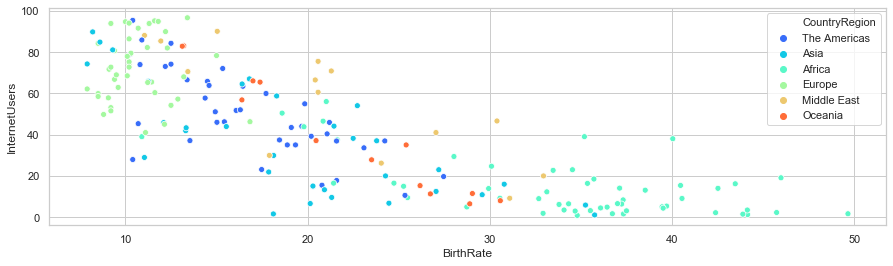

In [207]:
plt.figure(figsize = (15,4))
vis2 = sns.scatterplot(data = merged_data, 
                  x = 'BirthRate', 
                  y = 'InternetUsers',
                  hue = 'CountryRegion',
                  palette = 'rainbow')

plt.show()

## Create three new lists

In [208]:
Country_Code = list (["ABW","AFG","AGO","ALB","ARE","ARG","ARM","ATG","AUS","AUT","AZE","BDI","BEL","BEN","BFA","BGD","BGR","BHR","BHS","BIH","BLR","BLZ","BOL","BRA","BRB","BRN","BTN","BWA","CAF","CAN","CHE","CHL","CHN","CIV","CMR","COG","COL","COM","CPV","CRI","CUB","CYP","CZE","DEU","DJI","DNK","DOM","DZA","ECU","EGY","ERI","ESP","EST","ETH","FIN","FJI","FRA","FSM","GAB","GBR","GEO","GHA","GIN","GMB","GNB","GNQ","GRC","GRD","GTM","GUM","GUY","HKG","HND","HRV","HTI","HUN","IDN","IND","IRL","IRN","IRQ","ISL","ITA","JAM","JOR","JPN","KAZ","KEN","KGZ","KHM","KIR","KOR","KWT","LAO","LBN","LBR","LBY","LCA","LKA","LSO","LTU","LUX","LVA","MAC","MAR","MDA","MDG","MDV","MEX","MKD","MLI","MLT","MMR","MNE","MNG","MOZ","MRT","MUS","MWI","MYS","NAM","NCL","NER","NGA","NIC","NLD","NOR","NPL","NZL","OMN","PAK","PAN","PER","PHL","PNG","POL","PRI","PRT","PRY","PYF","QAT","ROU","RUS","RWA","SAU","SDN","SEN","SGP","SLB","SLE","SLV","SOM","SSD","STP","SUR","SVK","SVN","SWE","SWZ","SYR","TCD","TGO","THA","TJK","TKM","TLS","TON","TTO","TUN","TUR","TZA","UGA","UKR","URY","USA","UZB","VCT","VEN","VIR","VNM","VUT","WSM","YEM","ZAF","COD","ZMB","ZWE"])
Life_Expectancy_At_Birth_1960 = list ([65.5693658536586,32.328512195122,32.9848292682927,62.2543658536585,52.2432195121951,65.2155365853659,65.8634634146342,61.7827317073171,70.8170731707317,68.5856097560976,60.836243902439,41.2360487804878,69.7019512195122,37.2782682926829,34.4779024390244,45.8293170731707,69.2475609756098,52.0893658536585,62.7290487804878,60.2762195121951,67.7080975609756,59.9613658536585,42.1183170731707,54.2054634146342,60.7380487804878,62.5003658536585,32.3593658536585,50.5477317073171,36.4826341463415,71.1331707317073,71.3134146341463,57.4582926829268,43.4658048780488,36.8724146341463,41.523756097561,48.5816341463415,56.716756097561,41.4424390243903,48.8564146341463,60.5761951219512,63.9046585365854,69.5939268292683,70.3487804878049,69.3129512195122,44.0212682926829,72.1765853658537,51.8452682926829,46.1351219512195,53.215,48.0137073170732,37.3629024390244,69.1092682926829,67.9059756097561,38.4057073170732,68.819756097561,55.9584878048781,69.8682926829268,57.5865853658537,39.5701219512195,71.1268292682927,63.4318536585366,45.8314634146342,34.8863902439024,32.0422195121951,37.8404390243902,36.7330487804878,68.1639024390244,59.8159268292683,45.5316341463415,61.2263414634146,60.2787317073171,66.9997073170732,46.2883170731707,64.6086585365854,42.1000975609756,68.0031707317073,48.6403170731707,41.1719512195122,69.691756097561,44.945512195122,48.0306829268293,73.4286585365854,69.1239024390244,64.1918292682927,52.6852682926829,67.6660975609756,58.3675853658537,46.3624146341463,56.1280731707317,41.2320243902439,49.2159756097561,53.0013170731707,60.3479512195122,43.2044634146342,63.2801219512195,34.7831707317073,42.6411951219512,57.303756097561,59.7471463414634,46.5107073170732,69.8473170731707,68.4463902439024,69.7868292682927,64.6609268292683,48.4466341463415,61.8127804878049,39.9746829268293,37.2686341463415,57.0656341463415,60.6228048780488,28.2116097560976,67.6017804878049,42.7363902439024,63.7056097560976,48.3688048780488,35.0037073170732,43.4830975609756,58.7452195121951,37.7736341463415,59.4753414634146,46.8803902439024,58.6390243902439,35.5150487804878,37.1829512195122,46.9988292682927,73.3926829268293,73.549756097561,35.1708292682927,71.2365853658537,42.6670731707317,45.2904634146342,60.8817073170732,47.6915853658537,57.8119268292683,38.462243902439,67.6804878048781,68.7196097560976,62.8089268292683,63.7937073170732,56.3570487804878,61.2060731707317,65.6424390243903,66.0552926829268,42.2492926829268,45.6662682926829,48.1876341463415,38.206,65.6598292682927,49.3817073170732,30.3315365853659,49.9479268292683,36.9658780487805,31.6767073170732,50.4513658536585,59.6801219512195,69.9759268292683,68.9780487804878,73.0056097560976,44.2337804878049,52.768243902439,38.0161219512195,40.2728292682927,54.6993170731707,56.1535365853659,54.4586829268293,33.7271219512195,61.3645365853659,62.6575853658537,42.009756097561,45.3844146341463,43.6538780487805,43.9835609756098,68.2995365853659,67.8963902439025,69.7707317073171,58.8855365853659,57.7238780487805,59.2851219512195,63.7302195121951,59.0670243902439,46.4874878048781,49.969512195122,34.3638048780488,49.0362926829268,41.0180487804878,45.1098048780488,51.5424634146342])
Life_Expectancy_At_Birth_2013 = list ([75.3286585365854,60.0282682926829,51.8661707317073,77.537243902439,77.1956341463415,75.9860975609756,74.5613658536585,75.7786585365854,82.1975609756098,80.890243902439,70.6931463414634,56.2516097560976,80.3853658536585,59.3120243902439,58.2406341463415,71.245243902439,74.4658536585366,76.5459512195122,75.0735365853659,76.2769268292683,72.4707317073171,69.9820487804878,67.9134390243903,74.1224390243903,75.3339512195122,78.5466585365854,69.1029268292683,64.3608048780488,49.8798780487805,81.4011219512195,82.7487804878049,81.1979268292683,75.3530243902439,51.2084634146342,55.0418048780488,61.6663902439024,73.8097317073171,62.9321707317073,72.9723658536585,79.2252195121951,79.2563902439025,79.9497804878049,78.2780487804878,81.0439024390244,61.6864634146342,80.3024390243903,73.3199024390244,74.5689512195122,75.648512195122,70.9257804878049,63.1778780487805,82.4268292682927,76.4243902439025,63.4421951219512,80.8317073170732,69.9179268292683,81.9682926829268,68.9733902439024,63.8435853658537,80.9560975609756,74.079512195122,61.1420731707317,58.216487804878,59.9992682926829,54.8384146341464,57.2908292682927,80.6341463414634,73.1935609756098,71.4863902439024,78.872512195122,66.3100243902439,83.8317073170732,72.9428536585366,77.1268292682927,62.4011463414634,75.2682926829268,68.7046097560976,67.6604146341463,81.0439024390244,75.1259756097561,69.4716829268293,83.1170731707317,82.290243902439,73.4689268292683,73.9014146341463,83.3319512195122,70.45,60.9537804878049,70.2024390243902,67.7720487804878,65.7665853658537,81.459756097561,74.462756097561,65.687243902439,80.1288780487805,60.5203902439024,71.6576829268293,74.9127073170732,74.2402926829268,49.3314634146342,74.1634146341464,81.7975609756098,73.9804878048781,80.3391463414634,73.7090487804878,68.811512195122,64.6739024390244,76.6026097560976,76.5326585365854,75.1870487804878,57.5351951219512,80.7463414634146,65.6540975609756,74.7583658536585,69.0618048780488,54.641512195122,62.8027073170732,74.46,61.466,74.567512195122,64.3438780487805,77.1219512195122,60.8281463414634,52.4421463414634,74.514756097561,81.1048780487805,81.4512195121951,69.222,81.4073170731707,76.8410487804878,65.9636829268293,77.4192195121951,74.2838536585366,68.1315609756097,62.4491707317073,76.8487804878049,78.7111951219512,80.3731707317073,72.7991707317073,76.3340731707317,78.4184878048781,74.4634146341463,71.0731707317073,63.3948292682927,74.1776341463415,63.1670487804878,65.878756097561,82.3463414634146,67.7189268292683,50.3631219512195,72.4981463414634,55.0230243902439,55.2209024390244,66.259512195122,70.99,76.2609756097561,80.2780487804878,81.7048780487805,48.9379268292683,74.7157804878049,51.1914878048781,59.1323658536585,74.2469268292683,69.4001707317073,65.4565609756098,67.5223658536585,72.6403414634147,70.3052926829268,73.6463414634147,75.1759512195122,64.2918292682927,57.7676829268293,71.159512195122,76.8361951219512,78.8414634146341,68.2275853658537,72.8108780487805,74.0744146341464,79.6243902439024,75.756487804878,71.669243902439,73.2503902439024,63.583512195122,56.7365853658537,58.2719268292683,59.2373658536585,55.633])

## Convert lists to dataframe

In [209]:
life_exp_data = pd.DataFrame({'CountryCode':np.array(Country_Code),
                             'LifeExp1960':np.array(Life_Expectancy_At_Birth_1960),
                             'LifeExp2013':np.array(Life_Expectancy_At_Birth_2013)})

In [210]:
len(life_exp_data)

187

In [211]:
life_exp_data.describe()

,LifeExp1960,LifeExp2013
count,187.000000,187.000000
mean,53.734112,70.763808
std,12.182463,8.590893
min,28.211610,48.937927
25%,43.474451,64.517354
50%,54.699317,73.250390
75%,64.048244,76.838622
max,73.549756,83.831707


## Merge new dataframe to previously merged dataframe

In [212]:
merge_data = pd.merge(left = merged_data, right =life_exp_data, how = 'inner', on = 'CountryCode')

In [213]:
merge_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 187 entries, 0 to 186
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CountryName_x  187 non-null    object 
 1   CountryCode    187 non-null    object 
 2   BirthRate      187 non-null    float64
 3   InternetUsers  187 non-null    float64
 4   IncomeGroup    187 non-null    object 
 5   CountryName_y  187 non-null    object 
 6   CountryRegion  187 non-null    object 
 7   LifeExp1960    187 non-null    float64
 8   LifeExp2013    187 non-null    float64
dtypes: float64(4), object(5)
memory usage: 14.6+ KB


## Delete extra country name column

In [214]:
del merge_data['CountryName_y']

## Rename CountryName_x

In [215]:
merge_data.rename(columns = {'CountryName_x':'CountryName'}, inplace = True)

In [216]:
merge_data.head()

,CountryName,CountryCode,BirthRate,InternetUsers,IncomeGroup,CountryRegion,LifeExp1960,LifeExp2013
0,Aruba,ABW,10.244,78.9,High income,The Americas,65.569366,75.328659
1,Afghanistan,AFG,35.253,5.9,Low income,Asia,32.328512,60.028268
2,Angola,AGO,45.985,19.1,Upper middle income,Africa,32.984829,51.866171
3,Albania,ALB,12.877,57.2,Upper middle income,Europe,62.254366,77.537244
4,United Arab Emirates,ARE,11.044,88.0,High income,Middle East,52.243220,77.195634


## Visualization 3

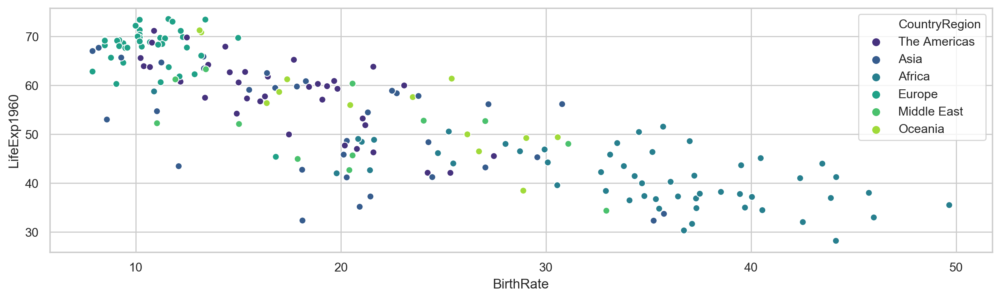

In [217]:
plt.figure(figsize = (15,4), dpi = 200)
vis3 = sns.scatterplot(data = merge_data, 
                       x = 'BirthRate', 
                       y = 'LifeExp1960',
                       hue = 'CountryRegion',
                       palette = 'viridis');

## Visualization 4

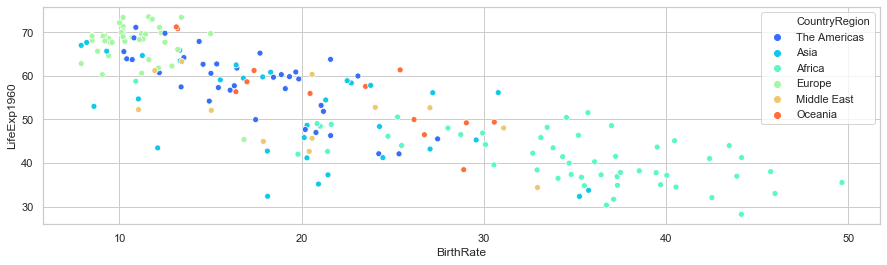

In [218]:
plt.figure(figsize = (15,4))
vis4 = sns.scatterplot(data = merge_data, 
                          x = 'BirthRate', 
                          y = 'LifeExp1960',
                          hue = 'CountryRegion',
                          palette = 'rainbow');

# Case 2 - Melbourne Housing Extra Data

## Importing the Data

In [219]:
# Import data
dataset = pd.read_csv('dados/Melbourne_housing_extra_data.csv')

## Get number of rows and columns

In [220]:
dataset.shape

(17407, 21)

## View data

In [221]:
dataset.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.5,3067,...,1.0,1.0,126.0,NaN,NaN,Yarra,-37.8014,144.9958,Northern Metropolitan,4019
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.5,3067,...,2.0,1.0,0.0,NaN,NaN,Yarra,-37.8114,145.0116,Northern Metropolitan,4019
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019


## Get Vars Types and Data Missing

In [222]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17407 entries, 0 to 17406
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         17407 non-null  object 
 1   Address        17407 non-null  object 
 2   Rooms          17407 non-null  int64  
 3   Type           17407 non-null  object 
 4   Price          13525 non-null  float64
 5   Method         17407 non-null  object 
 6   SellerG        17407 non-null  object 
 7   Date           17407 non-null  object 
 8   Distance       17407 non-null  float64
 9   Postcode       17407 non-null  int64  
 10  Bedroom2       13625 non-null  float64
 11  Bathroom       13625 non-null  float64
 12  Car            13625 non-null  float64
 13  Landsize       13603 non-null  float64
 14  BuildingArea   7323 non-null   float64
 15  YearBuilt      8429 non-null   float64
 16  CouncilArea    13601 non-null  object 
 17  Lattitude      13737 non-null  float64
 18  Longti

## View column names

In [223]:
dataset.columns

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')

## Change column names

In [224]:
dataset.columns = ['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
                     'Date', 'Distance', 'PostCode', 'Bedroom2', 'Bathroom', 'Car',
                 'LandSize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
               'Longtitude', 'RegionName', 'PropertyCount']
dataset.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,PostCode,...,Bathroom,Car,LandSize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,RegionName,PropertyCount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.5,3067,...,1.0,1.0,126.0,NaN,NaN,Yarra,-37.8014,144.9958,Northern Metropolitan,4019
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.5,3067,...,2.0,1.0,0.0,NaN,NaN,Yarra,-37.8114,145.0116,Northern Metropolitan,4019
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019


## Remove unnecessary columns and reorder so independent variable is last

In [225]:
dataset = dataset[['Suburb','Rooms', 'Type','Method','Distance', 'PostCode', 
                   'Bedroom2', 'Bathroom', 'Car','LandSize', 'BuildingArea', 
                   'YearBuilt', 'RegionName', 'PropertyCount','Price']]

dataset.head()

,Suburb,Rooms,Type,Method,Distance,PostCode,Bedroom2,Bathroom,Car,LandSize,BuildingArea,YearBuilt,RegionName,PropertyCount,Price
0,Abbotsford,2,h,SS,2.5,3067,2.0,1.0,1.0,126.0,NaN,NaN,Northern Metropolitan,4019,NaN
1,Abbotsford,2,h,S,2.5,3067,2.0,1.0,1.0,202.0,NaN,NaN,Northern Metropolitan,4019,1480000.0
2,Abbotsford,2,h,S,2.5,3067,2.0,1.0,0.0,156.0,79.0,1900.0,Northern Metropolitan,4019,1035000.0
3,Abbotsford,3,u,VB,2.5,3067,3.0,2.0,1.0,0.0,NaN,NaN,Northern Metropolitan,4019,NaN
4,Abbotsford,3,h,SP,2.5,3067,3.0,2.0,0.0,134.0,150.0,1900.0,Northern Metropolitan,4019,1465000.0


## Missing Values

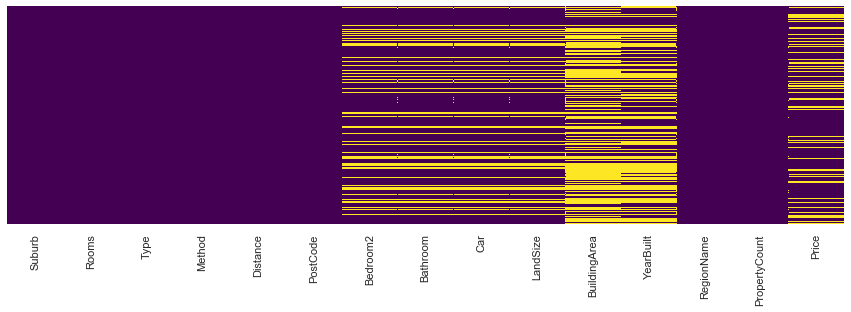

In [226]:
plt.figure(figsize = (15,4))
sns.heatmap(dataset.isnull(),yticklabels = False, cbar = False, cmap = 'viridis')
plt.show()

## Count of missing values

In [227]:
dataset.isnull().sum()

Suburb               0
Rooms                0
Type                 0
Method               0
Distance             0
PostCode             0
Bedroom2          3782
Bathroom          3782
Car               3782
LandSize          3804
BuildingArea     10084
YearBuilt         8978
RegionName           0
PropertyCount        0
Price             3882
dtype: int64

## Percentage of values missing

In [228]:
dataset.isnull().sum()/len(dataset)*100

Suburb            0.000000
Rooms             0.000000
Type              0.000000
Method            0.000000
Distance          0.000000
PostCode          0.000000
Bedroom2         21.726891
Bathroom         21.726891
Car              21.726891
LandSize         21.853277
BuildingArea     57.930718
YearBuilt        51.576952
RegionName        0.000000
PropertyCount     0.000000
Price            22.301373
dtype: float64

## Remove missing rows

to remove missing rows from a specific column: dataset = dataset[pd.notnull(dataset['Price'])]

In [229]:
dataset = dataset.dropna() # set axis to 1 to drop entire columns that have a missing value

## View data types

In [230]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5386 entries, 2 to 17405
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         5386 non-null   object 
 1   Rooms          5386 non-null   int64  
 2   Type           5386 non-null   object 
 3   Method         5386 non-null   object 
 4   Distance       5386 non-null   float64
 5   PostCode       5386 non-null   int64  
 6   Bedroom2       5386 non-null   float64
 7   Bathroom       5386 non-null   float64
 8   Car            5386 non-null   float64
 9   LandSize       5386 non-null   float64
 10  BuildingArea   5386 non-null   float64
 11  YearBuilt      5386 non-null   float64
 12  RegionName     5386 non-null   object 
 13  PropertyCount  5386 non-null   int64  
 14  Price          5386 non-null   float64
dtypes: float64(8), int64(3), object(4)
memory usage: 673.2+ KB


## Identify object columns

Non-null object types should be converted to categories to allow for better anaylysis.

In [231]:
dataset.select_dtypes(['object']).columns

Index(['Suburb', 'Type', 'Method', 'RegionName'], dtype='object')

## Convert non-null objects to category

In [232]:
o2c = dataset.select_dtypes(['object']).columns

for o in o2c:
    dataset[o] = dataset[o].astype('category')
    
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5386 entries, 2 to 17405
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Suburb         5386 non-null   category
 1   Rooms          5386 non-null   int64   
 2   Type           5386 non-null   category
 3   Method         5386 non-null   category
 4   Distance       5386 non-null   float64 
 5   PostCode       5386 non-null   int64   
 6   Bedroom2       5386 non-null   float64 
 7   Bathroom       5386 non-null   float64 
 8   Car            5386 non-null   float64 
 9   LandSize       5386 non-null   float64 
 10  BuildingArea   5386 non-null   float64 
 11  YearBuilt      5386 non-null   float64 
 12  RegionName     5386 non-null   category
 13  PropertyCount  5386 non-null   int64   
 14  Price          5386 non-null   float64 
dtypes: category(4), float64(8), int64(3)
memory usage: 543.9 KB


## Statistical Summary

Now it is time to examine the numeric variables by doing a statistical summary.

In [233]:
dataset.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Rooms,5386.0,2.913665e+00,0.971923,1.0,2.0,3.0,3.00,8.0
Distance,5386.0,9.131730e+00,4.778950,0.0,5.9,8.7,11.80,47.4
PostCode,5386.0,3.098063e+03,73.233367,3000.0,3043.0,3081.0,3146.00,3977.0
Bedroom2,5386.0,2.879874e+00,0.970242,0.0,2.0,3.0,3.00,9.0
Bathroom,5386.0,1.567583e+00,0.712262,1.0,1.0,1.0,2.00,8.0
Car,5386.0,1.556257e+00,0.936365,0.0,1.0,1.0,2.00,10.0
LandSize,5386.0,4.596144e+02,890.775233,0.0,145.0,351.0,618.75,37000.0
BuildingArea,5386.0,1.412544e+02,92.269960,0.0,90.0,122.0,169.00,3112.0
YearBuilt,5386.0,1.962319e+03,38.850927,1196.0,1935.0,1966.0,1999.00,2018.0
PropertyCount,5386.0,7.409759e+03,4332.894106,389.0,4407.0,6567.0,9264.00,21650.0


## Convert float to integer

From the stats summary above, it appears some numeric columns are assigned to the wrong data `type`.    

* Rooms, 
* Bedroom2, and 
* Bathroom, 
* Car, and 
* Propertycount 

should not be treated as floats as they are discrete values and should be identified as integers.    

- YearBuilt and 
- Postcode 

will need to be changed as well (to categorical).

In [234]:
f2i = ['Rooms','Bedroom2','Bathroom','Car']
for f in f2i:
       dataset[f] = dataset[f].astype('int')
dataset.describe().transpose()
       
# Convert appropriate columns to categorical
f2c = ['PostCode']
for ff in f2c:
    dataset[ff] = dataset[ff].astype('category')

# Confirm changes
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5386 entries, 2 to 17405
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Suburb         5386 non-null   category
 1   Rooms          5386 non-null   int32   
 2   Type           5386 non-null   category
 3   Method         5386 non-null   category
 4   Distance       5386 non-null   float64 
 5   PostCode       5386 non-null   category
 6   Bedroom2       5386 non-null   int32   
 7   Bathroom       5386 non-null   int32   
 8   Car            5386 non-null   int32   
 9   LandSize       5386 non-null   float64 
 10  BuildingArea   5386 non-null   float64 
 11  YearBuilt      5386 non-null   float64 
 12  RegionName     5386 non-null   category
 13  PropertyCount  5386 non-null   int64   
 14  Price          5386 non-null   float64 
dtypes: category(5), float64(5), int32(4), int64(1)
memory usage: 434.5 KB


## Data Analysis

In [235]:
# Feature engineering

# Convert price to millions
dataset['Price'] = dataset['Price']/1000000

# Home Age
dataset['HomeAge'] = 2017 - dataset['YearBuilt']

# Identify homes older than 50 years old as historic
dataset['Historic'] = np.where(dataset['HomeAge']>=50,1,0)

# Confirm changes
dataset.head()   

,Suburb,Rooms,Type,Method,Distance,PostCode,Bedroom2,Bathroom,Car,LandSize,BuildingArea,YearBuilt,RegionName,PropertyCount,Price,HomeAge,Historic
2,Abbotsford,2,h,S,2.5,3067,2,1,0,156.0,79.0,1900.0,Northern Metropolitan,4019,1.035,117.0,1
4,Abbotsford,3,h,SP,2.5,3067,3,2,0,134.0,150.0,1900.0,Northern Metropolitan,4019,1.465,117.0,1
6,Abbotsford,4,h,VB,2.5,3067,3,1,2,120.0,142.0,2014.0,Northern Metropolitan,4019,1.600,3.0,0
11,Abbotsford,3,h,S,2.5,3067,4,2,0,245.0,210.0,1910.0,Northern Metropolitan,4019,1.876,107.0,1
14,Abbotsford,2,h,S,2.5,3067,2,1,2,256.0,107.0,1890.0,Northern Metropolitan,4019,1.636,127.0,1


## Univariate Analysis 

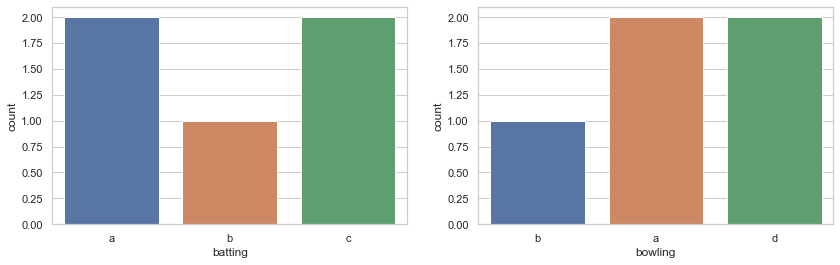

In [236]:
batData = ['a','b','c','a','c']
bowlData = ['b','a','d','d','a']

df=pd.DataFrame()
df['batting']=batData
df['bowling']=bowlData


fig, ax =plt.subplots(1,2, figsize = (14,4))
sns.countplot(df['batting'], ax=ax[0])
sns.countplot(df['bowling'], ax=ax[1])
fig.show()

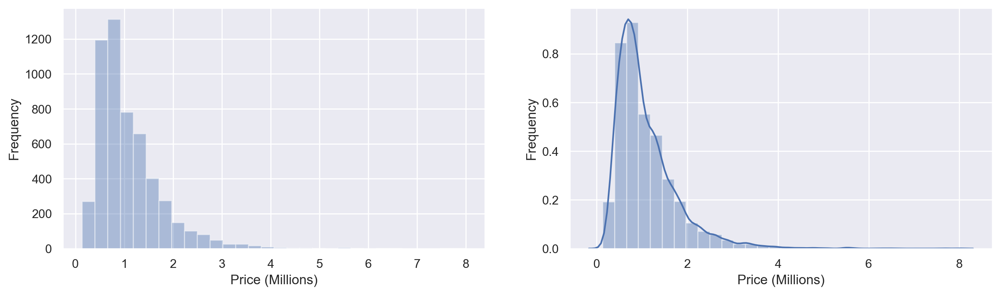

In [237]:
sns.set_style('darkgrid')

fig , ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15,4), dpi = 200)
sns.distplot(dataset['Price'], kde = False, bins = 30, ax = ax[0])
ax[0].set_xlabel('Price (Millions)')
ax[0].set_ylabel('Frequency')
sns.distplot(dataset['Price'], kde = True,  bins = 30, ax = ax[1])
ax[1].set_xlabel('Price (Millions)')
ax[1].set_ylabel('Frequency')
fig.show()

## Bivariate Analysis

### Categorical Features

- Next, I want to compare the relationship between the categorical features and the Price.
- Identify categorical variables

In [238]:
categorical = dataset.select_dtypes(['category']).columns

In [239]:
print(categorical)

Index(['Suburb', 'Type', 'Method', 'PostCode', 'RegionName'], dtype='object')


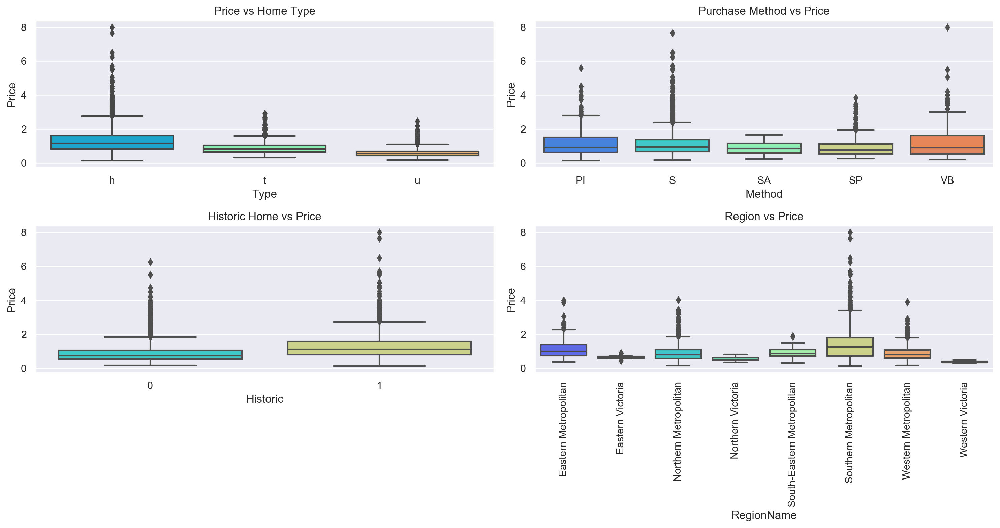

In [244]:
# Create subplot
fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (15,8), dpi = 200)

# Plot [0,0]
p1 =sns.boxplot(dataset.Type, dataset.Price, ax = ax[0,0], palette = 'rainbow')
p1.title.set_text('Price vs Home Type')

# Plot [0,1]
p2 = sns.boxplot(dataset.Method, dataset.Price, ax = ax[0,1],palette = 'rainbow')
p2.title.set_text('Purchase Method vs Price')

# Plot [1,0]
p3 = sns.boxplot(dataset.Historic, dataset.Price, ax=ax[1,0],palette = 'rainbow')
p3.title.set_text('Historic Home vs Price')

# Plot [1,1]
p4 = sns.boxplot(dataset.RegionName, dataset.Price, ax = ax[1,1],palette = 'rainbow')
p4.title.set_text('Region vs Price')
plt.xticks(rotation = 90)

#plt.show()

fig.tight_layout()

In [ ]:
# Removing the outlier
#tdataset = dataset[dataset['Price']<8]
#tdataset.describe().transpose()

### Numeric Features
Next I want to analyze the numeric features as they relate to the indpedent variable, Price.

In [245]:
# Stat summary
dataset.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Rooms,5386.0,2.913665,0.971923,1.000,2.00000,3.0,3.000000,8.0
Distance,5386.0,9.131730,4.778950,0.000,5.90000,8.7,11.800000,47.4
Bedroom2,5386.0,2.879874,0.970242,0.000,2.00000,3.0,3.000000,9.0
Bathroom,5386.0,1.567583,0.712262,1.000,1.00000,1.0,2.000000,8.0
Car,5386.0,1.556257,0.936365,0.000,1.00000,1.0,2.000000,10.0
LandSize,5386.0,459.614371,890.775233,0.000,145.00000,351.0,618.750000,37000.0
BuildingArea,5386.0,141.254433,92.269960,0.000,90.00000,122.0,169.000000,3112.0
YearBuilt,5386.0,1962.318789,38.850927,1196.000,1935.00000,1966.0,1999.000000,2018.0
PropertyCount,5386.0,7409.758819,4332.894106,389.000,4407.00000,6567.0,9264.000000,21650.0
Price,5386.0,1.092251,0.683168,0.131,0.63525,0.9,1.350875,8.0


In [246]:
# Identify continuous variables
print(dataset.select_dtypes(['float']).columns)

Index(['Distance', 'LandSize', 'BuildingArea', 'YearBuilt', 'Price',
       'HomeAge'],
      dtype='object')


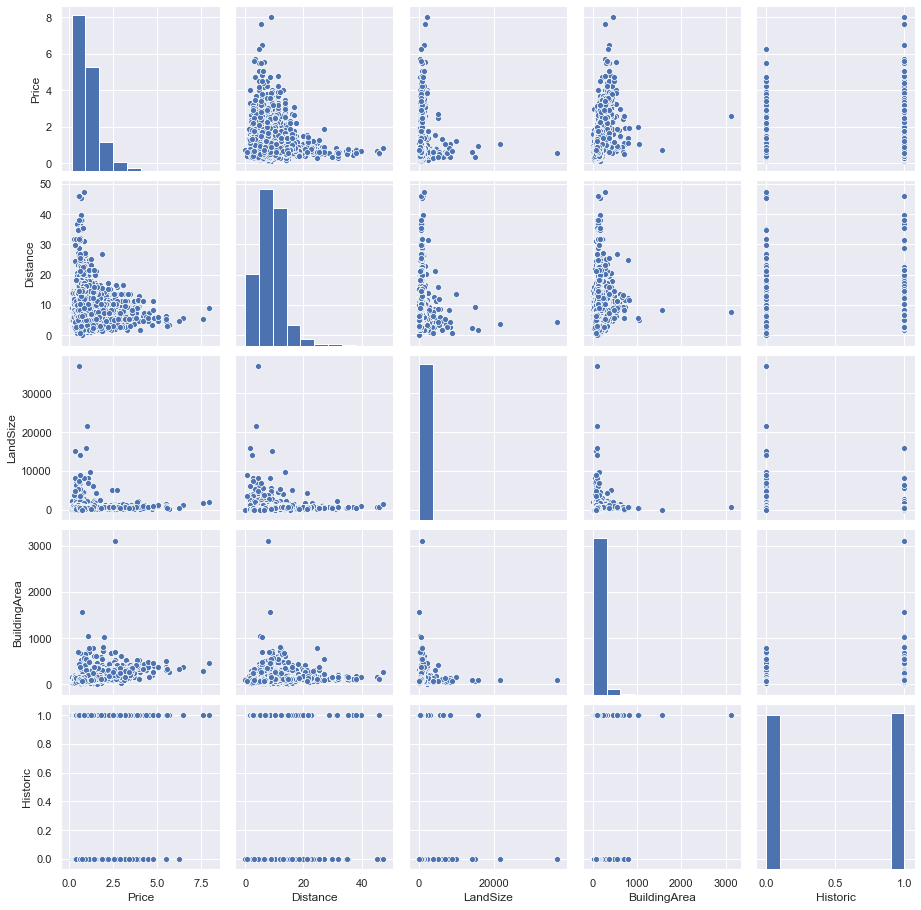

In [248]:
# Plot
sns.pairplot(dataset,
             vars= ['Price','Distance', 'LandSize', 'BuildingArea','Historic'], palette = 'viridis');

**Insights:**  
Prices for historic homes have more variation than that of non-historic homes (less than 50 years old).  
Homes that are a farther distance from the Central Business District (CDB) tend to be priced lower.


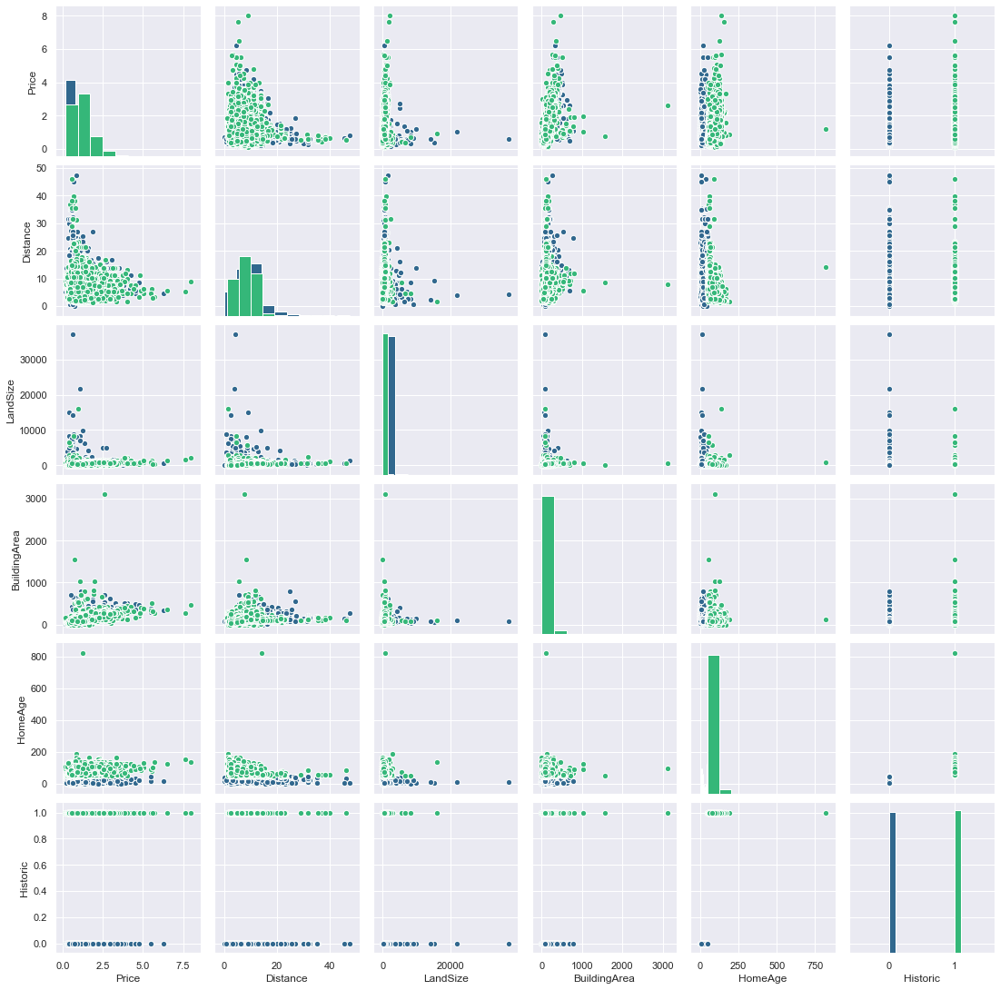

In [249]:
# Plot
g =sns.PairGrid(dataset,
             vars= ['Price','Distance', 'LandSize', 'BuildingArea','HomeAge','Historic'], 
             hue = 'Historic',
             palette = 'viridis')
g = g.map_diag(plt.hist)
g = g.map_offdiag(plt.scatter, edgecolor = 'w', s = 40);

# Building Dashboards in Python

In [161]:
plt.rcParams["patch.force_edgecolor"] = True

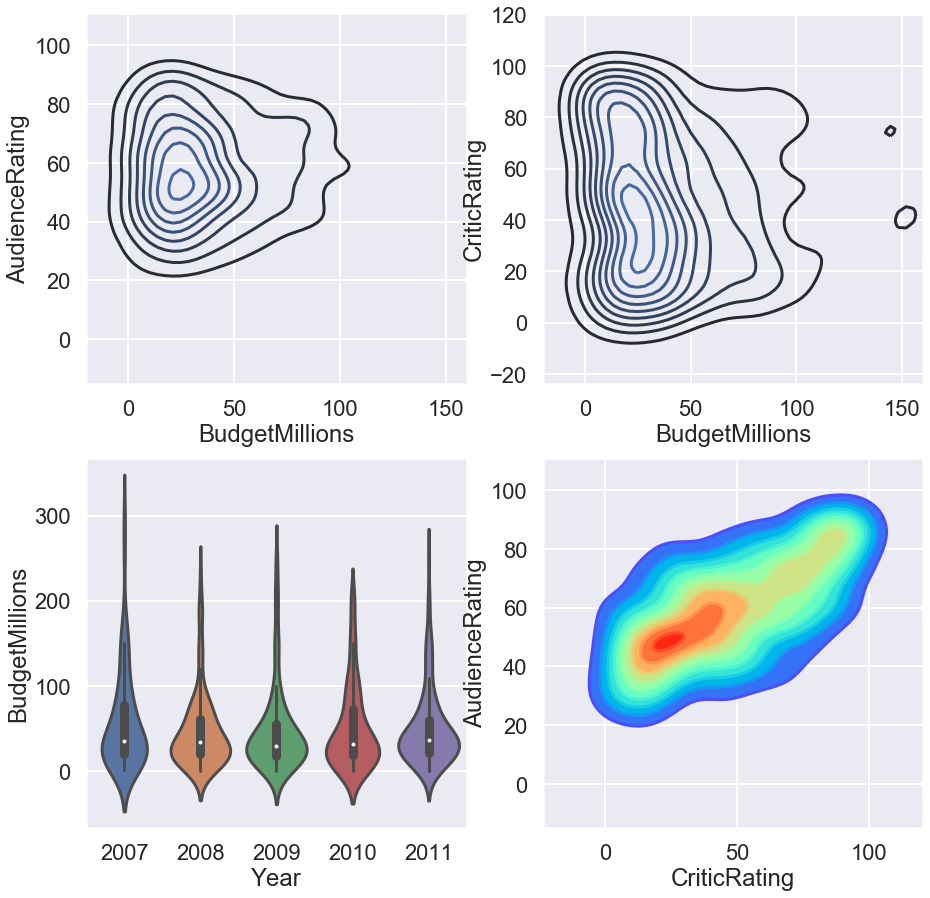

In [162]:
sns.set_style('darkgrid')
f, axes = plt.subplots(2,2, figsize = (15,15))

# Plot [0,0]
k1 = sns.kdeplot(movies.BudgetMillions, movies.AudienceRating, \
                 ax = axes[0,0])

# Plot [0,1]
k2 = sns.kdeplot(movies.BudgetMillions, movies.CriticRating,\
                 ax = axes[0,1])

k1.set(xlim = (-20, 160))
k2.set(xlim = (-20, 160))  # show axis on each separate plot

# Plot [1,0]
z = sns.violinplot(data = movies, \
                   x = 'Year', y = 'BudgetMillions', ax = axes[1,0])

# Plot [1,1]
k4 = sns.kdeplot(movies.CriticRating, movies.AudienceRating, \
                 shade = True, shade_lowest = False, cmap = 'rainbow',\
                 ax = axes[1,1])

# Tip: for smoother edges 
k4b = sns.kdeplot(movies.CriticRating, movies.AudienceRating,\
                 cmap = 'rainbow', ax = axes[1,1])

# axes[1,1].hist(movies.CriticRating, bins = 15) # adding graph that is not seaborn

plt.show()

# Styling Dashboards

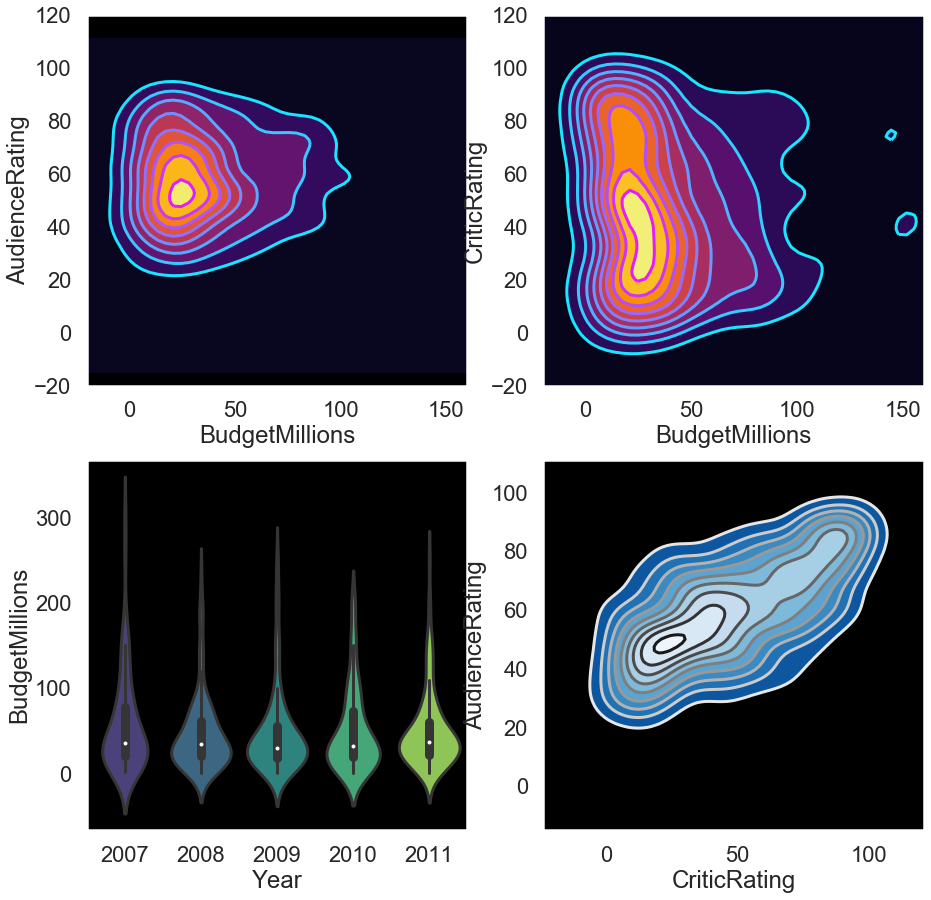

In [163]:
sns.set_style('dark',{'axes.facecolor':'black'}) # pre-defined options are white, whitegrid, dark, darkgrid, ticks so need to pass keyword argument
f, axes = plt.subplots(2,2, figsize = (15,15))

# Plot [0,0]
k1 = sns.kdeplot(movies.BudgetMillions, movies.AudienceRating, \
                 shade = True, shade_lowest = True, cmap = 'inferno',\
                 ax = axes[0,0])

k1b = sns.kdeplot(movies.BudgetMillions, movies.AudienceRating, \
                 cmap = 'cool', ax = axes[0,0])
# Plot [0,1]
k2 = sns.kdeplot(movies.BudgetMillions, movies.CriticRating,\
                 shade = True, shade_lowest = True, cmap = 'inferno',\
                 ax = axes[0,1])

k2b = sns.kdeplot(movies.BudgetMillions, movies.CriticRating,\
                 cmap = 'cool', ax = axes[0,1])

k1.set(xlim = (-20, 160), ylim = (-20,120))
k2.set(xlim = (-20, 160), ylim = (-20,120))  # show axis for each separate plot


# Plot [1,0]
z = sns.violinplot(data = movies,\
                   x = 'Year', y = 'BudgetMillions', ax = axes[1,0], \
                  palette = 'viridis')

# Plot [1,1]
k4 = sns.kdeplot(movies.CriticRating, movies.AudienceRating, \
                 shade = True, shade_lowest = False, cmap = 'Blues_r',\
                 ax = axes[1,1])

# Tip: for smoother edges 
k4b = sns.kdeplot(movies.CriticRating, movies.AudienceRating,\
                 cmap = 'gist_gray_r', ax = axes[1,1])
plt.show()

### Color Map Options
Possible values are: Accent, Accent_r, Blues, Blues_r, BrBG, BrBG_r, BuGn, BuGn_r, BuPu, BuPu_r, CMRmap, CMRmap_r, Dark2, Dark2_r, GnBu, GnBu_r, Greens, Greens_r, Greys, Greys_r, OrRd, OrRd_r, Oranges, Oranges_r, PRGn, PRGn_r, Paired, Paired_r, Pastel1, Pastel1_r, Pastel2, Pastel2_r, PiYG, PiYG_r, PuBu, PuBuGn, PuBuGn_r, PuBu_r, PuOr, PuOr_r, PuRd, PuRd_r, Purples, Purples_r, RdBu, RdBu_r, RdGy, RdGy_r, RdPu, RdPu_r, RdYlBu, RdYlBu_r, RdYlGn, RdYlGn_r, Reds, Reds_r, Set1, Set1_r, Set2, Set2_r, Set3, Set3_r, Spectral, Spectral_r, Vega10, Vega10_r, Vega20, Vega20_r, Vega20b, Vega20b_r, Vega20c, Vega20c_r, Wistia, Wistia_r, YlGn, YlGnBu, YlGnBu_r, YlGn_r, YlOrBr, YlOrBr_r, YlOrRd, YlOrRd_r, afmhot, afmhot_r, autumn, autumn_r, binary, binary_r, bone, bone_r, brg, brg_r, bwr, bwr_r, cool, cool_r, coolwarm, coolwarm_r, copper, copper_r, cubehelix, cubehelix_r, flag, flag_r, gist_earth, gist_earth_r, gist_gray, gist_gray_r, gist_heat, gist_heat_r, gist_ncar, gist_ncar_r, gist_rainbow, gist_rainbow_r, gist_stern, gist_stern_r, gist_yarg, gist_yarg_r, gnuplot, gnuplot2, gnuplot2_r, gnuplot_r, gray, gray_r, hot, hot_r, hsv, hsv_r, inferno, inferno_r, jet, jet_r, magma, magma_r, nipy_spectral, nipy_spectral_r, ocean, ocean_r, pink, pink_r, plasma, plasma_r, prism, prism_r, rainbow, rainbow_r, seismic, seismic_r, spectral, spectral_r, spring, spring_r, summer, summer_r, tab10, tab10_r, tab20, tab20_r, tab20b, tab20b_r, tab20c, tab20c_r, terrain, terrain_r, viridis, viridis_r, winter, winter_r

### RGBA Color Options

aqua, aquamarine, azure, beige, black, blue, brown, chartreuse, chocolate, coral, crimson, cyan, darkblue, darkgreen, fuchsia, gold, goldenrod, green, grey, indigo, ivory, khaki, lavender, lightblue, lightgreen, lime, magenta, maroon, navy, olive, orange, orangered, orchid, pink, plum, purple, red, salmon, sienna, silver, tan, teal, tomato, turquoise, violet, wheat, white, yellow
yellowgreen

# EXERCISES

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plot
%matplotlib inline

# Load data
titanic = sns.load_dataset('titanic')
titanic.head()

In [ ]:
# Set style
sns.set_style('whitegrid')

In [ ]:
# Create joint distribution plot
sns.jointplot(x = 'fare', y = 'age', data = titanic)

In [ ]:
# Create histogram
sns.distplot(titanic['fare'], kde = False, color = 'orange',  bins = 30)

In [ ]:
# Create box plot
sns.boxplot(x = 'class', y = 'age', data = titanic, palette = 'rainbow')

In [ ]:
# Create swarm plot
sns.swarmplot(x = 'class', y = 'age', data = titanic, palette = 'Set2')

In [ ]:
# Create count plot
sns.countplot(x = 'sex', data = titanic)

In [ ]:
# Create correlation plot
sns.heatmap(titanic.corr(),cmap = 'coolwarm')
plt.title('titanic.corr()')

In [ ]:
# Create facet grid of histogram
g = sns.FacetGrid(data = titanic, col = 'sex')
g.map(plt.hist, 'age')

In [ ]:
# Create facet grid of distribution plot
g = sns.FacetGrid(data = titanic, col = 'sex')
g.map(sns.distplot, 'age')